In [5]:
import numpy as np
import itertools
import seaborn as sns
import copy
import matplotlib.pyplot as plt
from scipy.integrate import odeint
#import matplotlib.style
#import matplotlib as mpl
import time
%matplotlib inline
plt.rcParams['axes.linewidth'] = 0.2 #set the value globally
plt.rc('lines', linewidth=1)
plt.rcParams['xtick.major.size'] = 2
plt.rcParams['xtick.major.width'] = 1
plt.rcParams['xtick.minor.size'] = 1
plt.rcParams['xtick.minor.width'] = 1


#plt.rcParams['legend.fonstsize'] = 1
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10) 

plt.rcParams['font.size']=10
plt.rcParams.keys()
from cycler import cycler
import importlib
import pickle

# Figure 0: PKPD curves

In [6]:
def MakePDcurve(psi_max, psi_min, kappa, MIC, c_range):
    
    #print (c_range)
    N=1
    gamma=0.00007
    growth=psi_max* N 
    death=N * (gamma + (psi_max - psi_min) * (c_range / MIC)
                            ** kappa / ((c_range / MIC)**kappa - psi_min / psi_max))
    growth_rate=growth-death
    #print (growth_rate)
    return c_range, growth_rate

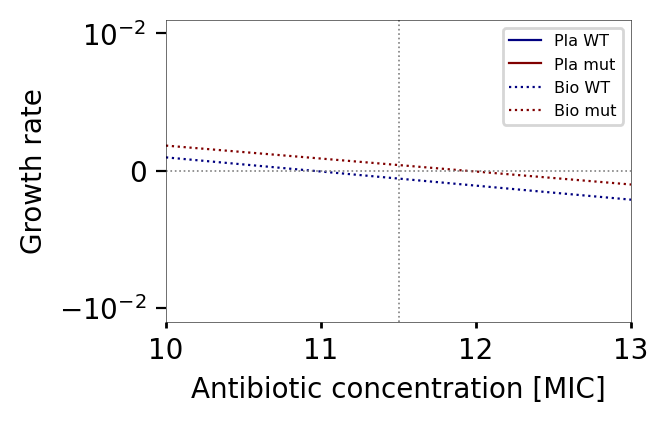

In [4]:

psi_max=0.0231
psi_min=-0.0833
kappa=1.5
MIC=1
c_range=np.linspace(0,20, 10000)


fig, ax = plt.subplots(dpi=200, figsize=(3,2))
ax.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2)])
[c_range, growth_rate]=MakePDcurve(psi_max, psi_min, kappa, MIC, c_range)  
plt.plot(c_range, growth_rate,  linewidth=0.8)

MIC2=MIC+1
[c_range, growth_rate]=MakePDcurve(0.8*psi_max, psi_min, kappa, MIC2, c_range)  
plt.plot(c_range, growth_rate,  linewidth=0.8)

MIC2=MIC+10
[c_range, growth_rate]=MakePDcurve(0.5*0.8*psi_max, 0.5*psi_min, kappa, MIC2, c_range)  
plt.plot(c_range, growth_rate, ':', linewidth=0.8)

MIC2=MIC+11
[c_range, growth_rate]=MakePDcurve(0.5*0.8*psi_max,0.5* psi_min, kappa, MIC2, c_range)  
plt.plot(c_range, growth_rate, ':', linewidth=0.8)


#ax.set_xscale('symlog',linthreshx=0.15)

#plt.axhline(y=0, color='b', linestyle=':', linewidth=0.6)
#plt.axvline(x=MIC2, color='red', linestyle=':', linewidth=0.6)
#plt.axvline(x=0.37*MIC, color='red', linestyle=':', linewidth=0.6)
#plt.axvline(x=1.2, color='red', linestyle='-', linewidth=37, alpha=0.2)
plt.xlabel('Antibiotic concentration [MIC]')
plt.ylabel('Growth rate')


plt.legend(['Pla WT','Pla mut','Bio WT','Bio mut'], fontsize='xx-small')


plt.axhline(y=0, color='gray', linestyle=':', linewidth=0.6)
#plt.axvline(x=MIC, color='b', linestyle=':', linewidth=0.6)
#plt.axvline(x=MIC+1, color='b', linestyle=':', linewidth=0.6)
#plt.axvline(x=MIC+10, color='b', linestyle=':', linewidth=0.6)
#plt.axvline(x=MIC+11, color='b', linestyle=':', linewidth=0.6)



plt.axvline(x=0.1, color='gray', linestyle=':', linewidth=0.6)
plt.axvline(x=1.5, color='gray', linestyle=':', linewidth=0.6)
plt.axvline(x=5, color='gray', linestyle=':', linewidth=0.6)
plt.axvline(x=11.5, color='gray', linestyle=':', linewidth=0.6)
plt.axvline(x=16.5, color='gray', linestyle=':', linewidth=0.6)


xlocs, xlabels = plt.xticks()

plt.xlim([10,13])
plt.ylim([-0.011,0.011])
#xlabels=[r'0',r'$\frac{MIC}{10}$', 'MIC', '10MIC', r'$10^2$MIC']
#xlabels=[r'0',r'$0.1$', '1', '10', r'$10^2$']
#print (xlocs)
xlocs=[10,11,12]



ylocs=[-0.01,0, 0.01]
ylabels=[r'$-10^{-2}$', 0, r'$10^{-2}$']
plt.yticks(ylocs, ylabels)



#print ('2', xlocs)
#print (xlabels)
#plt.xticks(xlocs, xlabels)
#xlocs[1]=2
#print (xlocs)
#plt.show()
plt.savefig('xxx200PKPDLog.png', dpi=200,bbox_inches='tight' )

# FIGURE 1- TRENDS PAPER RECAP

In [7]:
def plot_simple_dynamics(name='', N=1):
    savename0=name+'F'
    fig1, ax1 = plt.subplots(dpi=200, figsize=(7, 2))
    ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2)])

    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        this_conc=np.loadtxt(loadname+'_conc.txt')
        dynamics_pla=np.loadtxt(loadname+'_pla_pop.txt')
        plt.semilogy(this_time, dynamics_pla, alpha=0.1)
        #plt.semilogy(dynamics_pla, alpha=0.1)
    plt.xlabel('Time [h]')
    plt.ylabel('N')
   


    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        #this_conc=np.loadtxt(loadname+'_conc.txt')
        dynamics_bio=np.loadtxt(loadname+'_bio_pop.txt')
        plt.semilogy(this_time, dynamics_bio, ':', alpha=0.3)
        #plt.semilogy( dynamics_bio, alpha=0.3)
    #plt.title('Biofilm')
    plt.xlabel('Time [h]')
    plt.ylabel('N')
    plt.ylim(1,5*10**9)
    #plt.xlim(0,7)
    plt.xlim(0,5*24)
    plt.savefig('00'+name+'FigDyn.png', dpi=200,bbox_inches='tight')
    fig1.show()

    print ('all done')

<ipython-input-51-a01511ee86e8>:34: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


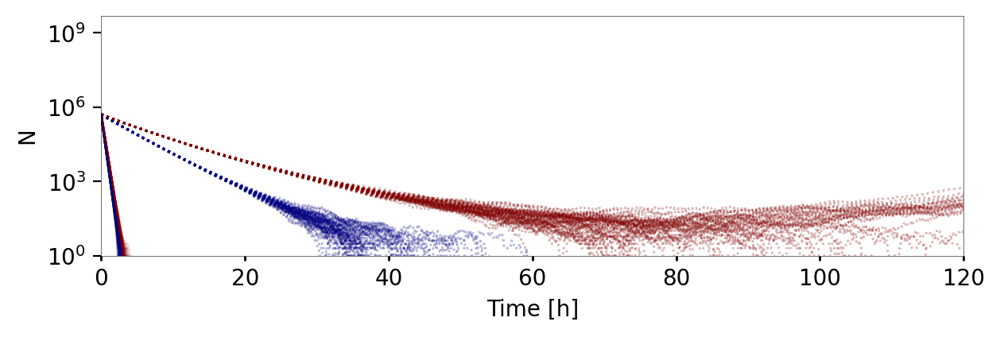

In [52]:
name='TrendsPaper_A6'
plot_simple_dynamics(name=name, N=50)

# Figures for slow down resistance

In [8]:
def generate_genotypes(k):  # this function generates 2^k phenotypes
    All = np.empty([0, k])
    for seq in itertools.product("01", repeat=k):
        s = np.array(seq)
        s = list(map(int, s))
        All = np.vstack([All, s])
    return All


def get_mean_mut_num(name='', N=1, color='b', k=1):
    fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
    ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

    gens=generate_genotypes(k)
    sum_mut=np.sum(gens,1)
    mut_weights=sum_mut
    for i in range (8):
            plt.axvline(x=12+i*24, color='green', linestyle='-', linewidth=21.5, alpha=0.1*i)

    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        
        pop=np.loadtxt(loadname+'_pla_pop.txt')
        weighted_pops=pop*mut_weights
        mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
        a=np.sum(weighted_pops,1)
        b=np.sum(pop,1)
        mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
        if mean_mut.any()<0:
            print ('negative', a,b)
        plt.plot(this_time, mean_mut,'red', linewidth=2, alpha=0.05)
        plt.xlim(0,8*24)
        plt.ylim(0,4.5)
        #print (mean_mut)
    plt.savefig(name+'MutNumPla.png', dpi=200,bbox_inches='tight')
    plt.show()
    
    fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
    ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])
    for i in range (8):
            plt.axvline(x=12+i*24, color='green', linestyle='-', linewidth=21.5, alpha=0.1*i)

    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        
        pop=np.loadtxt(loadname+'_bio_pop.txt')
        weighted_pops=pop*mut_weights
        mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
        a=np.sum(weighted_pops,1)
        b=np.sum(pop,1)
        mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
        if mean_mut.any()<0:
            print ('negative', a,b)
        plt.plot(this_time, mean_mut,'blue', linewidth=2, alpha=0.05)
        plt.xlim(0,8*24)
        #plt.ylim(0,4.5)
        #print (mean_mut)
   
    

    plt.xlabel('time [h]', fontsize=12)
    plt.ylabel('number of mutations', fontsize=12)
    plt.savefig(name+'MutNumBio.png', dpi=200,bbox_inches='tight')
    plt.show()
    
    print ('done')
    return (mean_mut, pop)

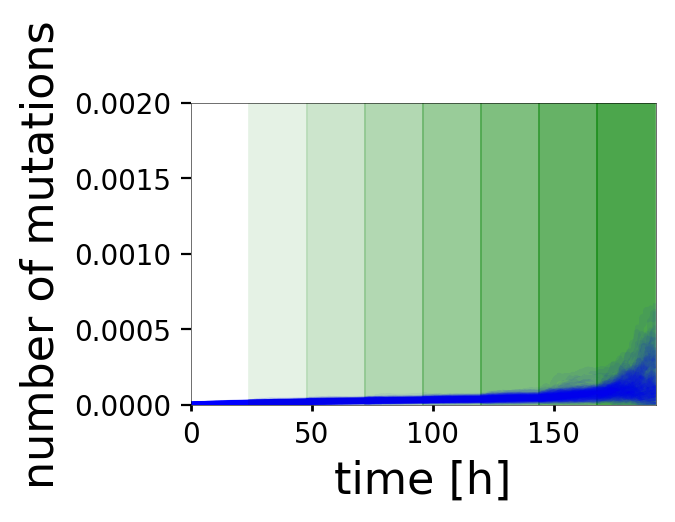

In [249]:
N=100
name1='00LongMutBioOnlyGenetics'
name2='00LongMutBioOnlyGenEPSPhysio'
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

gens=generate_genotypes(k)
sum_mut=np.sum(gens,1)
mut_weights=sum_mut
for i in range (8):
        plt.axvline(x=12+i*24, color='green', linestyle='-', linewidth=21.5, alpha=0.1*i)


for i in range (N):
    loadname=name2+str(i)
    this_time=np.loadtxt(loadname+'_time.txt')
    this_time=this_time/60
    pop=np.loadtxt(loadname+'_bio_pop.txt')
    weighted_pops=pop*mut_weights
    mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
    a=np.sum(weighted_pops,1)
    b=np.sum(pop,1)
    mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)

    plt.plot(this_time, mean_mut,'blue', linewidth=2, alpha=0.05)
    plt.xlim(0,8*24)
    plt.ylim(0,0.002)

plt.xlabel('time [h]', fontsize=16)
plt.ylabel('number of mutations', fontsize=16)
plt.savefig('00InsertMutNumBio.png', dpi=200,bbox_inches='tight')
plt.show()


<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted

<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted

<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted

<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-250-1d1b3d9fdb34>:22: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-250-1d1b3d9fdb34>:19: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted

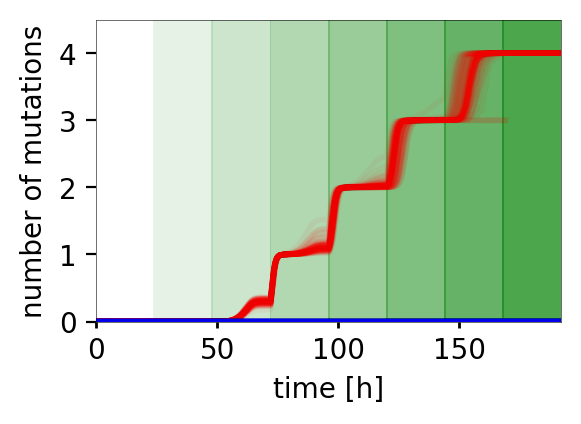

In [250]:
N=100
name1='00LongMutBioOnlyGenetics'
name2='00LongMutBioOnlyGenEPSPhysio'
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

gens=generate_genotypes(k)
sum_mut=np.sum(gens,1)
mut_weights=sum_mut
for i in range (8):
        plt.axvline(x=12+i*24, color='green', linestyle='-', linewidth=21.5, alpha=0.1*i)

for i in range (N):
    loadname=name1+str(i)
    this_time=np.loadtxt(loadname+'_time.txt')
    this_time=this_time/60
    pop=np.loadtxt(loadname+'_bio_pop.txt')
    weighted_pops=pop*mut_weights
    mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
    a=np.sum(weighted_pops,1)
    b=np.sum(pop,1)
    mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)

    plt.plot(this_time, mean_mut,'red', linewidth=2, alpha=0.05)
    plt.xlim(0,8*24)
    plt.ylim(0,4.5)

for i in range (N):
    loadname=name2+str(i)
    this_time=np.loadtxt(loadname+'_time.txt')
    this_time=this_time/60
    pop=np.loadtxt(loadname+'_bio_pop.txt')
    weighted_pops=pop*mut_weights
    mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
    a=np.sum(weighted_pops,1)
    b=np.sum(pop,1)
    mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)

    plt.plot(this_time, mean_mut,'blue', linewidth=2, alpha=0.05)
    plt.xlim(0,8*24)
    plt.ylim(0,4.5)

plt.xlabel('time [h]', fontsize=10)
plt.ylabel('number of mutations', fontsize=10)
plt.savefig('00MutNumBio.png', dpi=200,bbox_inches='tight')
plt.show()


<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


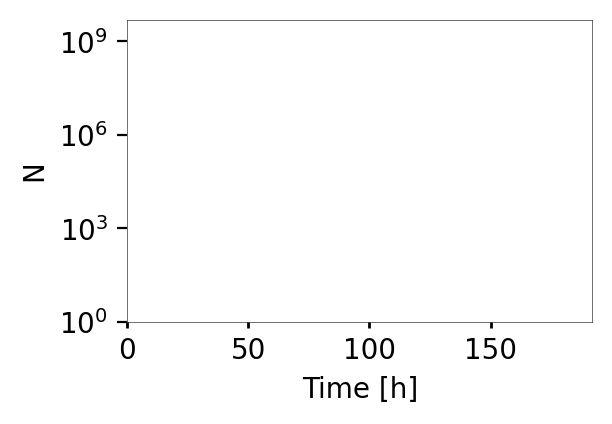

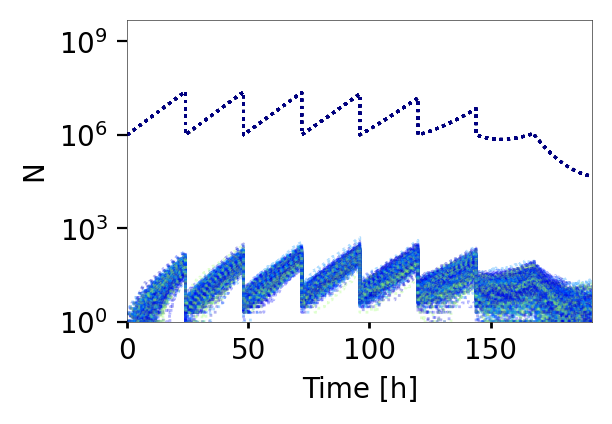

In [60]:
N=100
name='00LongMutBioOnlyGenEPSPhysio'
plot_all_dynamics(name=name, N=N)

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

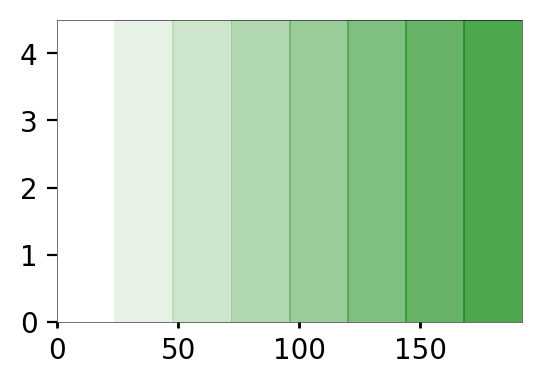

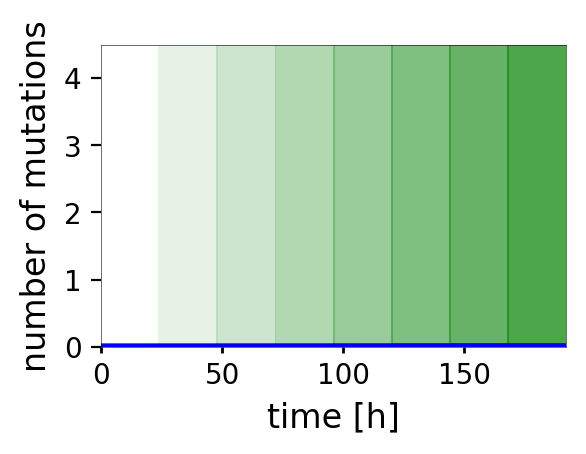

done


In [70]:
N=100
name='00LongMutBioOnlyGenEPSPhysio'
mean_mut=get_mean_mut_num(name=name, N=100, color='b', k=4)

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


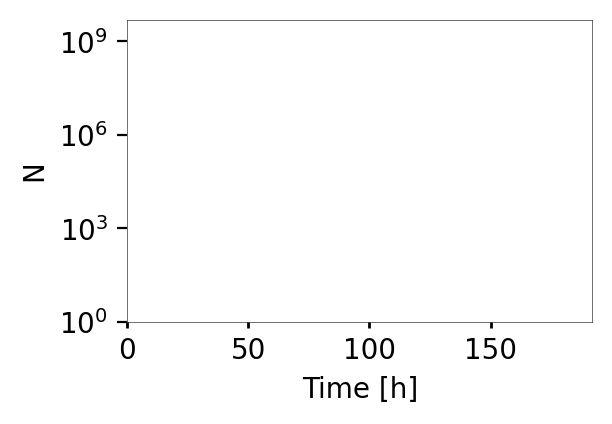

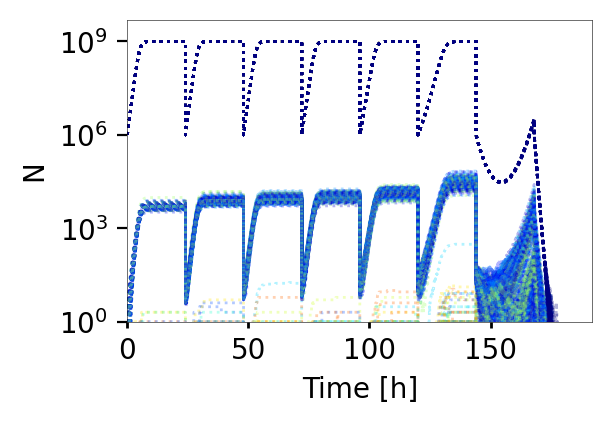

In [61]:
N=100
name='00LongMutBioOnlyEPS'
plot_all_dynamics(name=name, N=N)

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

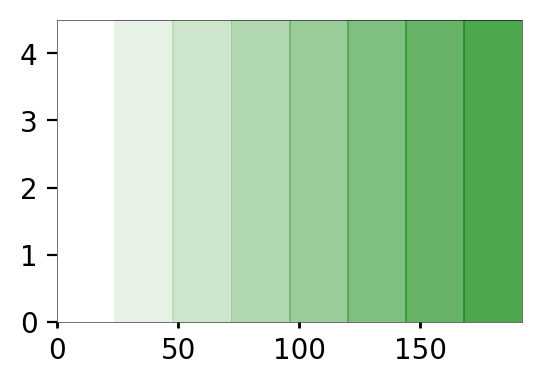

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

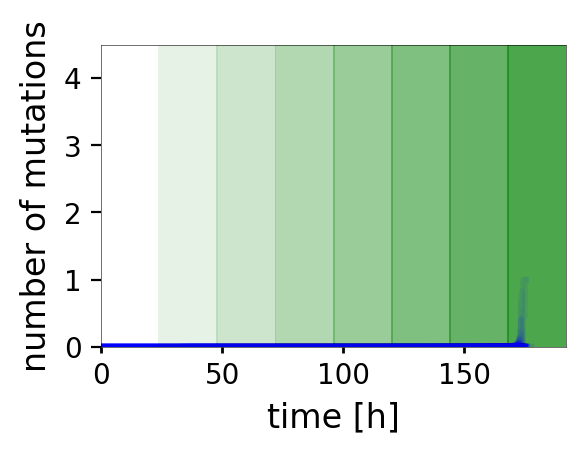

done


In [71]:
N=100
name='00LongMutBioOnlyEPS'
mean_mut=get_mean_mut_num(name=name, N=100, color='b', k=4)

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

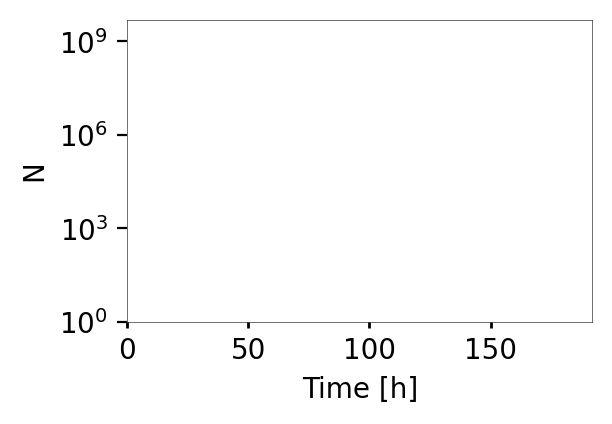

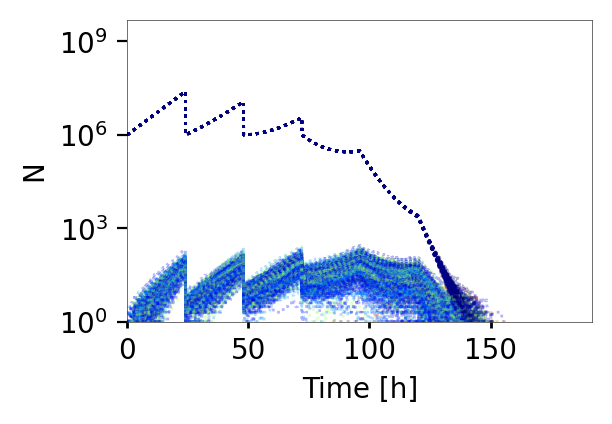

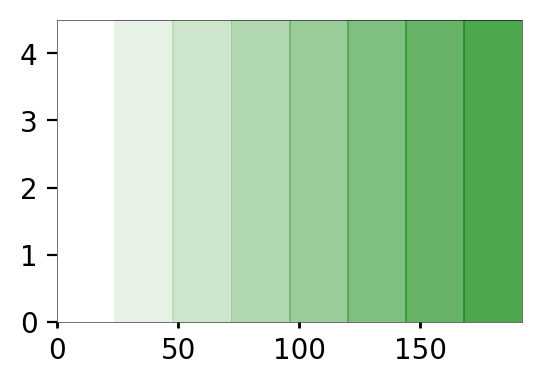

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

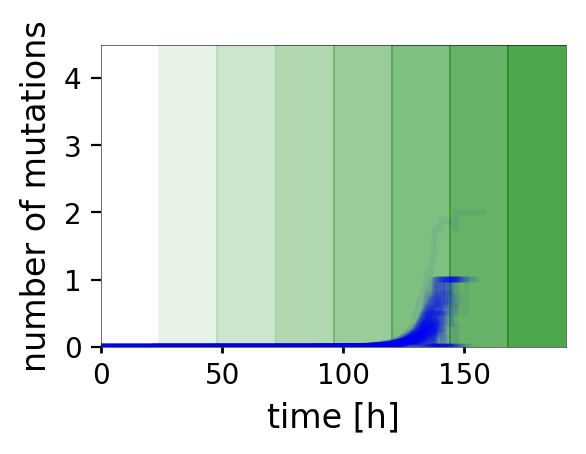

done


In [72]:
N=100
name='00LongMutBioOnlyPhysio'
plot_all_dynamics(name=name, N=N)
mean_mut=get_mean_mut_num(name=name, N=100, color='b', k=4)

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

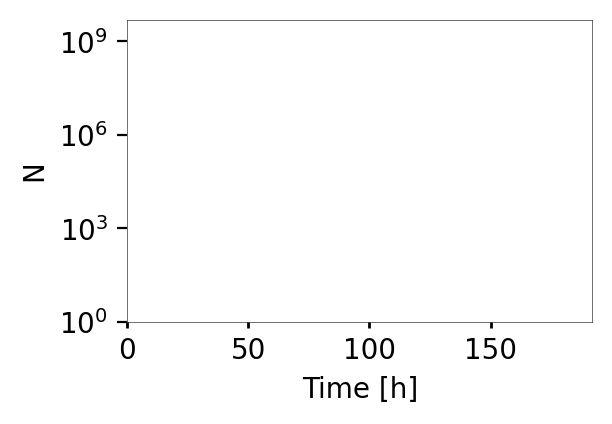

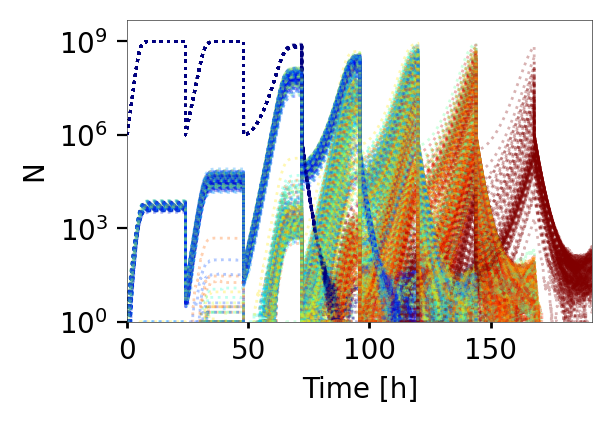

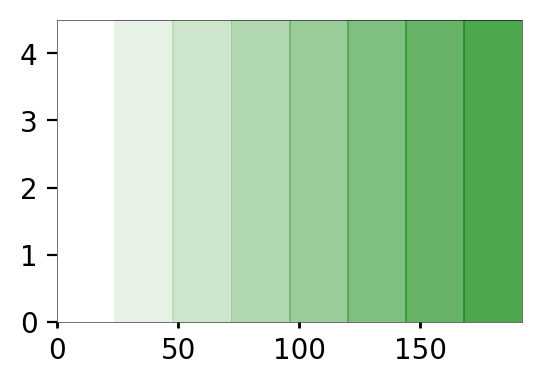

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

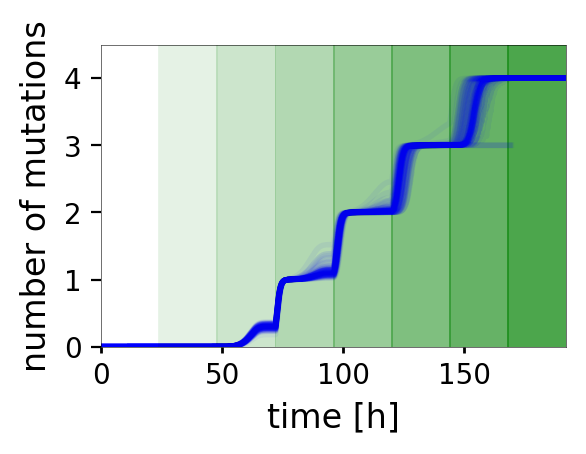

done


In [74]:
N=100
name='00LongMutBioOnlyGenetics'
plot_all_dynamics(name=name, N=N)
mean_mut=get_mean_mut_num(name=name, N=100, color='b', k=4)

# Facilitating evolution

Repeated experiment for this one. 

In [9]:
def get_mutant_timing(name='', pop_name='_bio_pop', N=1, k=1):
    #fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
    #ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

    mut_timing=[]
    extinction_timing=[]
    last_extinction_timing=[]
   
    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        pop=np.loadtxt(loadname+pop_name+'.txt')
        
        #plt.semilogy(this_time, pop)
        [tp,strains]=(np.shape(pop))

        this_mut_timing=np.zeros([strains])
        this_extinction_timing=np.zeros([strains])
        for j in range(strains):
            non_zero=(np.nonzero(pop[:,j]))
            non_zero=non_zero[0]
            times=this_time[non_zero]
            #print ('in j', j, 'min', min(non_zero, default=T), 'max', max(non_zero, default=0))
            this_mut_timing[j]=min(times, default=np.nan)
            this_extinction_timing[j]=max(times, default=np.nan)
        mut_timing.append(this_mut_timing)
        extinction_timing.append(this_extinction_timing)
        
        max_extinction=np.nanmax(this_extinction_timing)
        last_extinction_timing.append(max_extinction)
        #print ('in sims i=',i,'laxt went extinct at ', max_extinction)
        
    mut_timing=np.array(mut_timing)
    extinction_timing=np.array(extinction_timing)
    
    strain_appearence=(np.count_nonzero(~np.isnan(mut_timing),0))
    strain_extinction=(np.count_nonzero(~np.isnan(extinction_timing),0))

    
        

    #print ('strain timing mutation', (mut_timing)) 
    #print ('strain timing extinction', (extinction_timing)) 
    #print ('strain_appearence in..',  strain_appearence)
    #print ('strain_extinction in..', strain_extinction)
  
    #print ('strain mean timing mutation', np.nanmean(mut_timing,0)) 
    #print ('strain mean timing extinction', np.nanmean(extinction_timing,0)) 
    
    
    return (last_extinction_timing)
    
    


<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

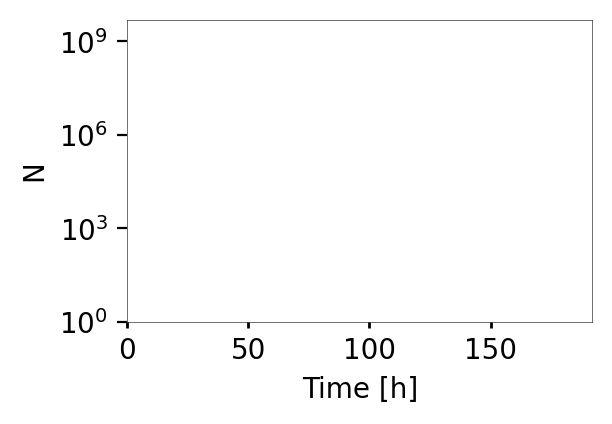

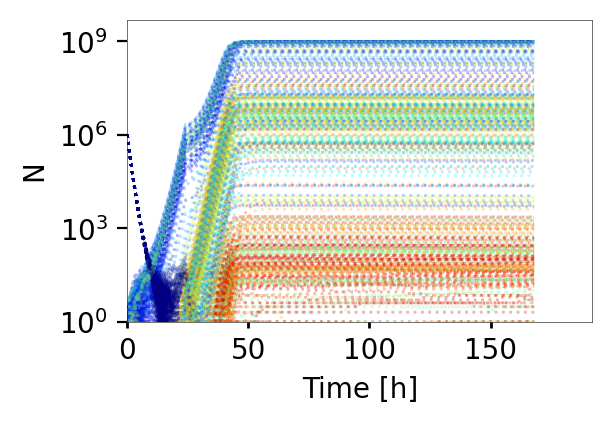

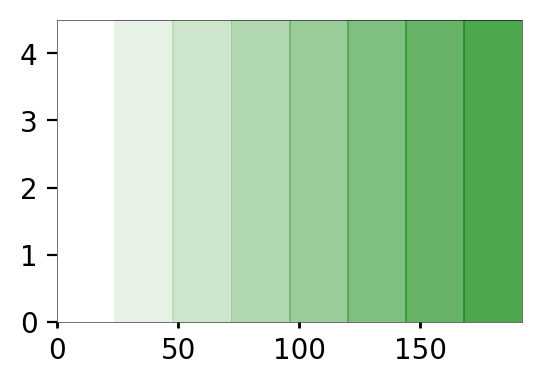

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

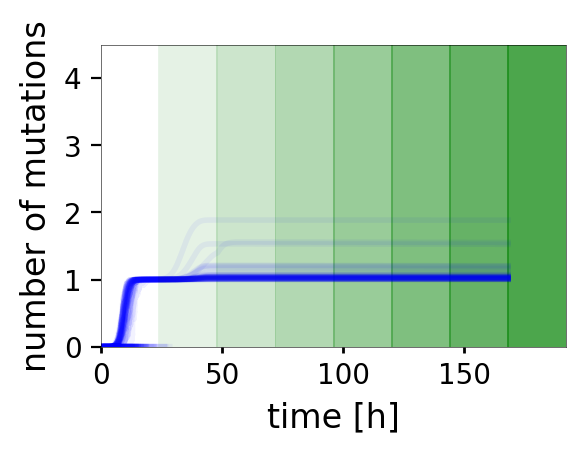

done


<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

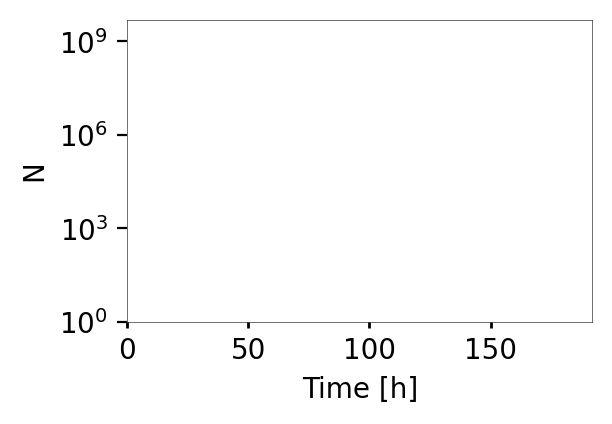

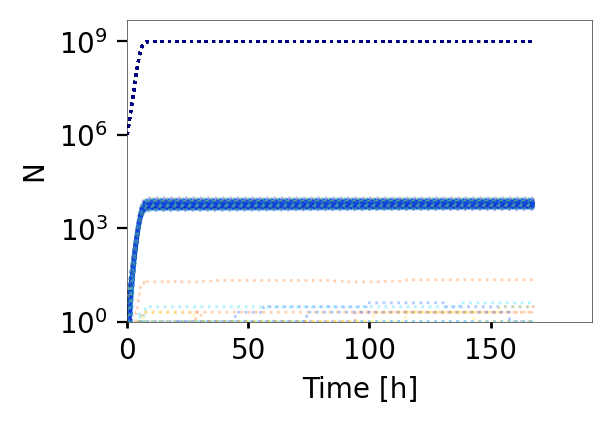

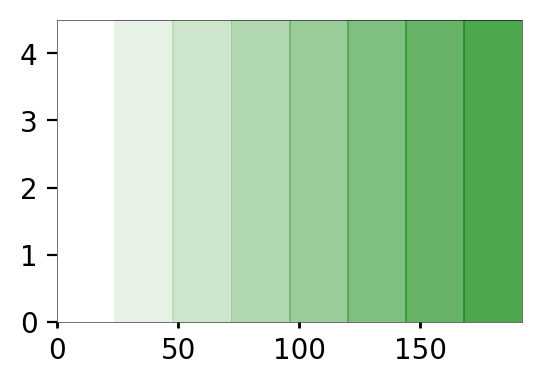

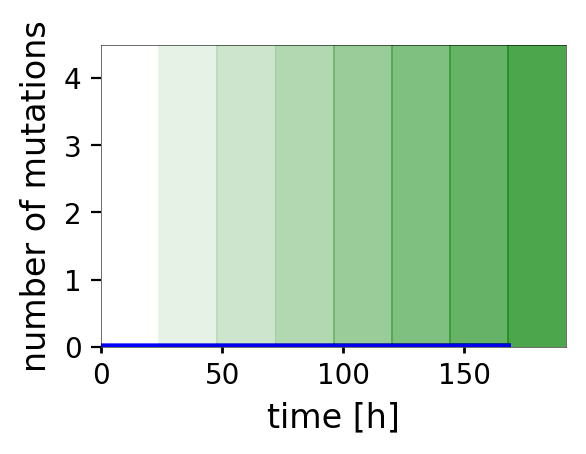

done


<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

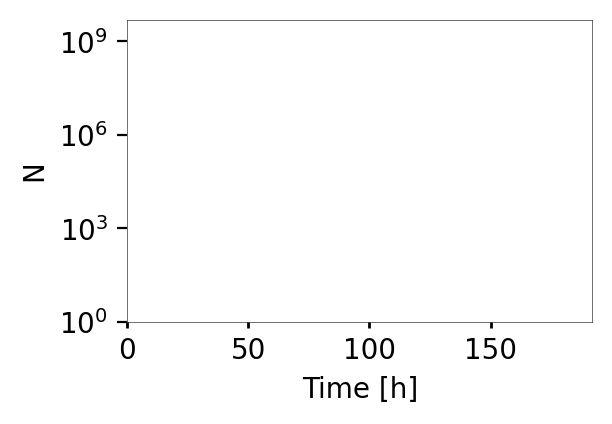

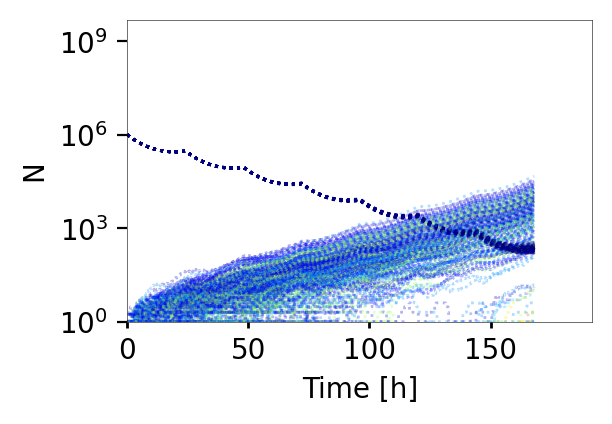

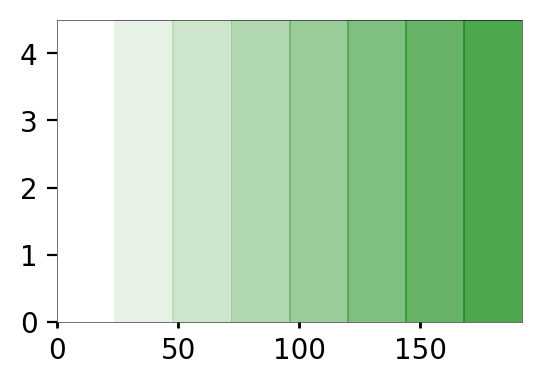

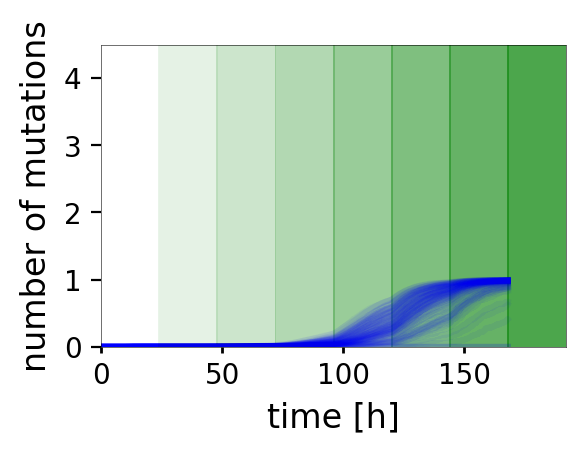

done


<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

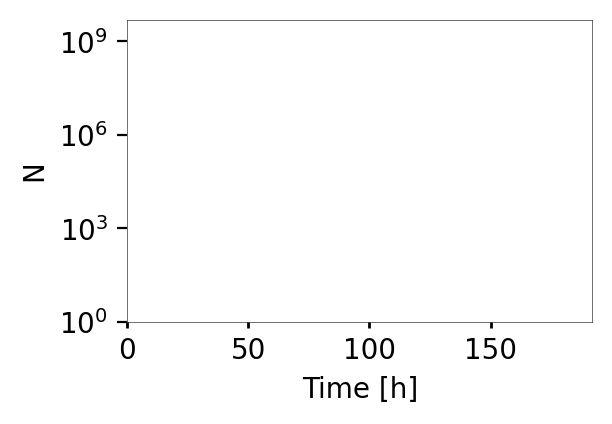

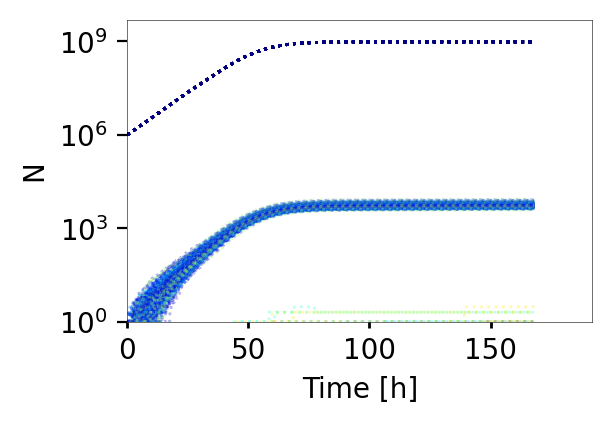

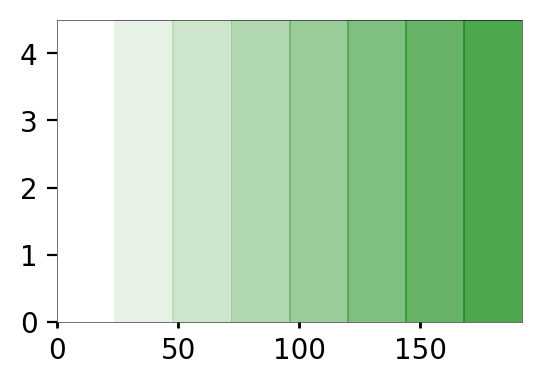

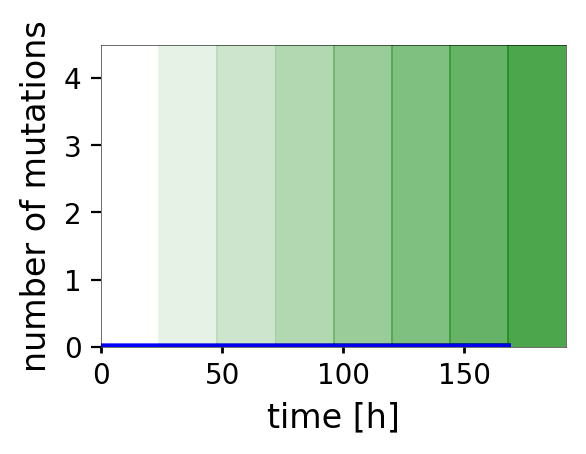

done


In [92]:
N=100
name='00repeated_t_C2_GenOnly'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time1C2=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C2_GenEPS'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time2C2=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C2_GenPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time3C2=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C2_GenEPSPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time4C2=get_mutant_timing(name=name, N=N, k=4)



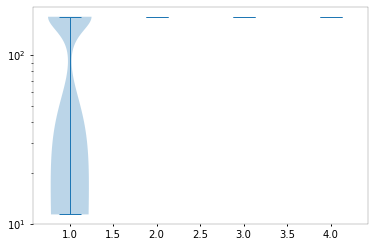

(array([17., 14.,  8.,  4.,  3.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 53.]),
 array([ 11.4  ,  14.532,  17.664,  20.796,  23.928,  27.06 ,  30.192,
         33.324,  36.456,  39.588,  42.72 ,  45.852,  48.984,  52.116,
         55.248,  58.38 ,  61.512,  64.644,  67.776,  70.908,  74.04 ,
         77.172,  80.304,  83.436,  86.568,  89.7  ,  92.832,  95.964,
         99.096, 102.228, 105.36 , 108.492, 111.624, 114.756, 117.888,
        121.02 , 124.152, 127.284, 130.416, 133.548, 136.68 , 139.812,
        142.944, 146.076, 149.208, 152.34 , 155.472, 158.604, 161.736,
        164.868, 168.   ]),
 <a list of 50 Patch objects>)

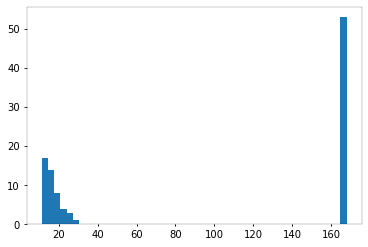

In [89]:
plt.violinplot([extinction_time1C2,extinction_time2C2,extinction_time3C2,extinction_time4C2])
plt.yscale('log')
#plt.ylim(0.000001, 1)
plt.show()
plt.hist([extinction_time1C2], 50)

<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a)

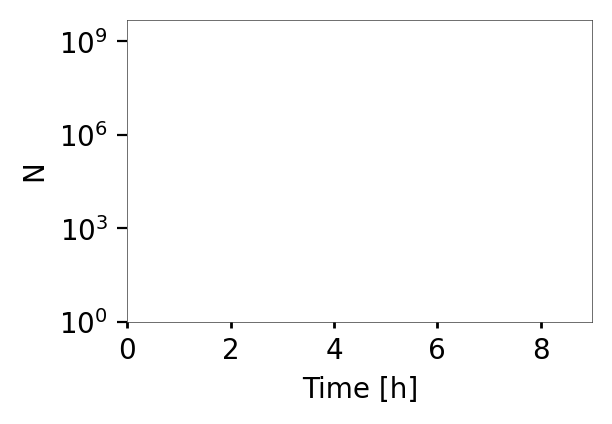

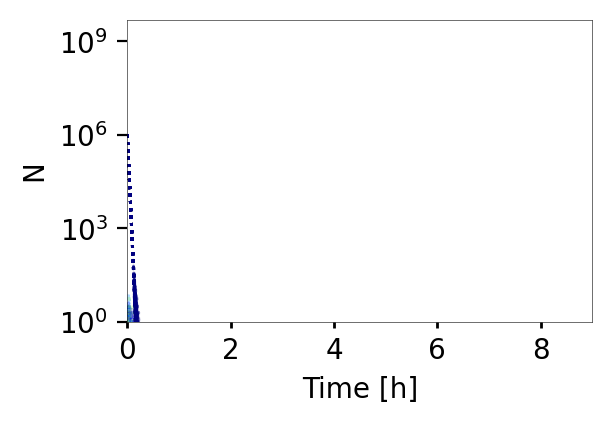

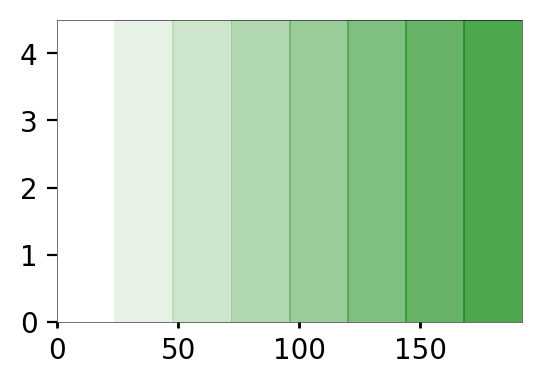

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

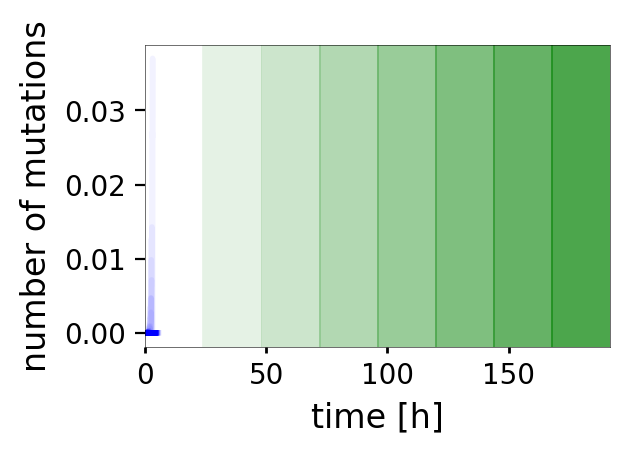

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

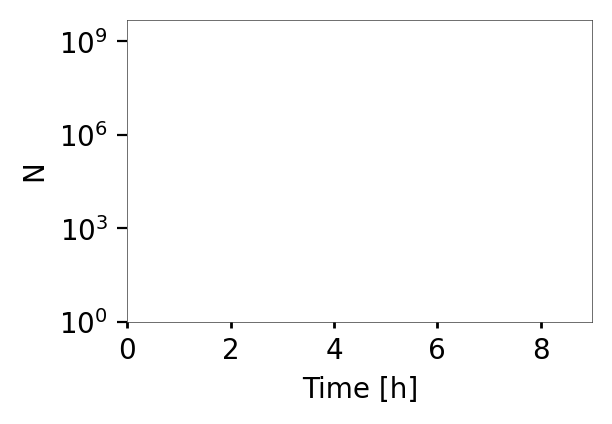

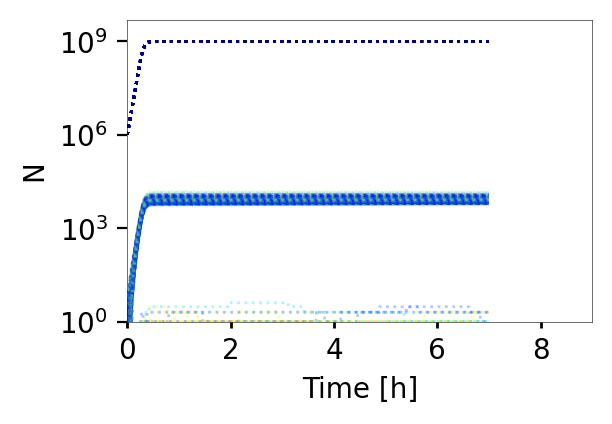

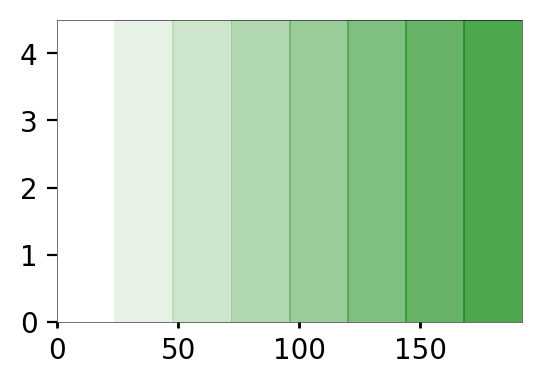

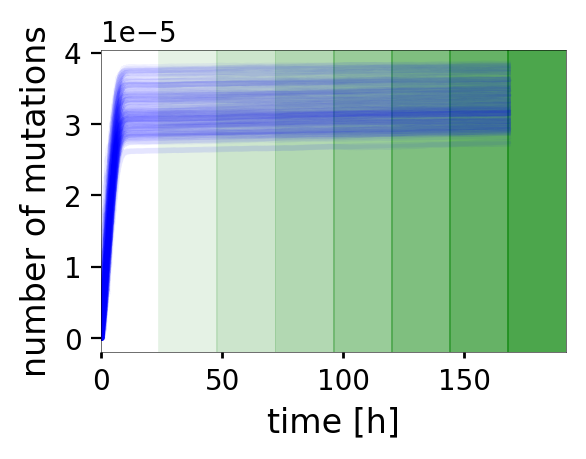

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

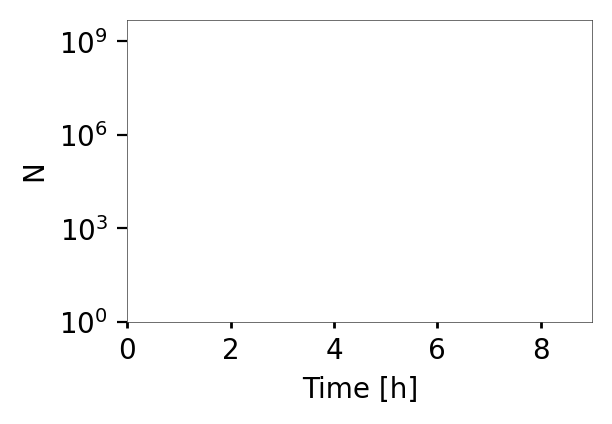

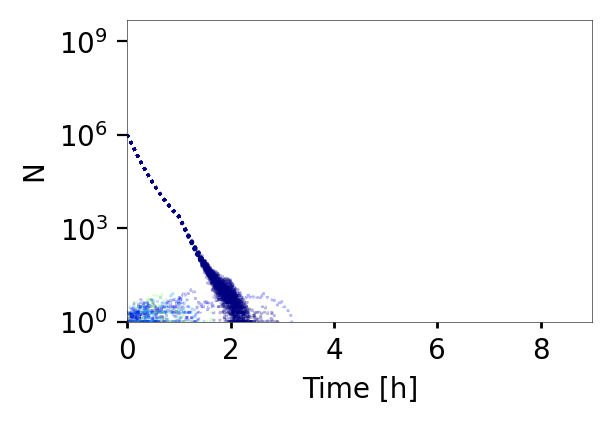

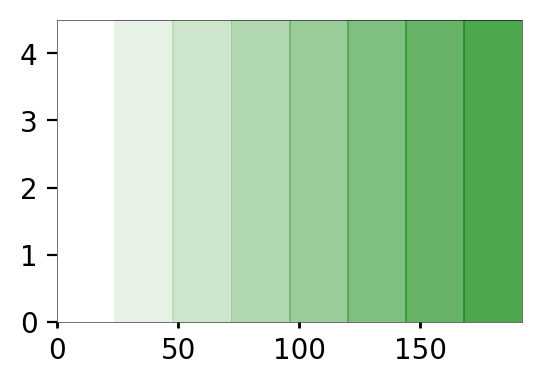

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

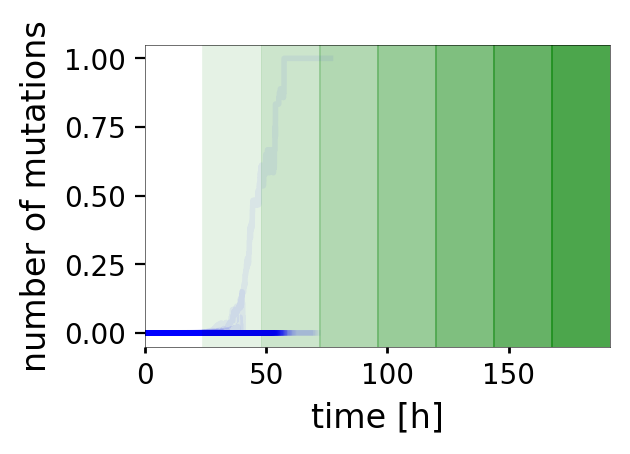

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

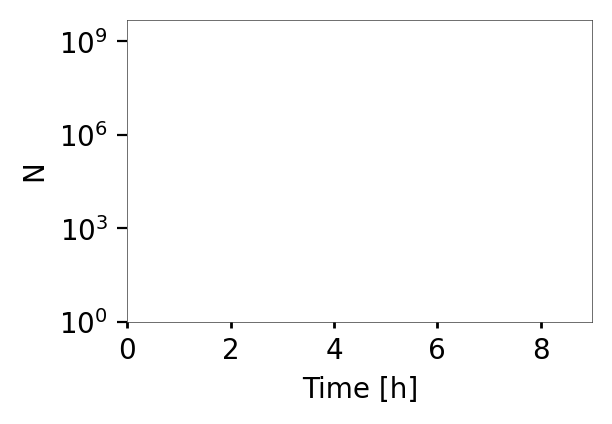

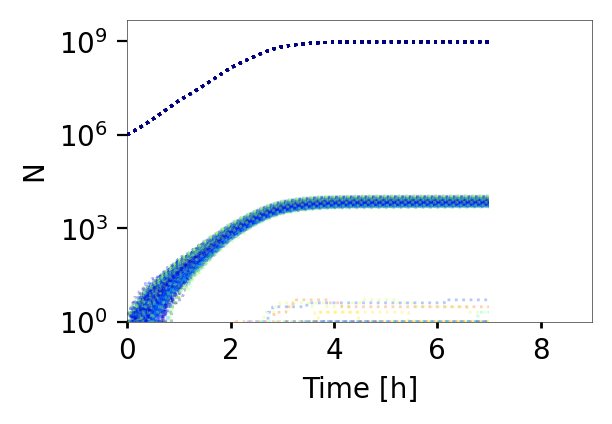

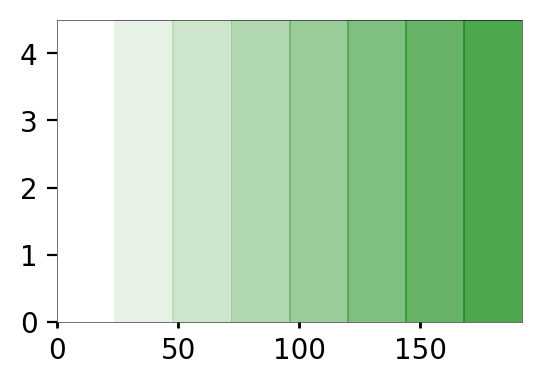

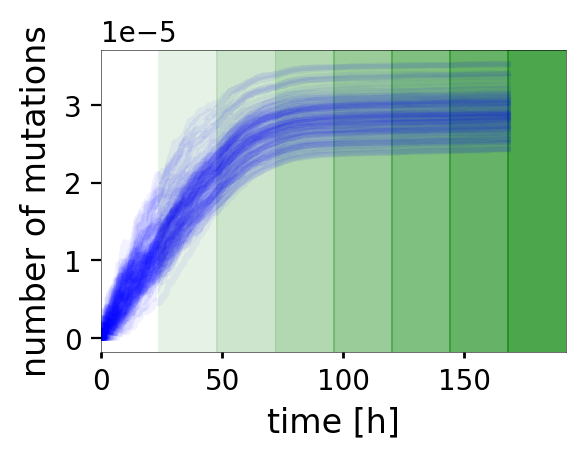

done


In [15]:
N=100
name='00repeated_t_C5_GenOnly'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time1C5=get_mutant_timing(name=name, N=N, k=4)

name='repeated_t_C5_GenEPS10'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time2C5=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C5_GenPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time3C5=get_mutant_timing(name=name, N=N, k=4)

name='repeated_t_C5_GenEPS10Physio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time4C5=get_mutant_timing(name=name, N=N, k=4)


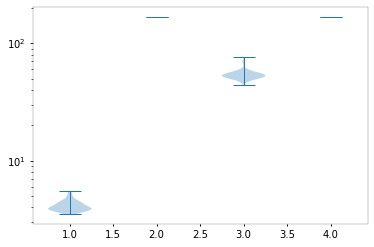

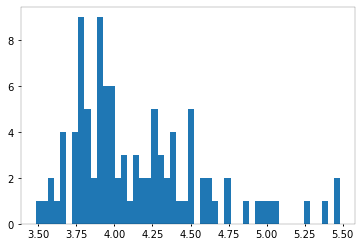

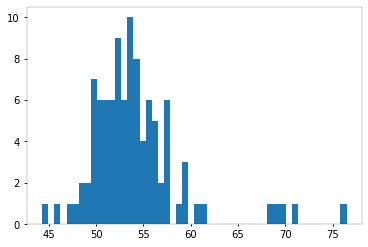

In [16]:
plt.violinplot([extinction_time1C5,extinction_time2C5,extinction_time3C5,extinction_time4C5])
plt.yscale('log')
#plt.ylim(0.000001, 1)
plt.show()
plt.hist([extinction_time1C5], 50)
plt.show()
plt.hist([extinction_time3C5], 50)
plt.show()


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

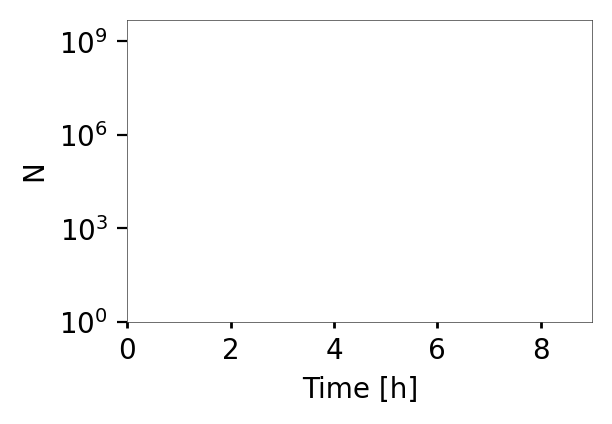

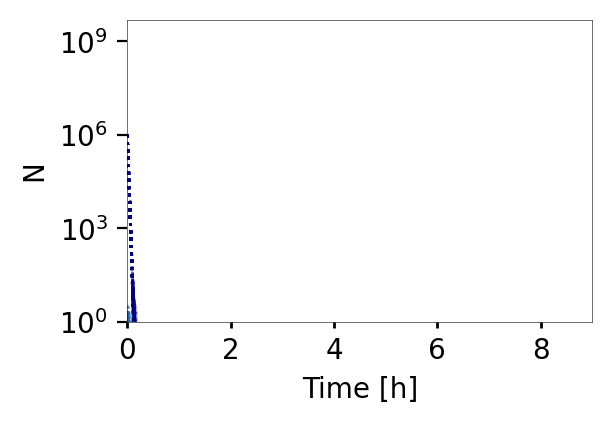

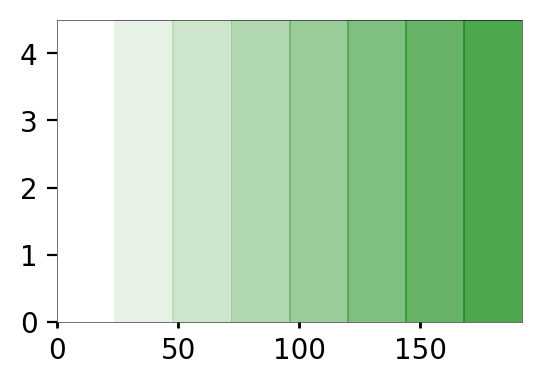

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

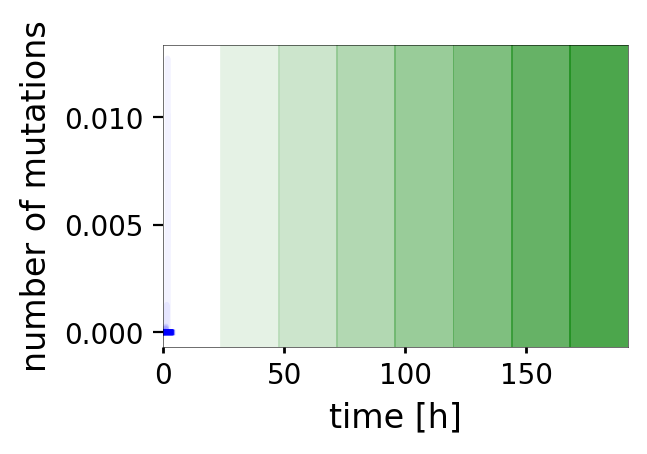

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

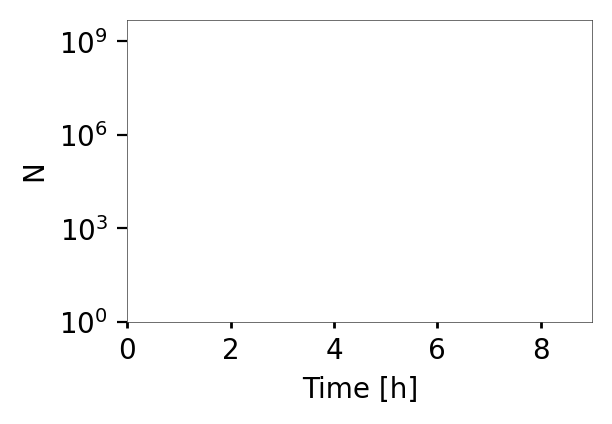

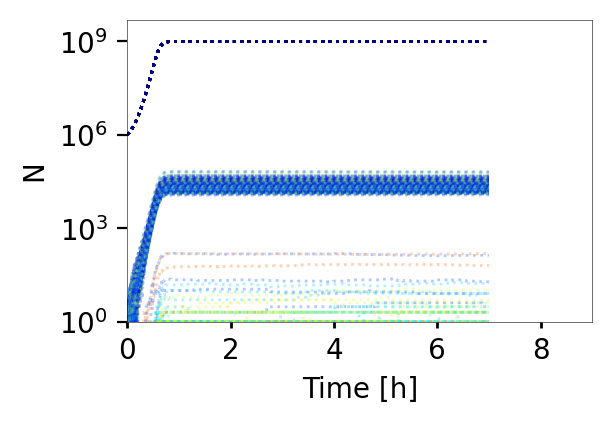

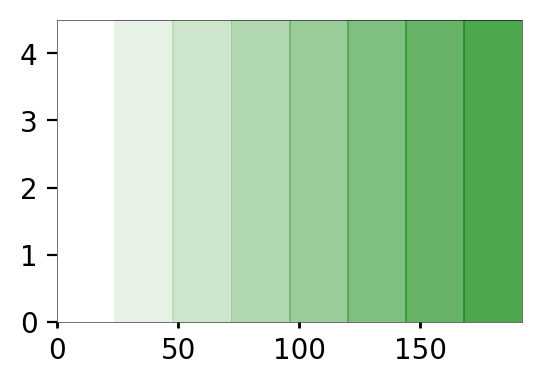

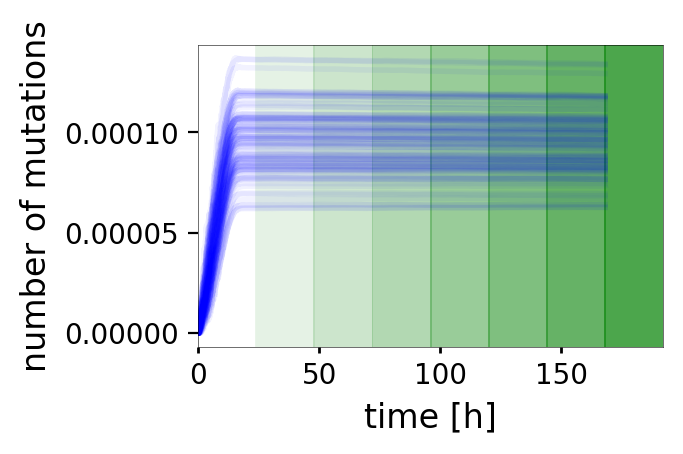

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


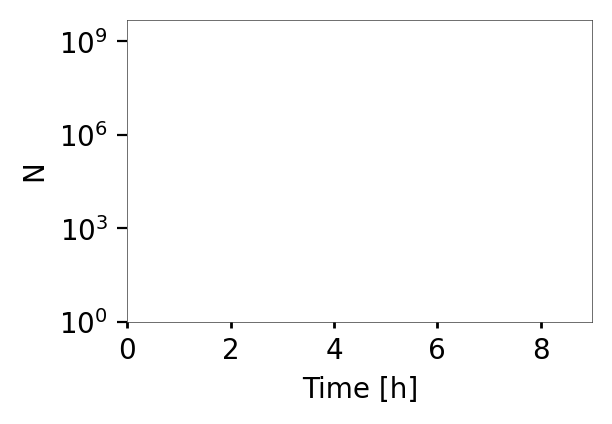

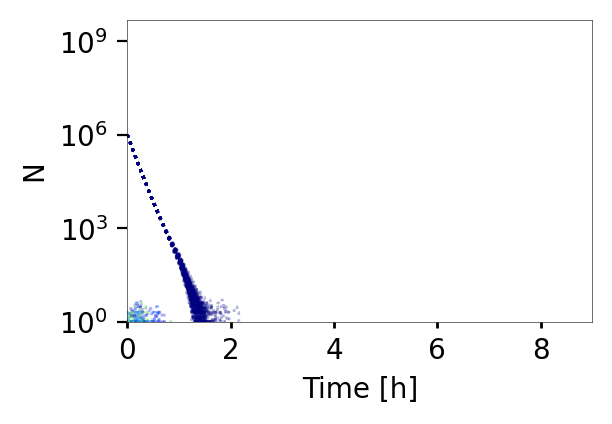

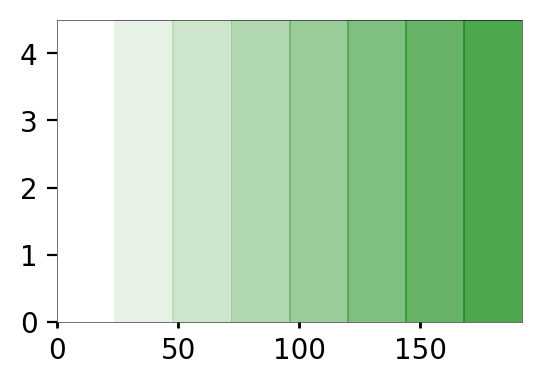

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

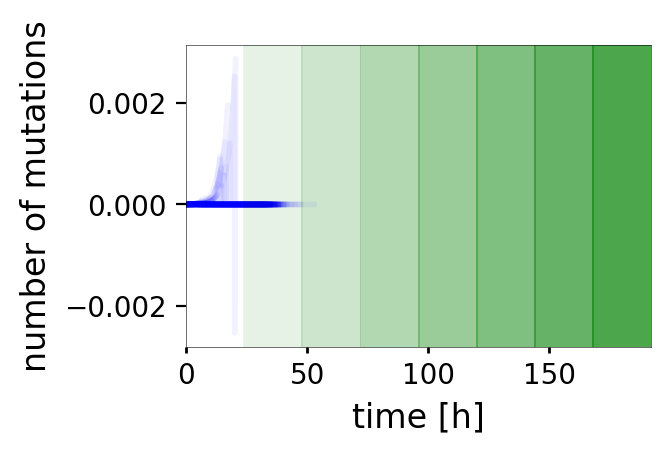

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

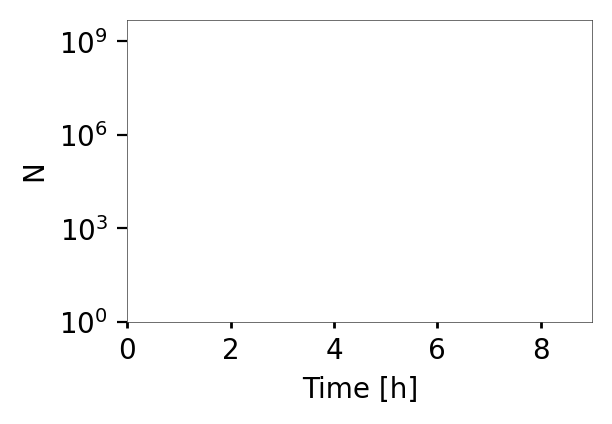

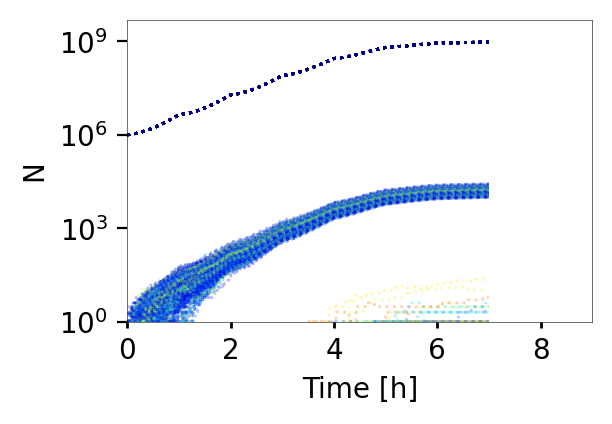

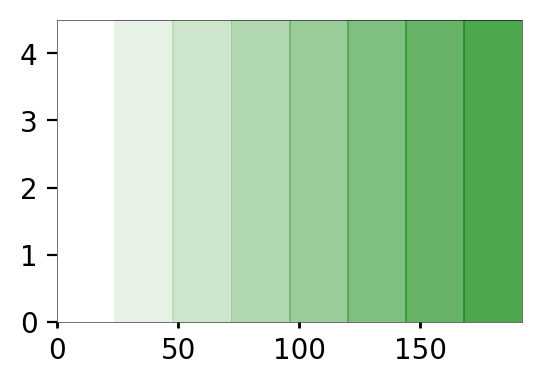

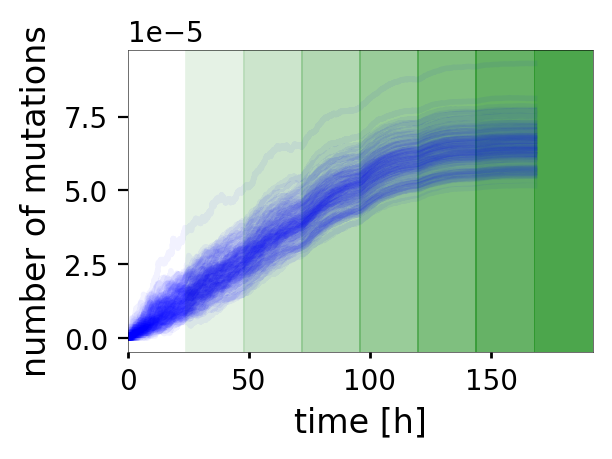

done


In [17]:
N=100
name='repeated_treatment_C10_GenOnly'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time1C10=get_mutant_timing(name=name, N=N, k=4)

name='repeated_treatment_C10_GenEPS10'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time2C10=get_mutant_timing(name=name, N=N, k=4)

name='repeated_treatment_C10_GenPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time3C10=get_mutant_timing(name=name, N=N, k=4)

name='repeated_treatment_C10_GenEPS10Physio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time4C10=get_mutant_timing(name=name, N=N, k=4)

<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a)

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

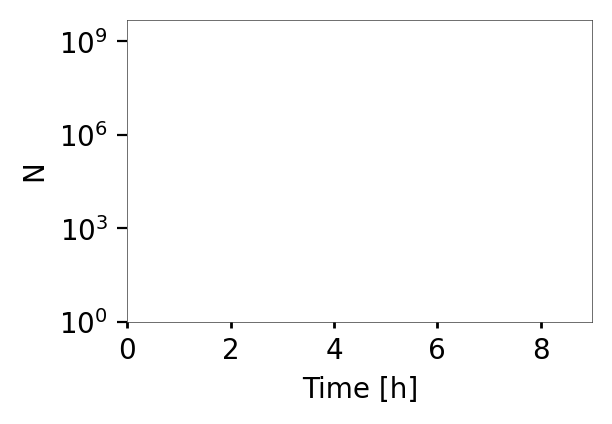

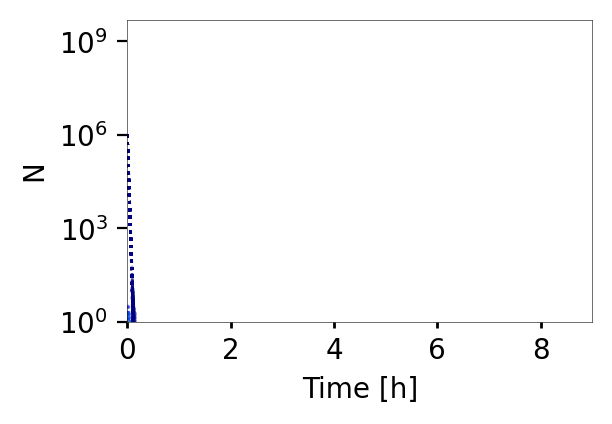

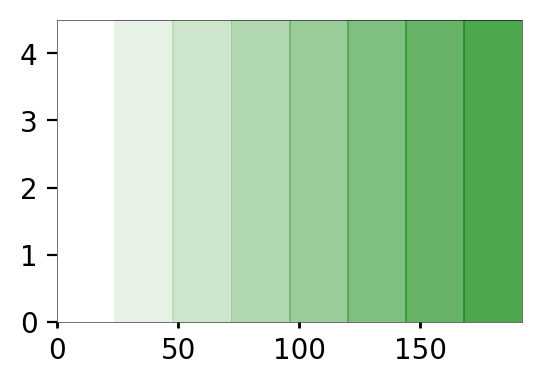

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

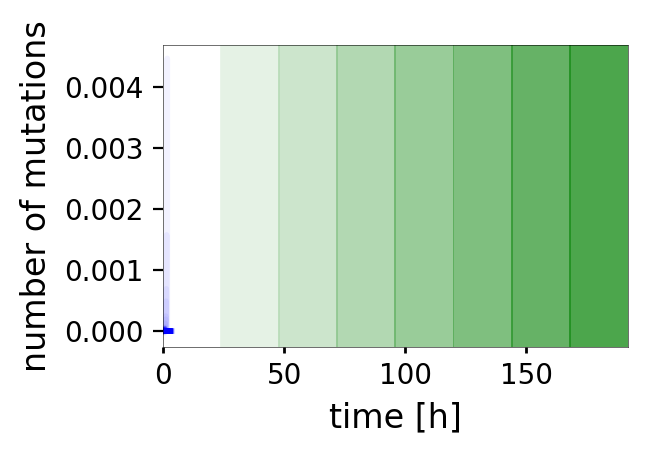

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

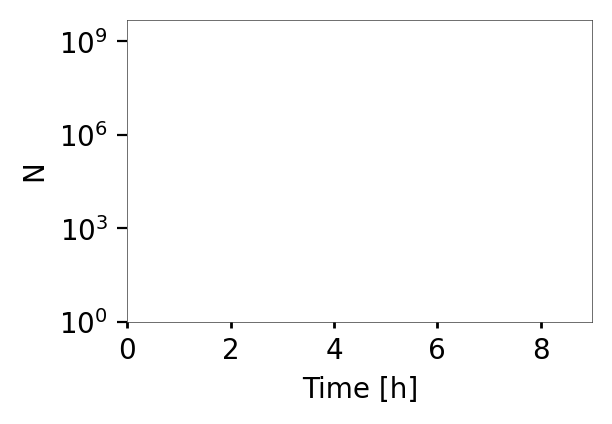

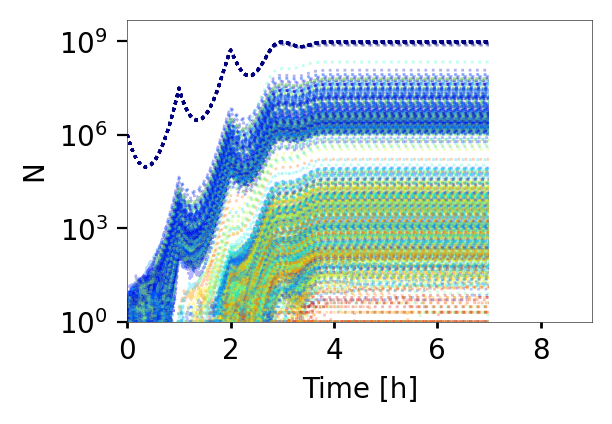

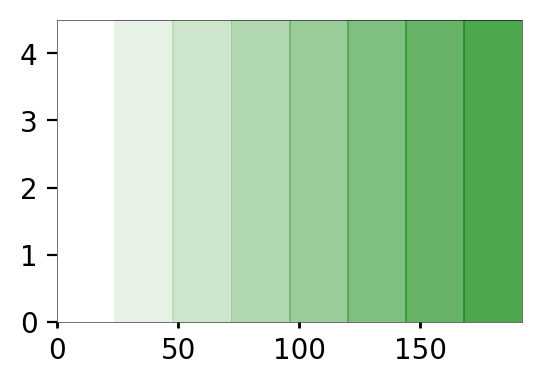

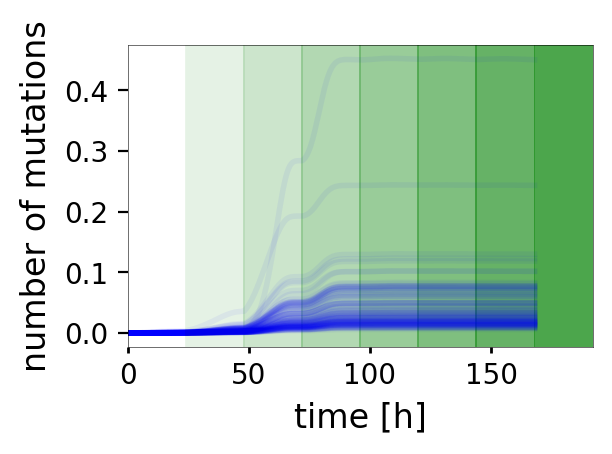

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

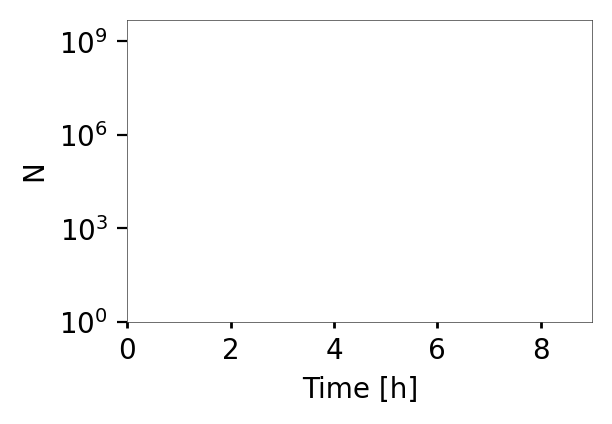

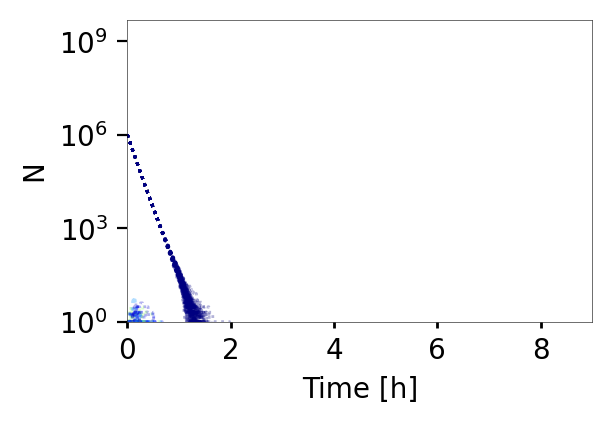

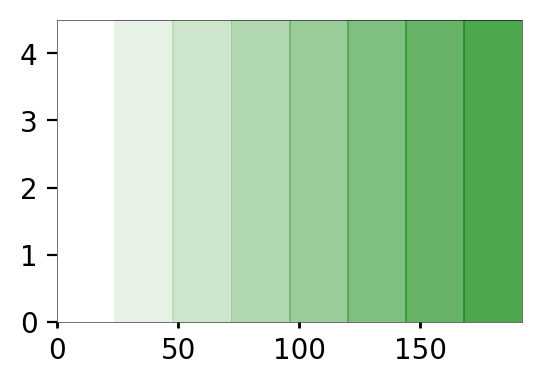

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

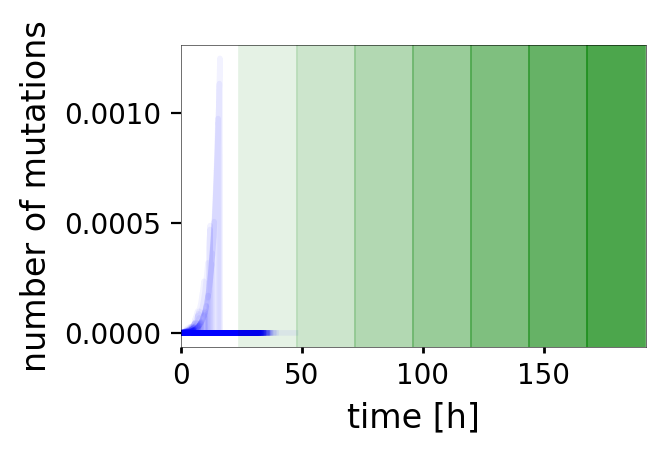

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

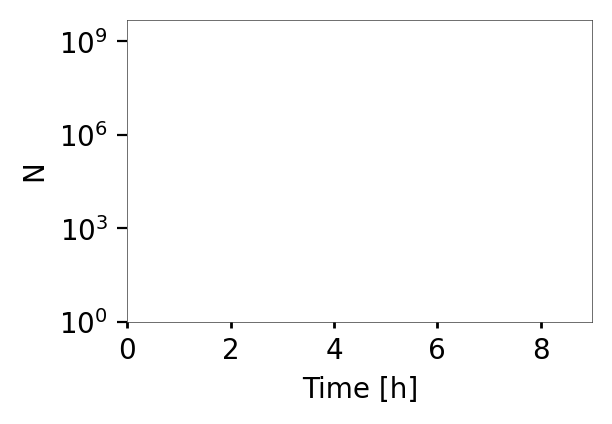

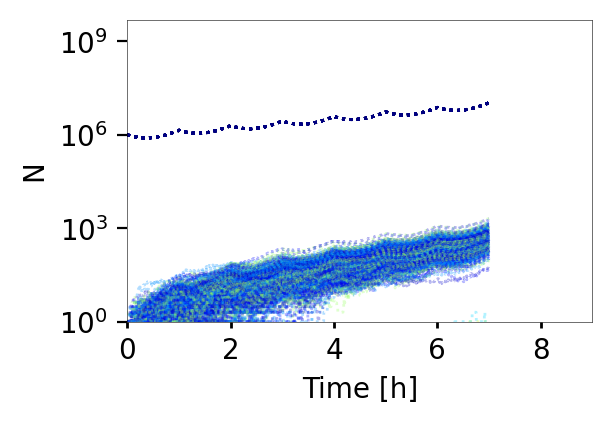

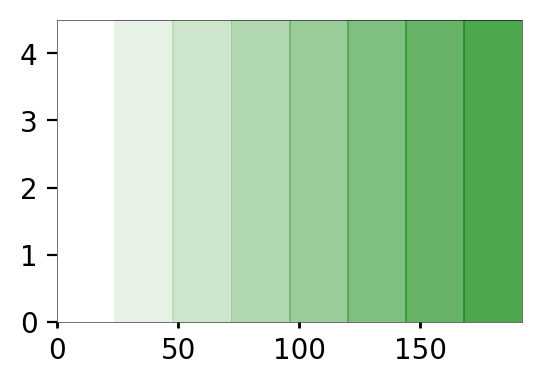

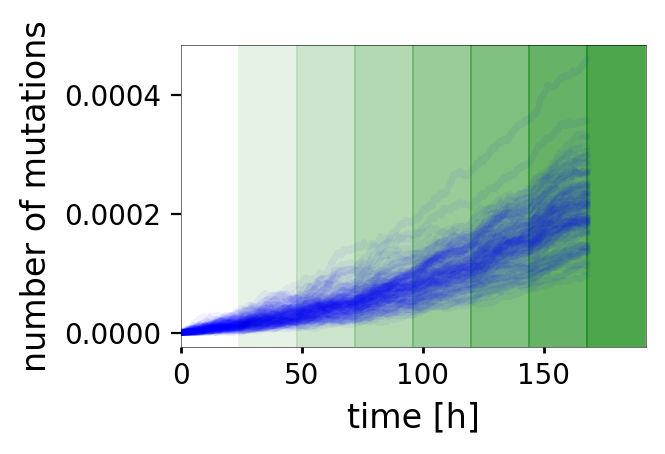

done


In [18]:
N=100
name='00repeated_t_C15_GenOnly'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time1C15=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C15_GenEPS10'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time2C15=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C15_GenPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time3C15=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C15_GenEPS10Physio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time4C15=get_mutant_timing(name=name, N=N, k=4)

<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a)

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

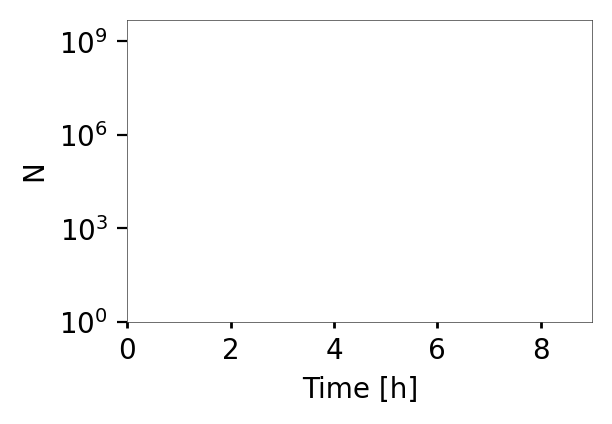

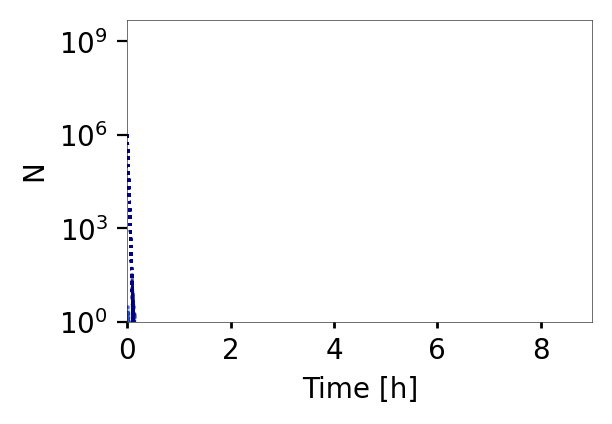

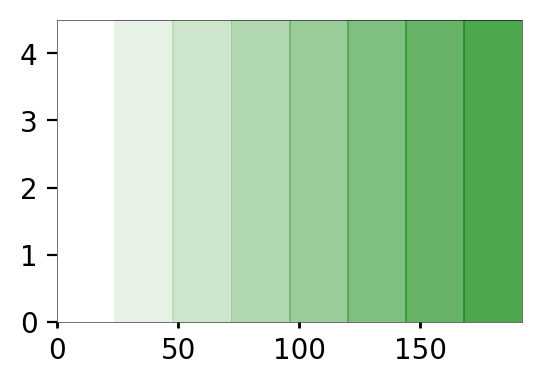

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

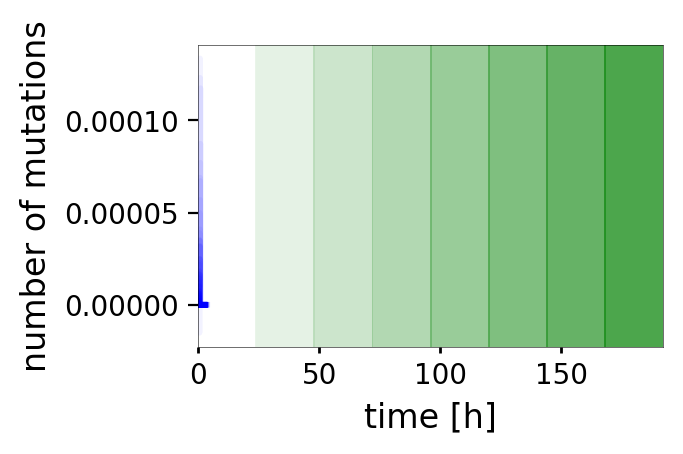

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

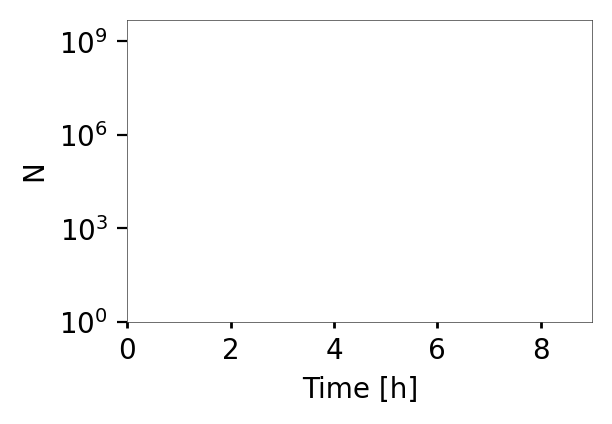

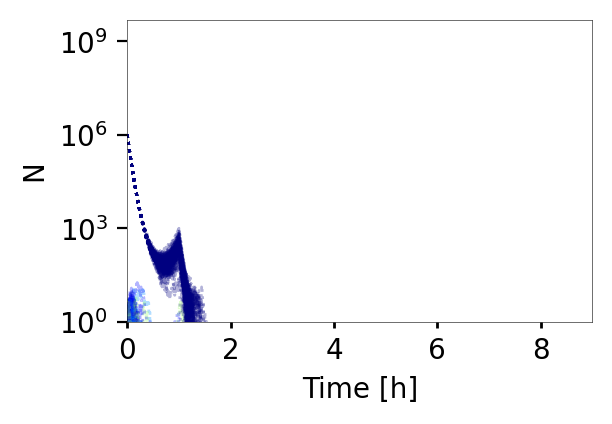

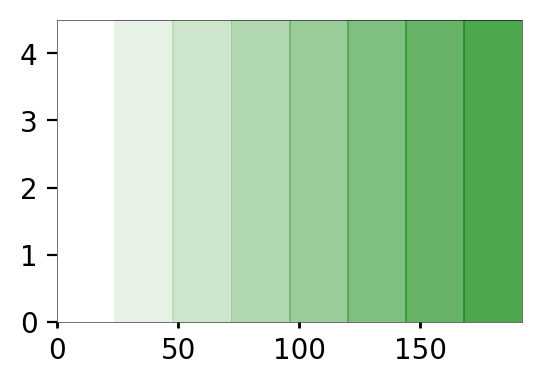

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


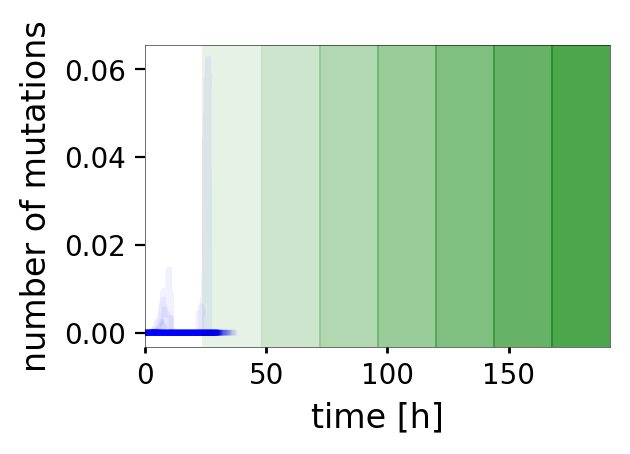

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWa

all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

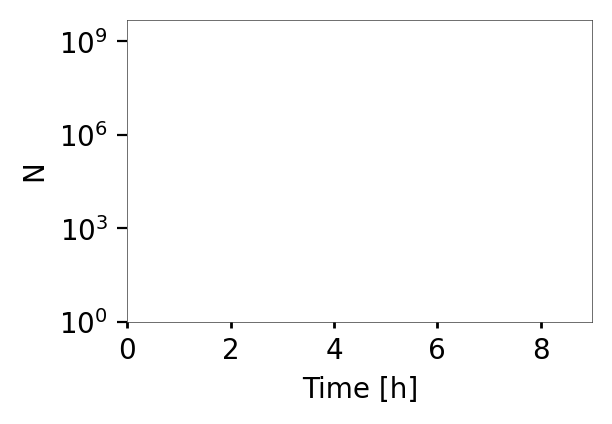

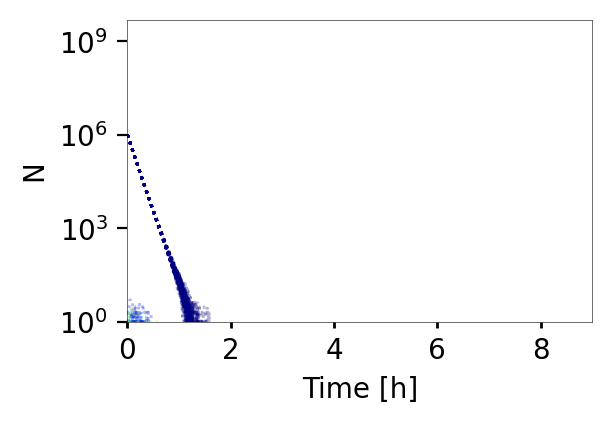

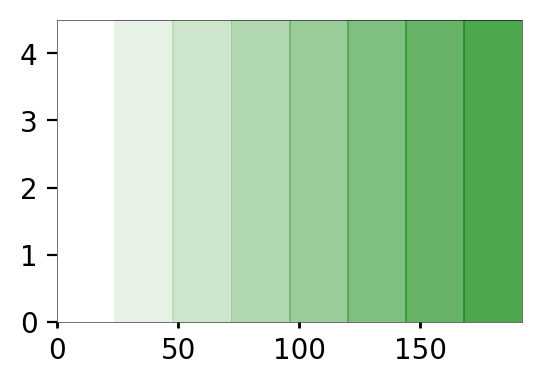

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


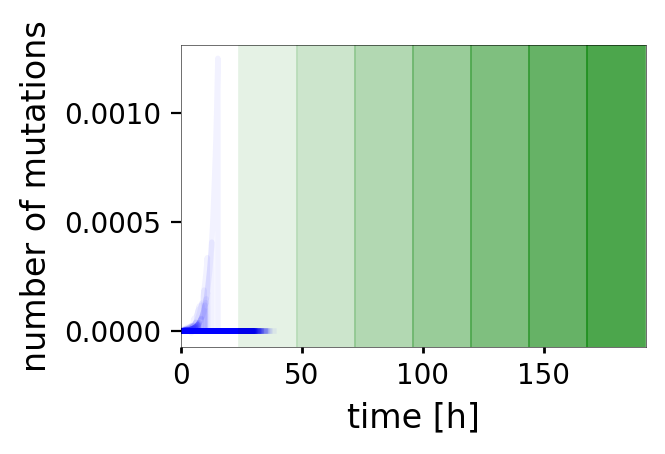

done


<ipython-input-12-da1f7e0a3560>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-12-da1f7e0a3560>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-8-c6ac9cc8f6d8>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-8-c6ac9cc8f6d8>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.su

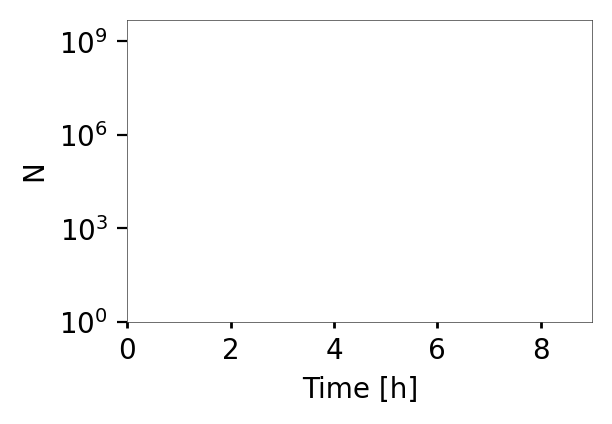

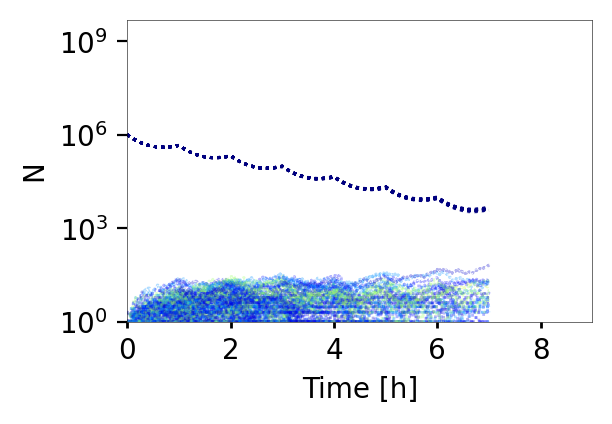

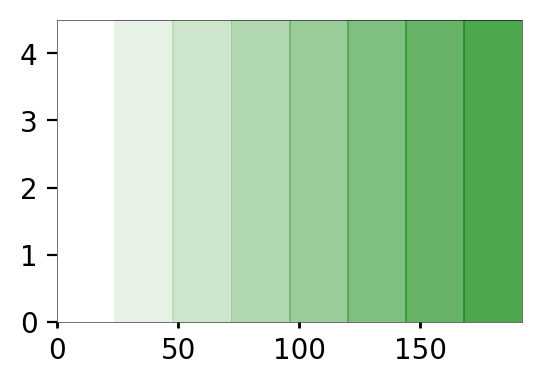

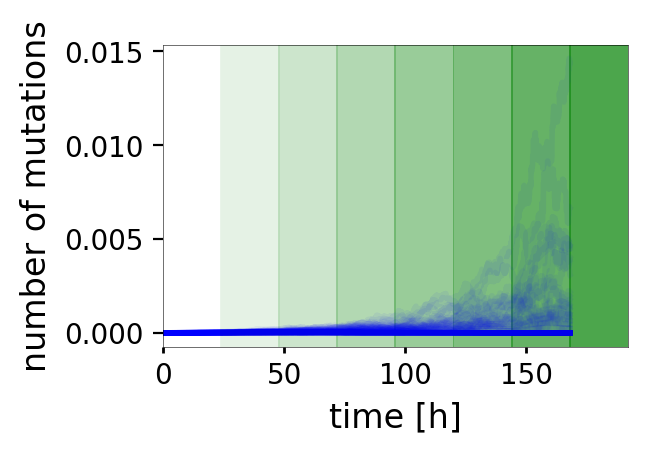

done


In [13]:
N=100
name='00repeated_t_C20_GenOnly'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time1C20=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C20_GenEPS10'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time2C20=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C20_GenPhysio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time3C20=get_mutant_timing(name=name, N=N, k=4)

name='00repeated_t_C20_GenEPS10Physio'
plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
extinction_time4C20=get_mutant_timing(name=name, N=N, k=4)

In [10]:
def set_axis_style(ax, labels):
    ax.get_xaxis().set_tick_params(direction='out')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_xticks(np.arange(1, len(labels) + 1))
    ax.set_xticklabels(labels)
    ax.set_xlim(0.25, len(labels) + 0.75)
    ax.set_xlabel('Concentration')

Text(0, 0.5, 'Extinction time')

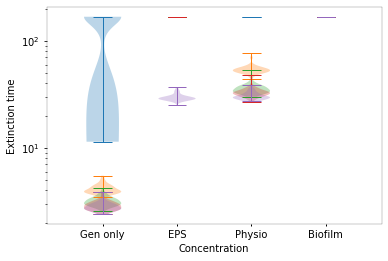

In [141]:
labels = ['Gen only', 'EPS', 'Physio', 'Biofilm']
fig1, ax1 = plt.subplots()
plt.violinplot([extinction_time1C2, extinction_time2C2, extinction_time3C2, extinction_time4C2])
plt.violinplot([extinction_time1C5, extinction_time2C5, extinction_time3C5, extinction_time4C5])
plt.violinplot([extinction_time1C10, extinction_time2C10, extinction_time3C10, extinction_time4C10])
plt.violinplot([extinction_time1C15, extinction_time2C15, extinction_time3C15, extinction_time4C15])
plt.violinplot([extinction_time1C20, extinction_time2C20, extinction_time3C20, extinction_time4C20])
plt.yscale('log')

set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.savefig('00extinction_Gen_all.png', dpi=200,bbox_inches='tight' )

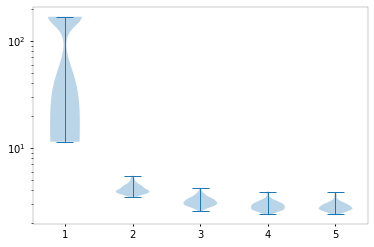

In [110]:
plt.violinplot([extinction_time1C2, extinction_time1C5, extinction_time1C10, extinction_time1C15, extinction_time1C20])
plt.yscale('log')

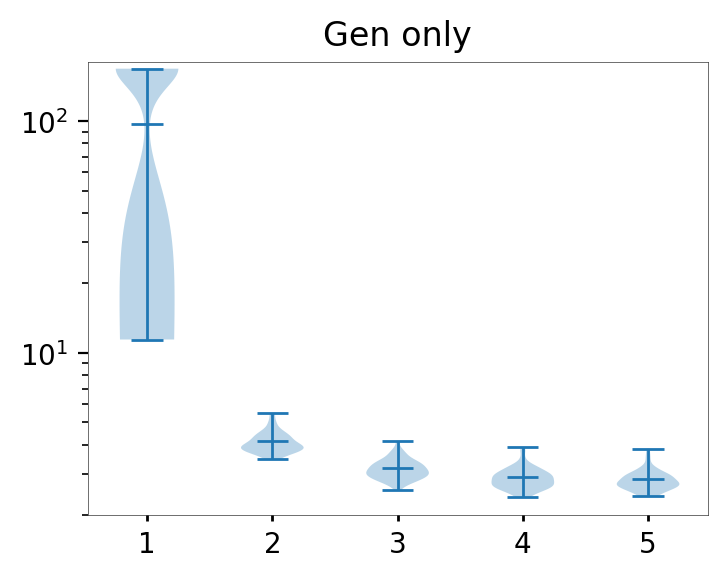

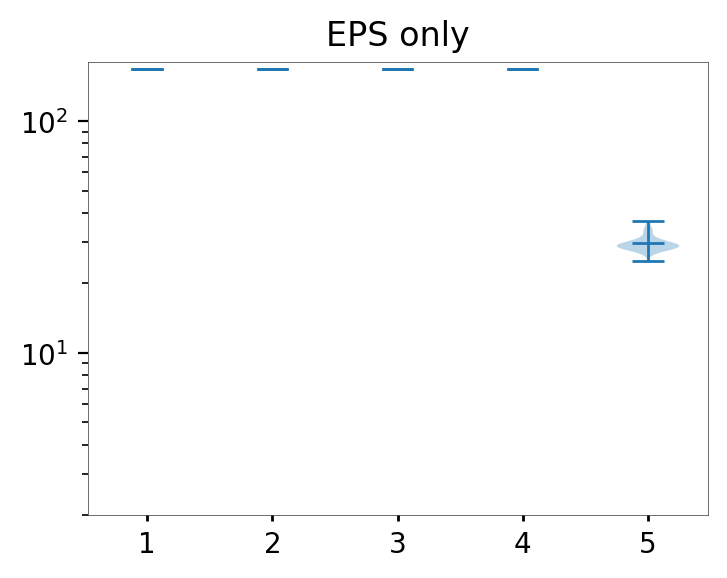

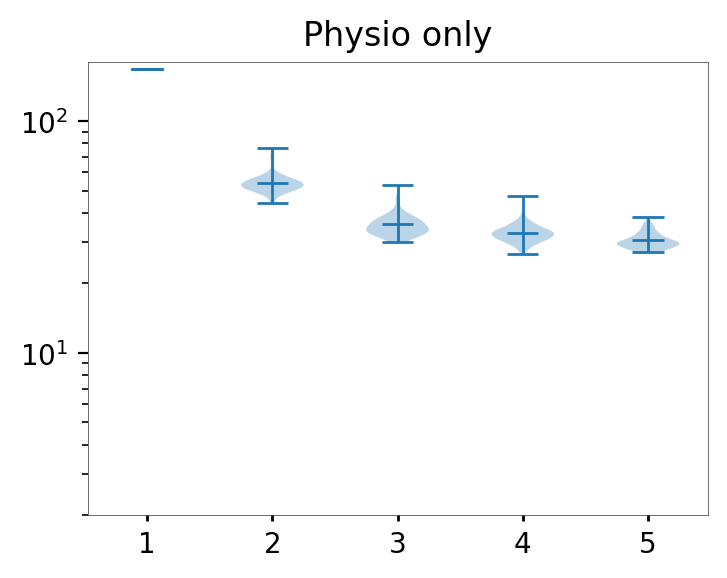

Text(0, 0.5, 'Extinction time')

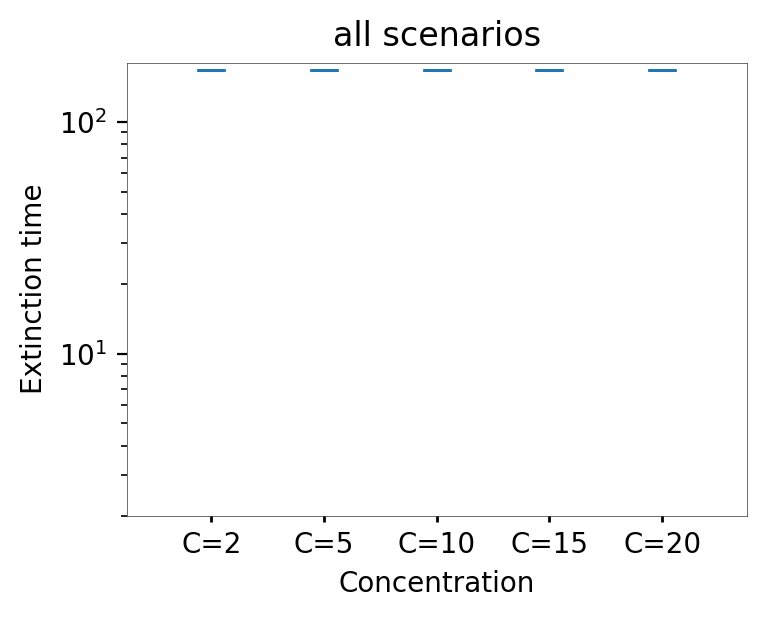

In [433]:
labels = [ '5', '10', '15', '20']
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))

plt.violinplot([extinction_time1C2, extinction_time1C5, extinction_time1C10, extinction_time1C15, extinction_time1C20], showmeans=True)
plt.yscale('log')
plt.ylim(2, 180)
plt.title('Gen only')

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([extinction_time2C2, extinction_time2C5, extinction_time2C10, extinction_time2C15, extinction_time2C20], showmeans=True)
plt.yscale('log')
plt.ylim(2, 180)
plt.title('EPS only')

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([extinction_time3C2, extinction_time3C5, extinction_time3C10, extinction_time3C15, extinction_time3C20], showmeans=True)
plt.yscale('log')
plt.ylim(2, 180)
plt.title('Physio only')

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([extinction_time4C2, extinction_time4C5, extinction_time4C10, extinction_time4C15, extinction_time4C20], showmeans=True)
plt.title('EPS + physio only')
plt.ylim(2, 180)
plt.yscale('log')
plt.title('all scenarios')

set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.savefig('00extinction_all.png', dpi=200,bbox_inches='tight' )

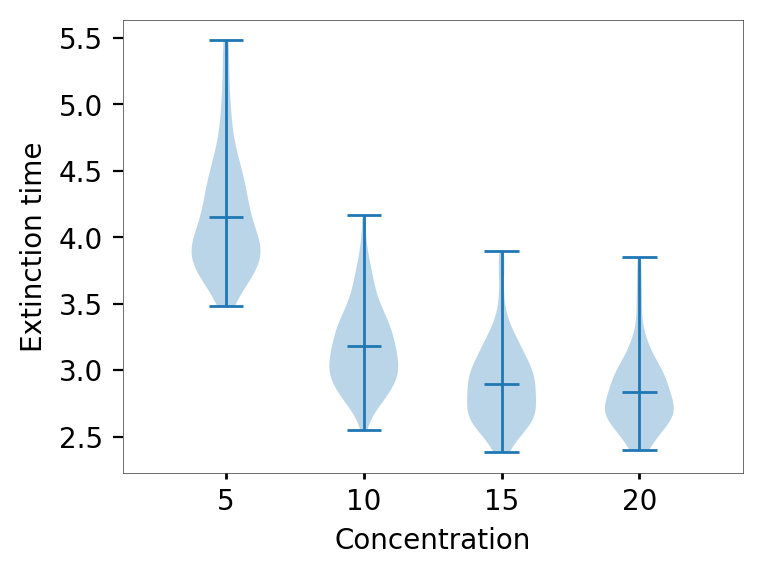

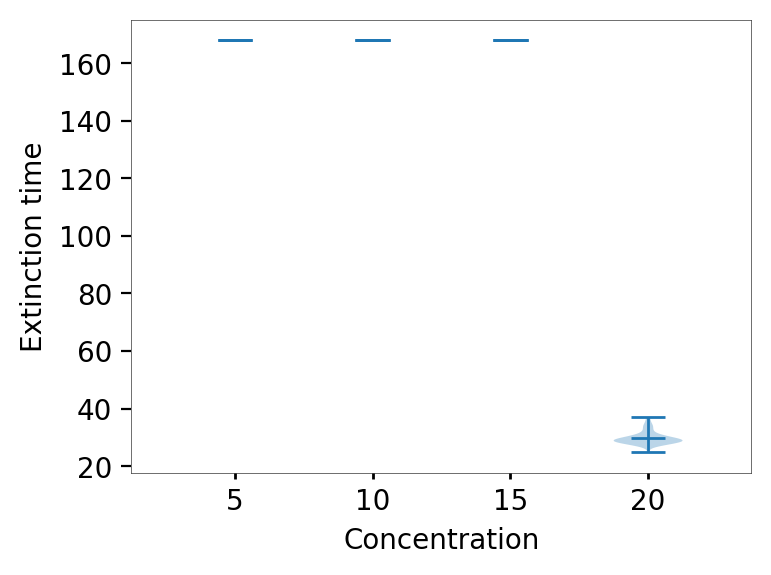

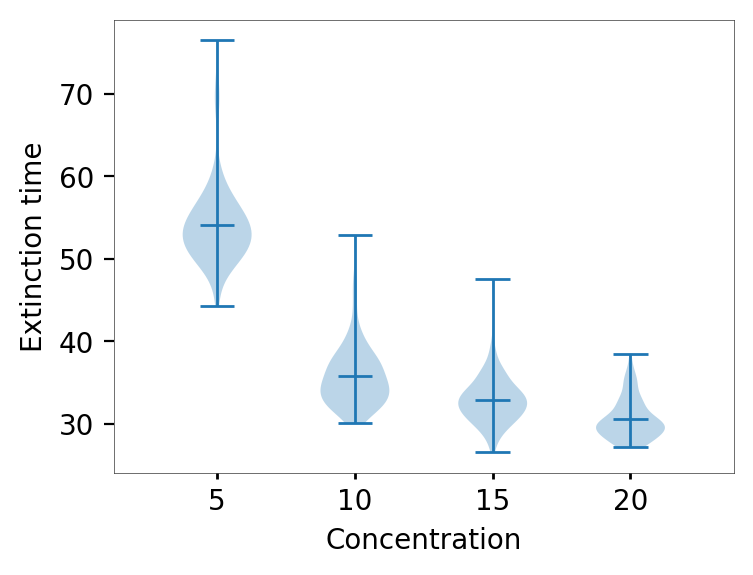

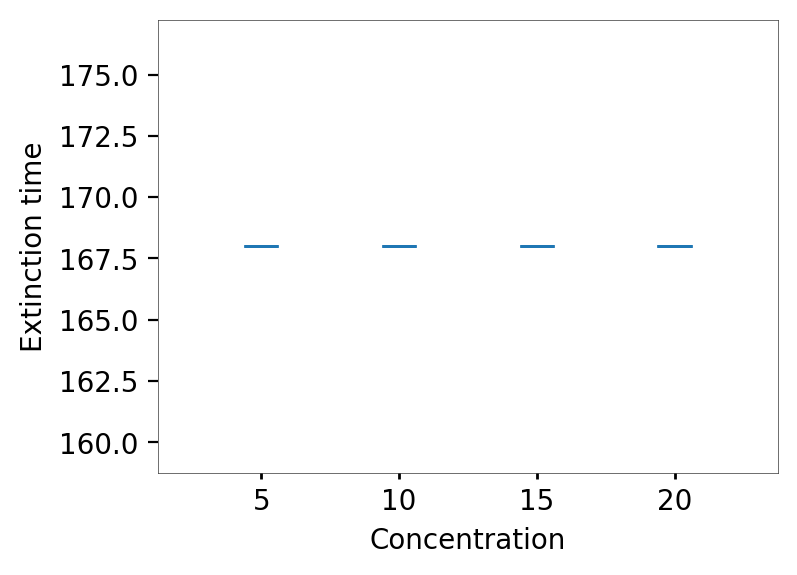

In [21]:
labels = [ '5', '10', '15', '20']
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))

plt.violinplot([ extinction_time1C5, extinction_time1C10, extinction_time1C15, extinction_time1C20], showmeans=True)
#plt.yscale('log')
#plt.ylim(2, 180)
set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.title('Gen only')
plt.savefig('00extinction_GOnly.png', dpi=200,bbox_inches='tight' )

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([ extinction_time2C5, extinction_time2C10, extinction_time2C15, extinction_time2C20], showmeans=True)
#plt.yscale('log')
#plt.ylim(2, 180)
set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.title('EPS only')
plt.savefig('00extinction_GEPS.png', dpi=200,bbox_inches='tight' )

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([ extinction_time3C5, extinction_time3C10, extinction_time3C15, extinction_time3C20], showmeans=True)
#plt.yscale('log')
#plt.ylim(2, 180)
set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.title('Physio only')
plt.savefig('00extinction_GPhysio.png', dpi=200,bbox_inches='tight' )

plt.show()
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
plt.violinplot([ extinction_time4C5, extinction_time4C10, extinction_time4C15, extinction_time4C20], showmeans=True)
#plt.title('EPS + physio only')
set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.ylim(2, 180)
#plt.yscale('log')
#plt.title('all scenarios')
plt.savefig('00extinction_GEPSPhysio.png', dpi=200,bbox_inches='tight' )


#plt.savefig('00extinction_all.png', dpi=200,bbox_inches='tight' )

Text(0, 0.5, 'Extinction time')

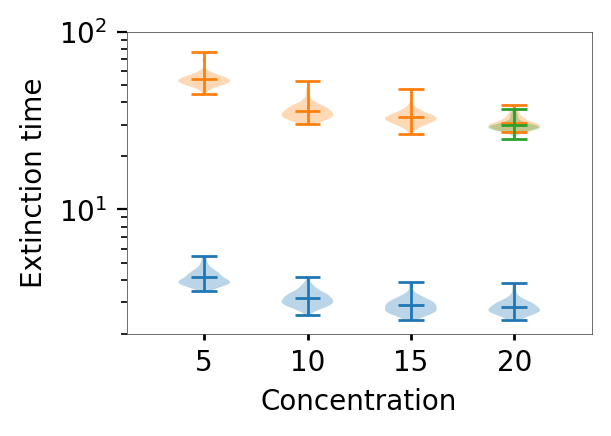

In [83]:
mm=100
#labels = [ 'C=5', 'C=10', 'C=15', 'C=20']
labels = [ '5', '10', '15', '20']
fig1, ax1 = plt.subplots(dpi=200, figsize=(3,2))
plt.violinplot([ extinction_time1C5, extinction_time1C10, extinction_time1C15, extinction_time1C20], showmeans=True)
plt.yscale('log')
plt.ylim(2, mm)


#plt.show()
plt.violinplot([ extinction_time3C5, extinction_time3C10, extinction_time3C15, extinction_time3C20], showmeans=True)
plt.violinplot([ extinction_time2C5, extinction_time2C10, extinction_time2C15, extinction_time2C20], showmeans=True)
plt.yscale('log')
plt.ylim(2, mm)
#plt.title('EPS only')

#plt.show()
plt.yscale('log')
plt.ylim(2, mm)
#plt.title('Physio only')

#plt.show()
#plt.violinplot([extinction_time4C2, extinction_time4C5, extinction_time4C10, extinction_time4C15, extinction_time4C20], showmeans=True)
#plt.title('EPS + physio only')
#plt.ylim(2, 180)
#plt.yscale('log')
set_axis_style(ax1, labels)
plt.ylabel('Extinction time')
#plt.savefig('00extinction_Selected.png', dpi=200,bbox_inches='tight' )√

(array([28., 13.,  5.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 53.]),
 array([ 11.4 ,  16.62,  21.84,  27.06,  32.28,  37.5 ,  42.72,  47.94,
         53.16,  58.38,  63.6 ,  68.82,  74.04,  79.26,  84.48,  89.7 ,
         94.92, 100.14, 105.36, 110.58, 115.8 , 121.02, 126.24, 131.46,
        136.68, 141.9 , 147.12, 152.34, 157.56, 162.78, 168.  ]),
 <a list of 30 Patch objects>)

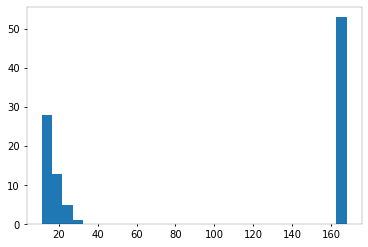

In [116]:
plt.hist([extinction_time1C2], 30)


## population composition

In [25]:
def get_one_population_composition(pop, genotypes, weights):
    this_composition=np.zeros([k+1])
    for i in range (k+1):
        this_composition[i]= (np.sum(pop[weights==i]))
    return this_composition

def get_mean_final_pop(name='',addname='_bio_pop.txt', N=1, k=1):
    fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
    #ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

    genotypes=generate_genotypes(k)
    weights=np.sum(genotypes,1)
    final_composition=np.zeros([k+1])

    
    for i in range (N):
        loadname=name+str(i)
        pop=np.loadtxt(loadname+addname)
        final_pop=pop[-1, :]
        this_final_composition=get_one_population_composition(final_pop, genotypes, weights)
        #print ('this is final local', this_final_composition)
        final_composition=final_composition+this_final_composition
        #print ('final', final_composition)
    final_composition=final_composition/N
    x = ([0,1,2,3,4])
    plt.bar(x, final_composition, align='center', log=True, alpha=0.5)
    return (final_composition)

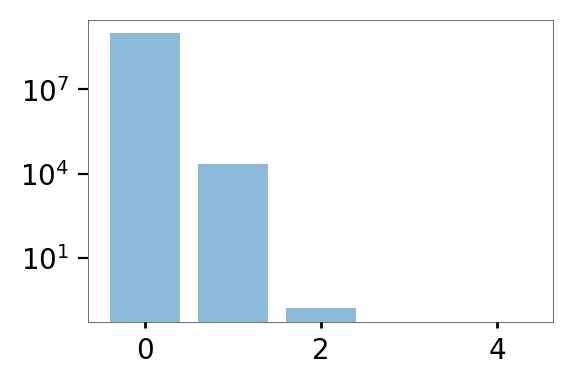

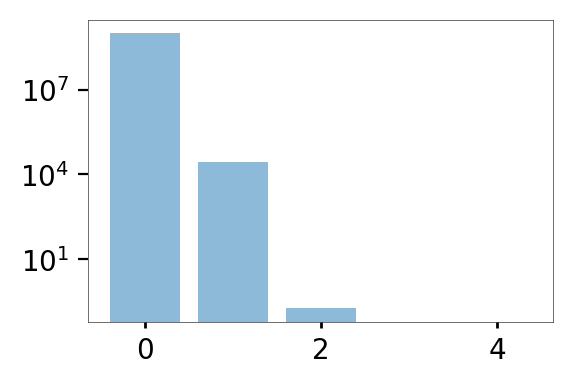

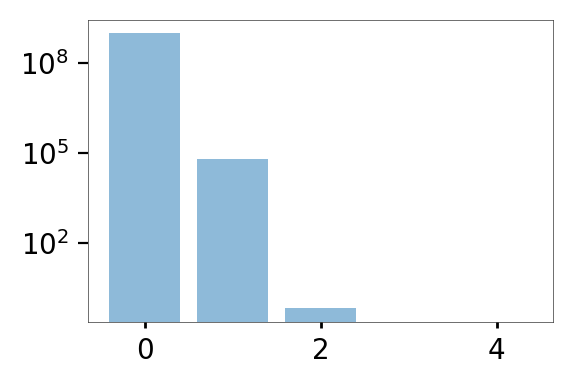

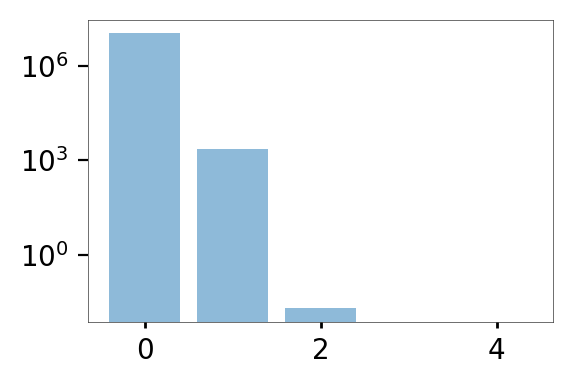

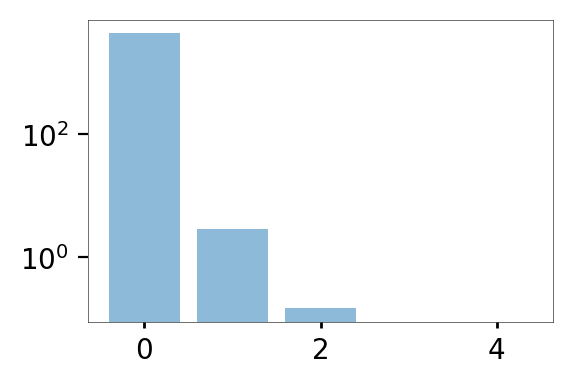

In [27]:
N=100
k=4
name='00repeated_t_C2_GenEPSPhysio'
final_compositionC2S4=get_mean_final_pop(name=name, N=N, k=k)
name='repeated_t_C5_GenEPS10Physio'
final_compositionC5S4=get_mean_final_pop(name=name, N=N, k=k)
name='repeated_treatment_C10_GenEPS10Physio'
final_compositionC10S4=get_mean_final_pop(name=name, N=N, k=k)
name='00repeated_t_C15_GenEPS10Physio'
final_compositionC15S4=get_mean_final_pop(name=name, N=N, k=k)
name='00repeated_t_C20_GenEPS10Physio'
final_compositionC20S4=get_mean_final_pop(name=name, N=N, k=k)

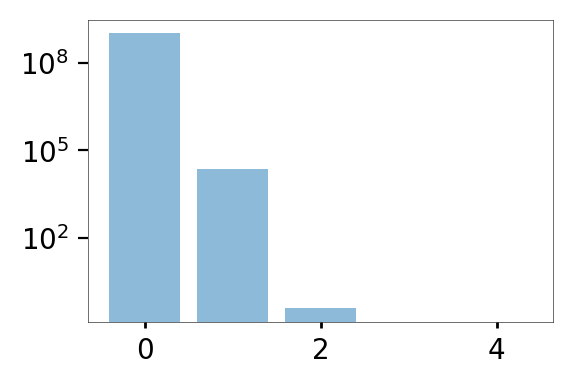

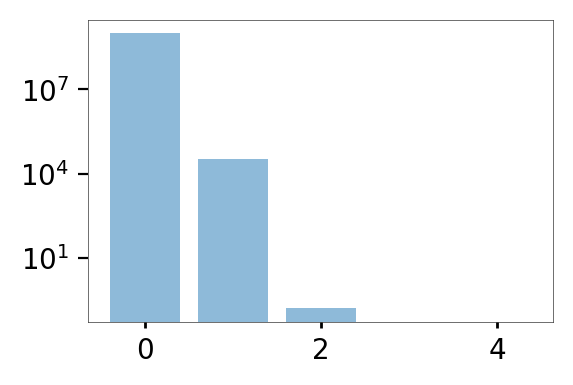

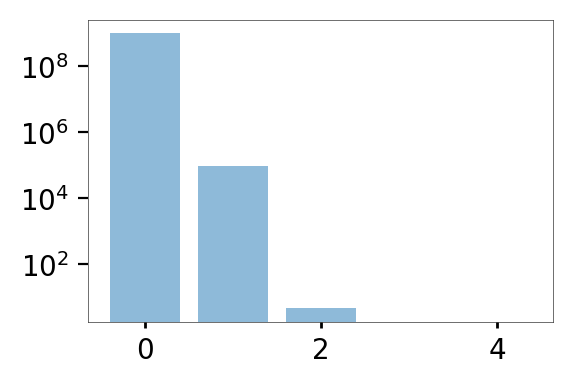

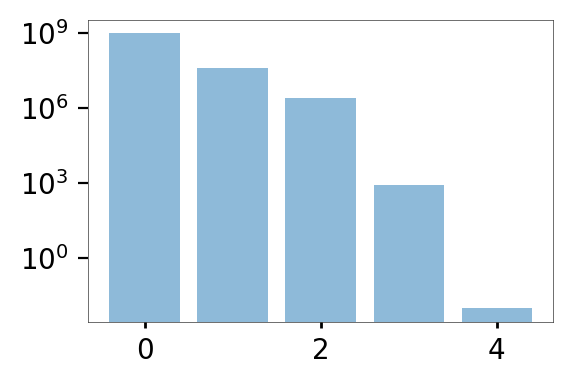

In [28]:
N=100
k=4
name='00repeated_t_C2_GenEPS'
final_compositionC2S2=get_mean_final_pop(name=name, N=N, k=k)
name='repeated_t_C5_GenEPS10'
final_compositionC5S2=get_mean_final_pop(name=name, N=N, k=k)
name='repeated_treatment_C10_GenEPS10'
final_compositionC10S2=get_mean_final_pop(name=name, N=N, k=k)
name='00repeated_t_C15_GenEPS10'
final_compositionC15S2=get_mean_final_pop(name=name, N=N, k=k)

In [ ]:
shift=0.15
x = np.array([0,1,2,3,4])
plt.bar(x-2*shift, final_compositionC2S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x-1*shift, final_compositionC5S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x-0*shift, final_compositionC10S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x+shift, final_compositionC15S2,shift, align='edge', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('EPS')
plt.legend(['C2', 'C5', 'C10', 'C15', 'C20'])
#plt.yscale('log')
#plt.savefig('00EPSFinalComposition.png',  dpi=200,bbox_inches='tight')

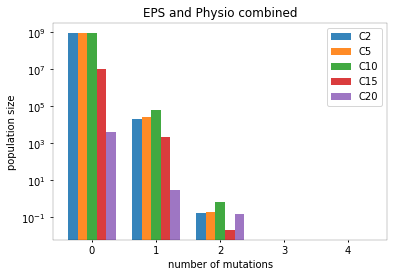

In [169]:
shift=0.15
x = np.array([0,1,2,3,4])
plt.bar(x-2*shift, final_compositionC2S4,shift, align='center', log=True, alpha=0.9)
plt.bar(x-1*shift, final_compositionC5S4,shift, align='center', log=True, alpha=0.9)
plt.bar(x-0*shift, final_compositionC10S4,shift, align='center', log=True, alpha=0.9)
plt.bar(x+shift, final_compositionC15S4,shift, align='center', log=True, alpha=0.9)
plt.bar(x+2*shift, final_compositionC20S4,shift, align='center', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('EPS and Physio combined')
plt.legend(['C2', 'C5', 'C10', 'C15', 'C20'])
#plt.savefig('00EPSPhysioFinalComposition.png',  dpi=200,bbox_inches='tight')

In [23]:
def makeColors(r,g,b, steps):
    step=1/(steps+2)
    colors=[]
    for i in range (steps):
        col=(r, g, b,(i+2)*step )
        colors.append(col)

    return(colors)
  

[-1.  0.  1.  2.  3.  4.  5.]


([<matplotlib.axis.XTick at 0x7fbf4b512d00>,
 [Text(0, 0, '2'), Text(0, 0, '5'), Text(0, 0, '10'), Text(0, 0, '15')])

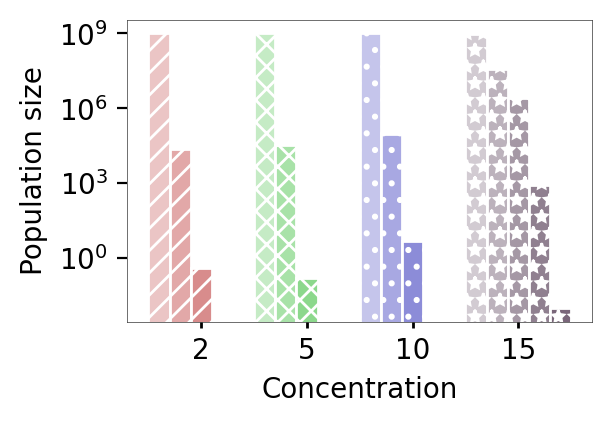

In [81]:
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))

shift=0.2
x = shift*np.array([0,1,2,3,4])-1

mycolors=makeColors(0.7,0.1,0.1, 6)  
plt.bar(x+1, final_compositionC2S2,shift, align='edge', log=True, edgecolor='white', hatch='///', color=mycolors)
mycolors=makeColors(0.1,0.7,0.1, 6)  
plt.bar(x+2, final_compositionC5S2,shift, align='edge', log=True,edgecolor='white',hatch='xxx',  color=mycolors)
mycolors=makeColors(0.1,0.1,0.7, 6)  
plt.bar(x+3, final_compositionC10S2,shift, align='edge', log=True,edgecolor='white', hatch='..', color=mycolors)
mycolors=makeColors(0.3,0.2,0.3, 6)  
plt.bar(x+4, final_compositionC15S2,shift, align='edge', log=True, edgecolor='white',hatch='**', color=mycolors)
plt.xlabel('Concentration')
plt.ylabel('Population size')
#plt.title('EPS')

xlocs, xlabels = plt.xticks()
xlabels=[r'2',r'5', '10', '15']
print (xlocs)
xlocs=[0.5, 1.5,2.5,3.5]
plt.xticks(xlocs, xlabels)
#plt.savefig('00EPSFinalComposition.png',  dpi=200,bbox_inches='tight')


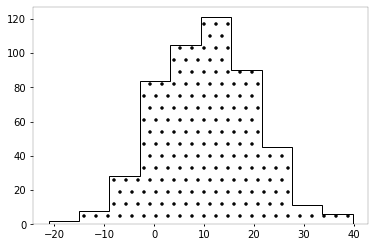

In [52]:
data = np.random.normal(loc=10, scale=10, size=500)
plt.hist(data, histtype='step', edgecolor='black', fill=False, hatch='.')
plt.show()

[-1.  0.  1.  2.  3.  4.]


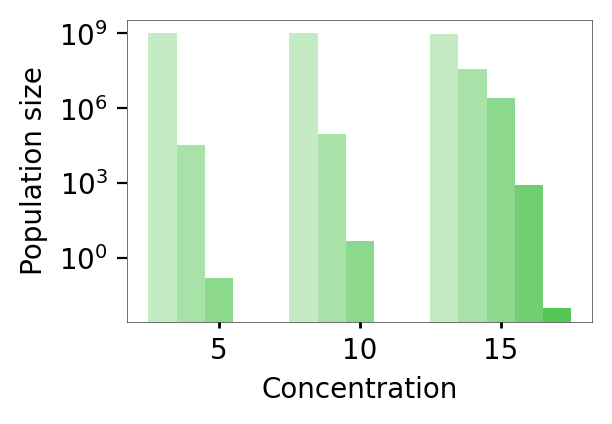

In [443]:
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))

shift=0.2
x = shift*np.array([0,1,2,3,4])-1

mycolors=makeColors(0.1,0.7,0.1, 6) 

#mycolors=makeColors(0.7,0.1,0.1, 6)  
plt.bar(x+1, final_compositionC5S2,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.7,0.1, 6)  
plt.bar(x+2, final_compositionC10S2,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.1,0.7, 6)  
plt.bar(x+3, final_compositionC15S2,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.3,0.2,0.3, 6)  
#plt.bar(x+4, final_compositionC15S2,shift, align='edge', log=True,  color=mycolors)
plt.xlabel('Concentration')
plt.ylabel('Population size')
#plt.title('EPS')

xlocs, xlabels = plt.xticks()
xlabels=[r'5', '10', '15']
print (xlocs)
xlocs=[0.5, 1.5,2.5]
plt.xticks(xlocs, xlabels)
plt.savefig('000EPSFinalComposition.png',  dpi=200,bbox_inches='tight')


[-1.  0.  1.  2.  3.  4.  5.]


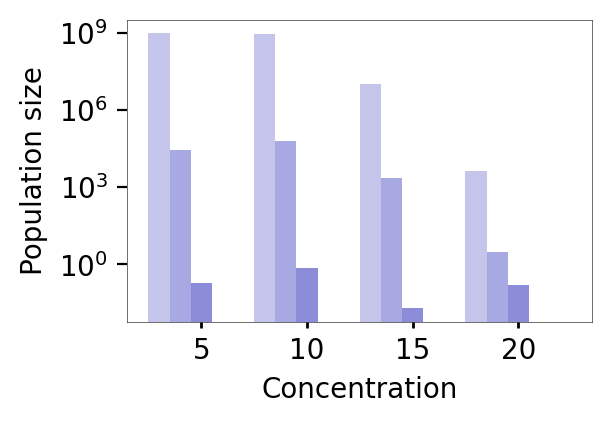

In [442]:
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
shift=0.2
x = shift*np.array([0,1,2,3,4])-1

mycolors=makeColors(0.1,0.1,0.7, 6) 

#mycolors=makeColors(0.7,0.1,0.1, 6)  
plt.bar(x+1, final_compositionC5S4,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.7,0.1, 6)  
plt.bar(x+2, final_compositionC10S4,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.1,0.7, 6)  
plt.bar(x+3, final_compositionC15S4,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.3,0.2,0.3, 6)  
plt.bar(x+4, final_compositionC20S4,shift, align='edge', log=True,  color=mycolors)

#mycolors=makeColors(0.6,0.1,0.3, 6)  
#plt.bar(x+5, final_compositionC20S4,shift, align='edge', log=True,  color=mycolors)

plt.xlabel('Concentration', fontsize=10)
plt.ylabel('Population size')


xlocs, xlabels = plt.xticks()
xlabels=[r'5', '10', '15', '20']
print (xlocs)
xlocs=[0.5, 1.5,2.5,3.5]
plt.xticks(xlocs, xlabels)
plt.savefig('000EPSPhysioFinalComposition.png',  dpi=200,bbox_inches='tight')

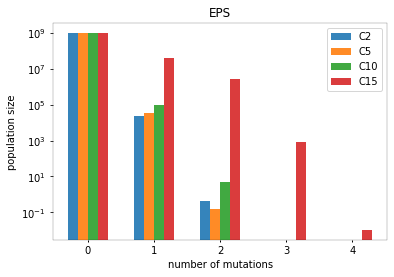

In [264]:
shift=0.15
x = np.array([0,1,2,3,4])
plt.bar(x-2*shift, final_compositionC2S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x-1*shift, final_compositionC5S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x-0*shift, final_compositionC10S2,shift, align='edge', log=True, alpha=0.9)
plt.bar(x+shift, final_compositionC15S2,shift, align='edge', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('EPS')
plt.legend(['C2', 'C5', 'C10', 'C15', 'C20'])
#plt.yscale('log')
#plt.savefig('00EPSFinalComposition.png',  dpi=200,bbox_inches='tight')

# Interaction between Pla and Bio

Passage experiment, 100 times, range of interaction strengths

## get all dynamics


In [87]:
def plot_all_dynamics(name='', N=1):
    savename0=name+'F'
    fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
    ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        this_conc=np.loadtxt(loadname+'_conc.txt')
        dynamics_pla=np.loadtxt(loadname+'_pla_pop.txt')
        plt.semilogy(this_time, dynamics_pla, alpha=0.1)
        #plt.semilogy(dynamics_pla, alpha=0.1)
    plt.xlabel('Time [h]')
    plt.ylabel('N')
    plt.ylim(1,5*10**9)
    plt.xlim(0,9*24)
    plt.savefig('00'+name+'FigPlaDyn.png', dpi=200,bbox_inches='tight')
    fig1.show()

    fig2, ax2 = plt.subplots(dpi=200, figsize=(3, 2))
    ax2.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])

    for i in range (N):
        loadname=name+str(i)
        this_time=np.loadtxt(loadname+'_time.txt')
        this_time=this_time/60
        #this_conc=np.loadtxt(loadname+'_conc.txt')
        dynamics_bio=np.loadtxt(loadname+'_bio_pop.txt')
        plt.semilogy(this_time, dynamics_bio, ':', alpha=0.3)
        #plt.semilogy( dynamics_bio, alpha=0.3)
    #plt.title('Biofilm')
    plt.xlabel('Time [h]')
    plt.ylabel('N')
    plt.ylim(1,5*10**9)
    #plt.xlim(0,7)
    plt.xlim(0,9*24)
    plt.savefig('00'+name+'FigBioDyn.png', dpi=200,bbox_inches='tight')
    fig1.show()

    print ('all done')

<ipython-input-87-a10b2c479014>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-87-a10b2c479014>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-87-a10b2c479014>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-87-a10b2c479014>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-87-a10b2c479014>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-87-a10b2c479014>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-87-a10b2c479014>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-87-a10b2c479014>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


<ipython-input-87-a10b2c479014>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-87-a10b2c479014>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


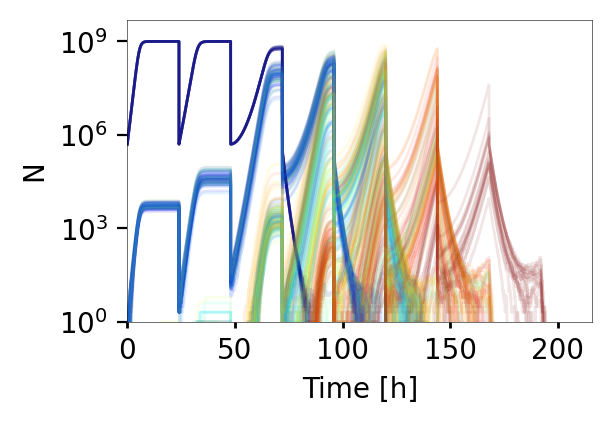

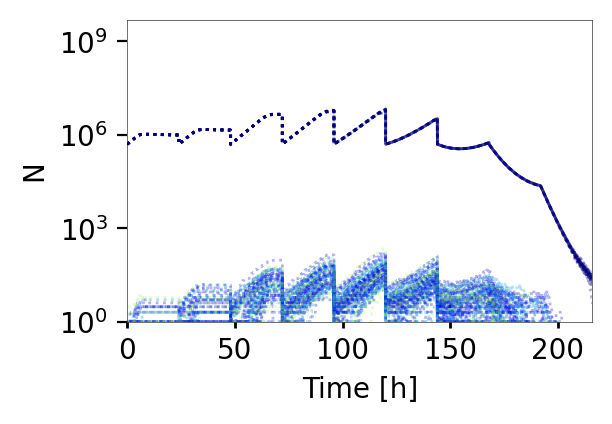

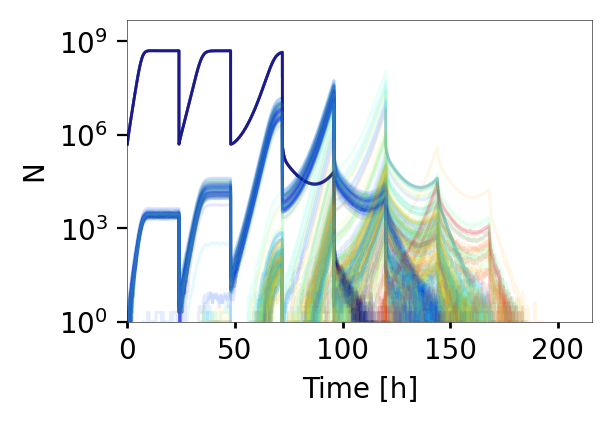

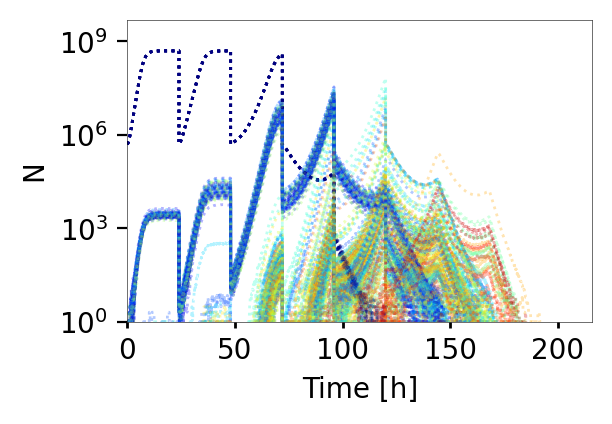

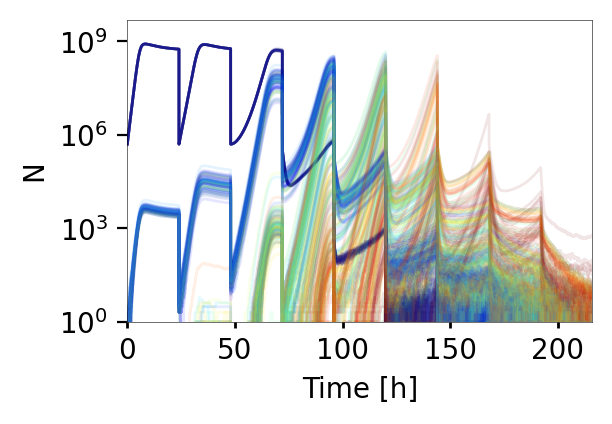

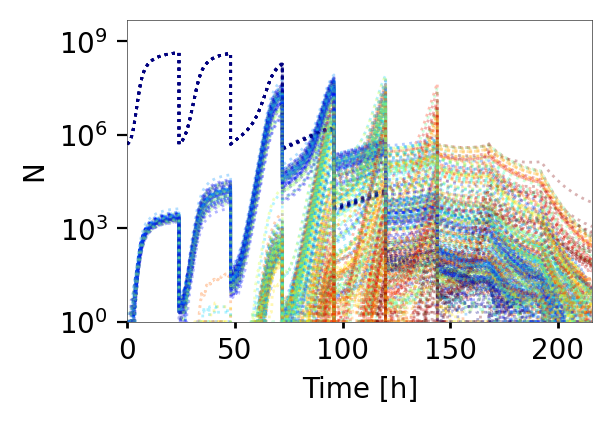

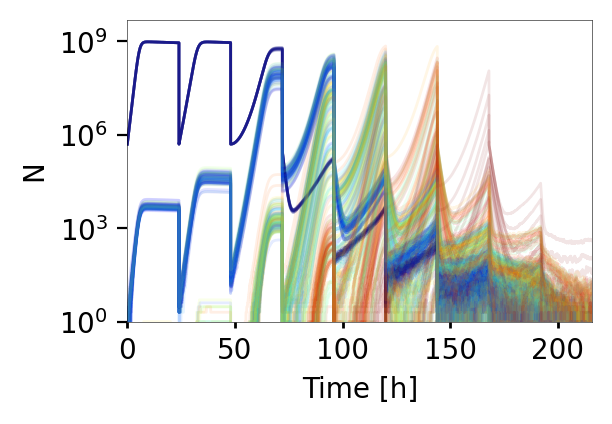

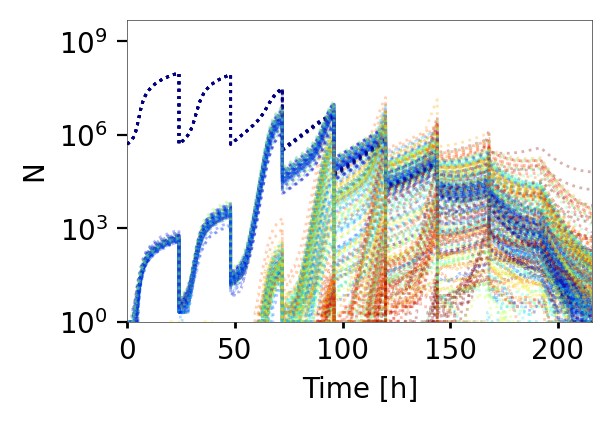

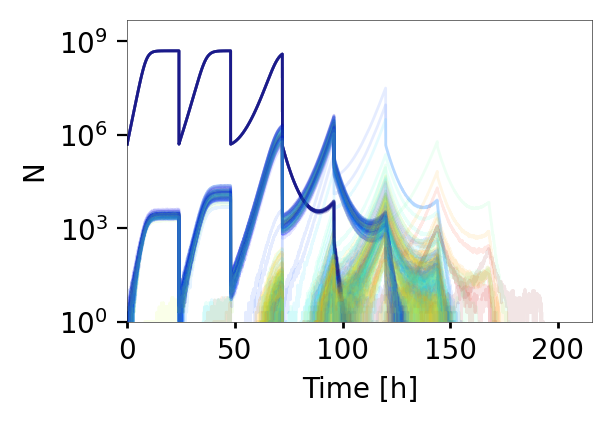

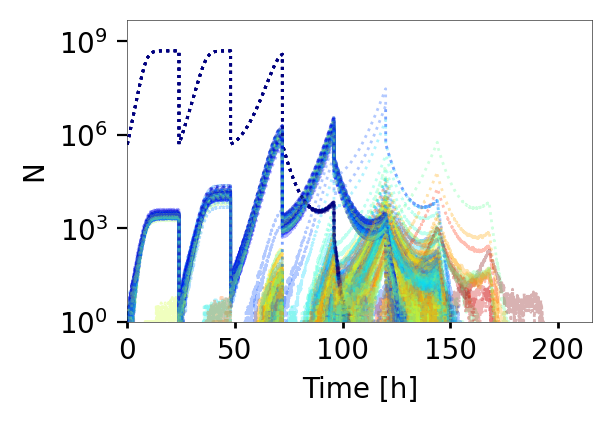

In [88]:
N=20

name='LongBioAndPlaAdRe0x'
plot_all_dynamics(name=name, N=N)
name='LongBioAndPlaAdRe01x'
plot_all_dynamics(name=name, N=N)
name='LongBioAndPlaAdRe001x'
plot_all_dynamics(name=name, N=N)
name='LongBioAndPlaAdRe0001x'
plot_all_dynamics(name=name, N=N)
name='LongBioAndPlaAdRe1x'
plot_all_dynamics(name=name, N=N)


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

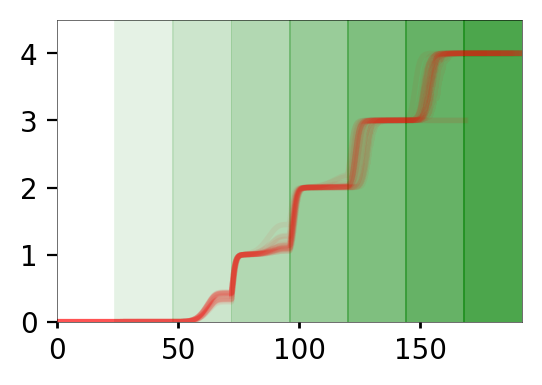

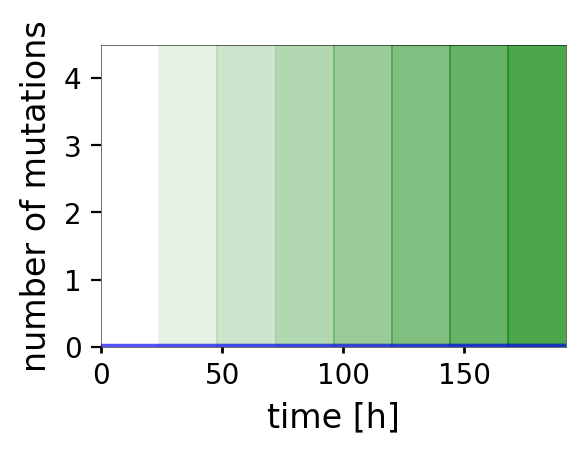

done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

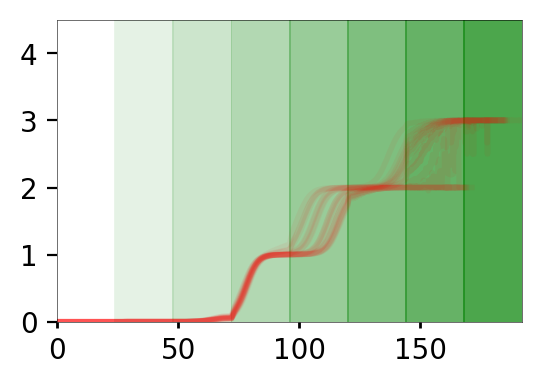

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

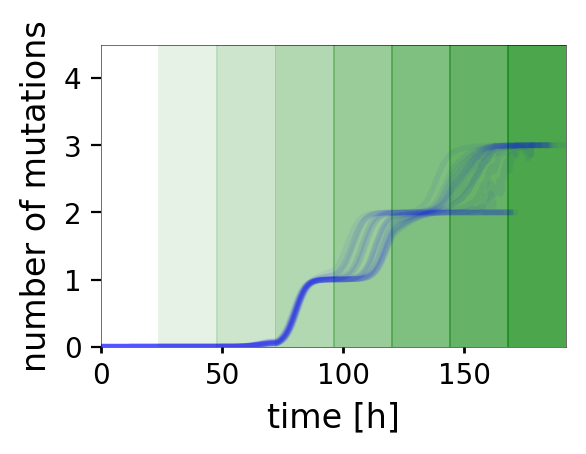

done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


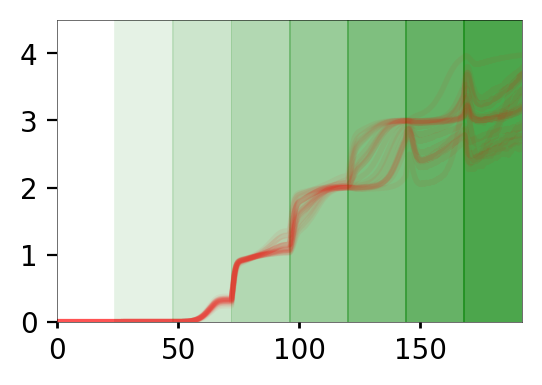

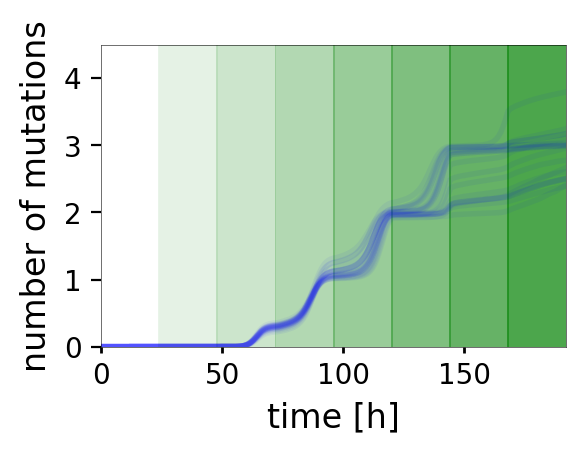

done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: divide by zero encountered in true_divide
  mean_mut2=np.sum(weighted_pops,

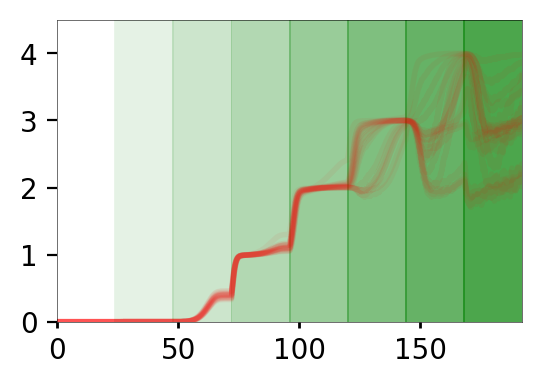

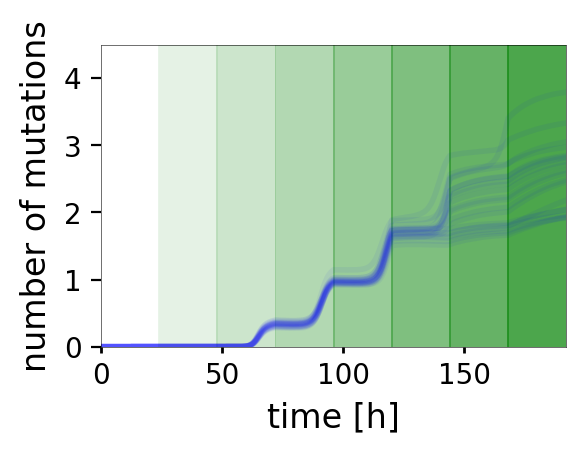

done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

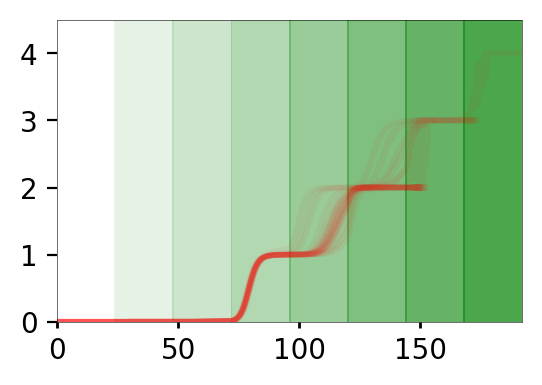

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

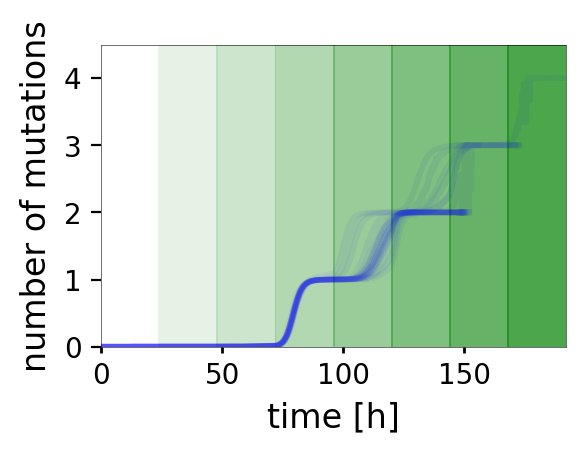

done


(array([ 0.,  0.,  0., ..., nan, nan, nan]),
 array([[500000.,      0.,      0., ...,      0.,      0.,      0.],
        [501263.,      0.,      0., ...,      0.,      0.,      0.],
        [502908.,      0.,      0., ...,      0.,      0.,      0.],
        ...,
        [     0.,      0.,      0., ...,      0.,      0.,      0.],
        [     0.,      0.,      0., ...,      0.,      0.,      0.],
        [     0.,      0.,      0., ...,      0.,      0.,      0.]]))

In [423]:
## Get mutations
name='LongBioAndPlaAdRe0x'
get_mean_mut_num(name=name, N=N, color='b', k=4)
name='LongBioAndPlaAdRe01x'
get_mean_mut_num(name=name, N=N, color='b', k=4)
name='LongBioAndPlaAdRe001x'
get_mean_mut_num(name=name, N=N, color='b', k=4)
name='LongBioAndPlaAdRe0001x'
get_mean_mut_num(name=name, N=N, color='b', k=4)
name='LongBioAndPlaAdRe1x'
get_mean_mut_num(name=name, N=N, color='b', k=4)


In [424]:
## Get timing
name='LongBioAndPlaAdRe0x'
Long_bio_ext_t_BioAndPlaAdRe0=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
Long_pla_ext_t_BioAndPlaAdRe0=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

name='LongBioAndPlaAdRe01x'
Long_bio_ext_t_BioAndPlaAdRe01=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
Long_pla_ext_t_BioAndPlaAdRe01=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

name='LongBioAndPlaAdRe001x'
Long_bio_ext_t_BioAndPlaAdRe001=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
Long_pla_ext_t_BioAndPlaAdRe001=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

name='LongBioAndPlaAdRe0001x'
Long_bio_ext_t_BioAndPlaAdRe0001=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
Long_pla_ext_t_BioAndPlaAdRe0001=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

name='LongBioAndPlaAdRe1x'
Long_bio_ext_t_BioAndPlaAdRe1=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
Long_pla_ext_t_BioAndPlaAdRe1=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)


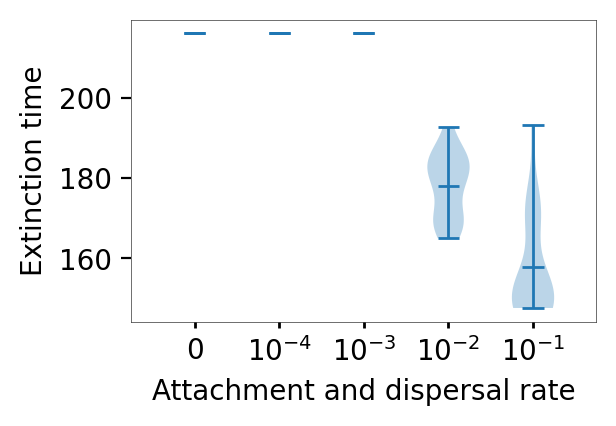

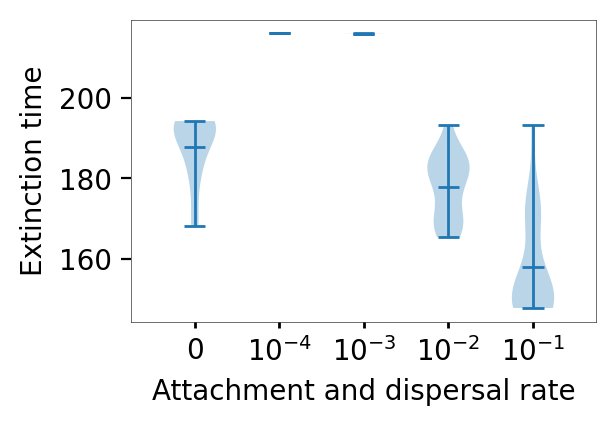

In [425]:
#ANCHOR
labels=['0',r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$',r'$10^{-1}$']

fig1, ax1 = plt.subplots(dpi=200, figsize=(3,2))
plt.violinplot([Long_bio_ext_t_BioAndPlaAdRe0, Long_bio_ext_t_BioAndPlaAdRe0001,  Long_bio_ext_t_BioAndPlaAdRe001,  Long_bio_ext_t_BioAndPlaAdRe01, Long_bio_ext_t_BioAndPlaAdRe1], showmeans=True)
set_axis_style(ax1, labels)
#plt.title('Biofilm')
plt.ylabel('Extinction time')
plt.xlabel('Attachment and dispersal rate')
plt.savefig('00Long_extinction_ByInteractionBio.png', dpi=200,bbox_inches='tight' )

fig1, ax1 = plt.subplots(dpi=200, figsize=(3,2))
plt.violinplot([Long_pla_ext_t_BioAndPlaAdRe0, Long_pla_ext_t_BioAndPlaAdRe0001,  Long_pla_ext_t_BioAndPlaAdRe001,  Long_pla_ext_t_BioAndPlaAdRe01, Long_pla_ext_t_BioAndPlaAdRe1], showmeans=True)
set_axis_style(ax1, labels)
#plt.title('Plankton')
plt.ylabel('Extinction time')
plt.xlabel('Attachment and dispersal rate')
plt.savefig('00Long_extinction_ByInteractionPla.png', dpi=200,bbox_inches='tight' )

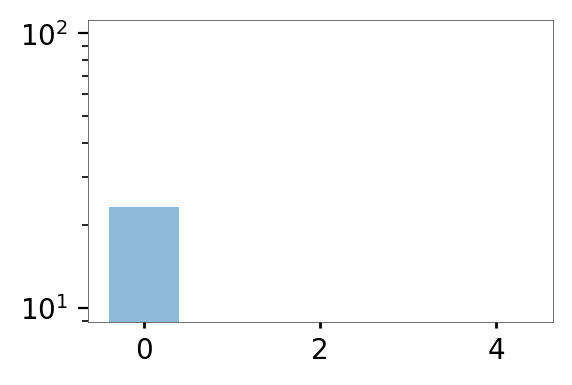

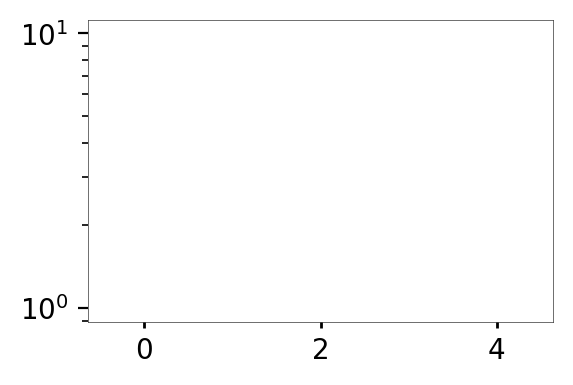

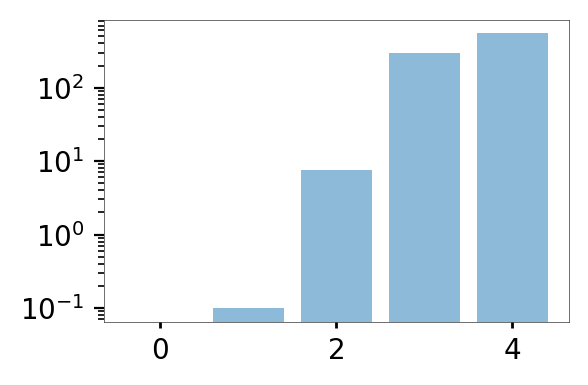

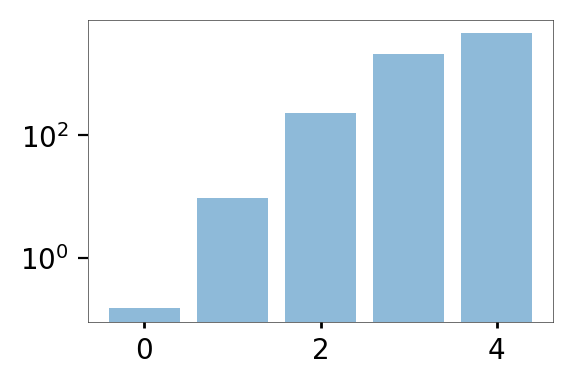

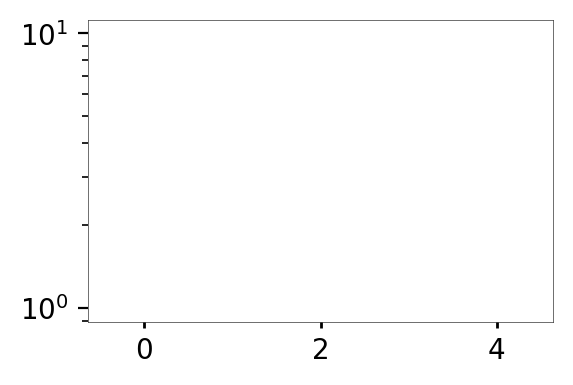

In [92]:
N=20
k=4
name='LongBioAndPlaAdRe0x'
Bfinal_composition0=get_mean_final_pop(name=name, N=N, k=k)
name='LongBioAndPlaAdRe01x'
Bfinal_composition01=get_mean_final_pop(name=name, N=N, k=k)
name='LongBioAndPlaAdRe001x'
Bfinal_composition001=get_mean_final_pop(name=name, N=N, k=k)
name='LongBioAndPlaAdRe0001x'
Bfinal_composition0001=get_mean_final_pop(name=name, N=N, k=k)
name='LongBioAndPlaAdRe1x'
Bfinal_composition1=get_mean_final_pop(name=name, N=N, k=k)

/Users/barbora/miniconda3/lib/python3.8/site-packages/ipykernel/pylab/backend_inline.py:183: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  for label in axis.get_ticklabels()])


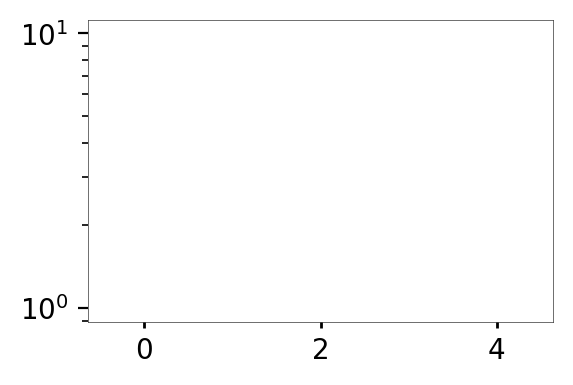

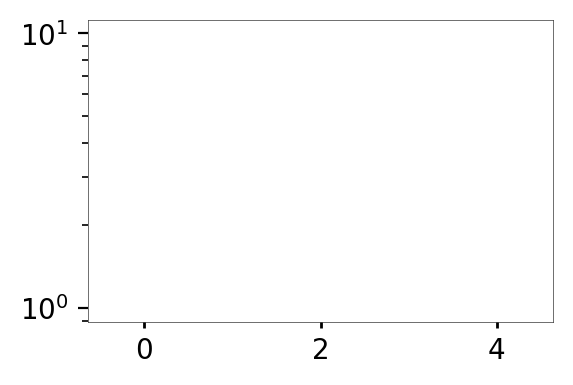

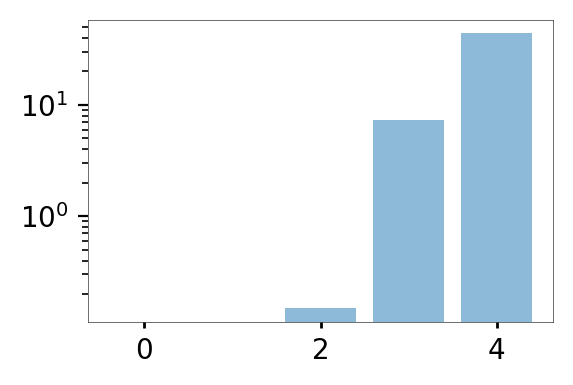

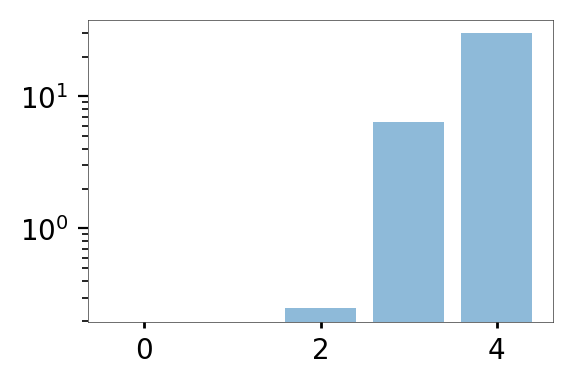

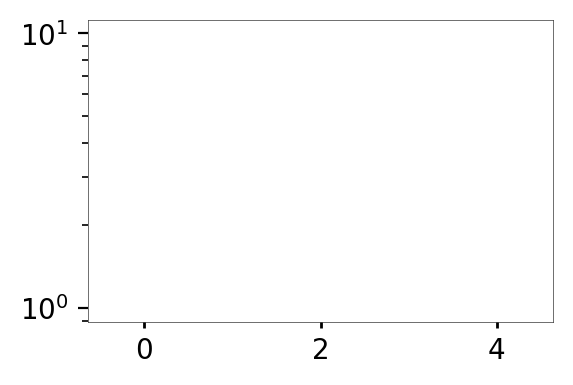

In [90]:
N=20
k=4
addname='_pla_pop.txt'
name='LongBioAndPlaAdRe0x'
Pfinal_composition0=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='LongBioAndPlaAdRe01x'
Pfinal_composition01=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='LongBioAndPlaAdRe001x'
Pfinal_composition001=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='LongBioAndPlaAdRe0001x'
Pfinal_composition0001=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='LongBioAndPlaAdRe1x'
Pfinal_composition1=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)

In [111]:
#121/255
#186/255 
219/255

0.8588235294117647

[0. 0. 0. 0. 0.]
[-2.  0.  2.  4.  6.]
[1.e-06 1.e-04 1.e-02 1.e+00 1.e+02 1.e+04 1.e+06] <a list of 7 Text major ticklabel objects>


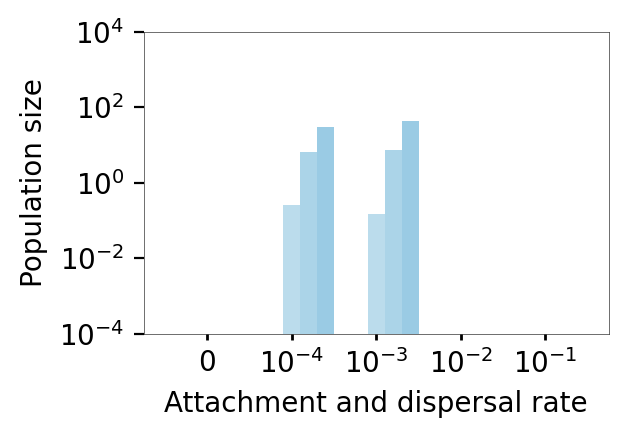

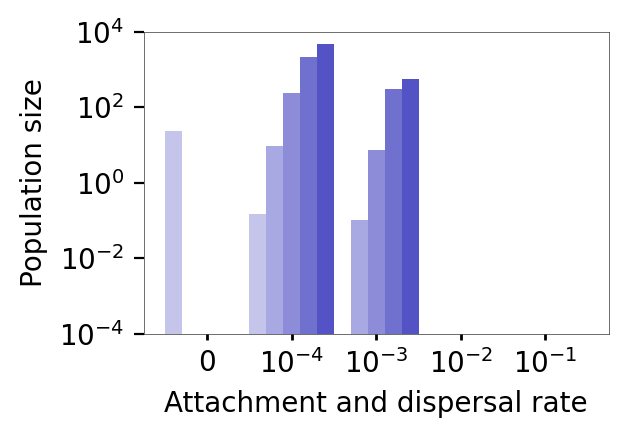

In [114]:
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))

shift=0.2
x = shift*np.array([0,1,2,3,4])-1
mycolors=makeColors(0.4745,0.7294,0.8588, 6) 
print (Pfinal_composition0)
#mycolors=makeColors(0.7,0.1,0.1, 6)  
plt.bar(x+1, Pfinal_composition0,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.7,0.1, 6)  
plt.bar(x+2, Pfinal_composition0001,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.1,0.7, 6)  
plt.bar(x+3, Pfinal_composition001,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.3,0.2,0.3, 6)  
plt.bar(x+4, Pfinal_composition01,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.5,0.3, 6)  
plt.bar(x+5, Pfinal_composition1,shift, align='edge', log=True,  color=mycolors)
plt.xlabel('Attachment and dispersal rate')
plt.ylabel('Population size')
plt.ylim(0.0001,1*10**4)

ylocs, ylabels = plt.yticks()


xlocs, xlabels = plt.xticks()
xlabels=['0',r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$',r'$10^{-1}$']
print (xlocs)
xlocs=[0.5, 1.5,2.5,3.5, 4.5]
plt.xticks(xlocs, xlabels)
plt.savefig('00bPlaFinalComposition.png',  dpi=200,bbox_inches='tight')



fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))

shift=0.2
x = shift*np.array([0,1,2,3,4])

mycolors=makeColors(0.1,0.1,0.7, 6) 
#mycolors=makeColors(0.7,0.1,0.1, 6)  
plt.bar(x, Bfinal_composition0,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.7,0.1, 6)  
plt.bar(x+1, Bfinal_composition0001,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.1,0.7, 6)  
plt.bar(x+2, Bfinal_composition001,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.3,0.2,0.3, 6)  
plt.bar(x+3, Bfinal_composition01,shift, align='edge', log=True,  color=mycolors)
#mycolors=makeColors(0.1,0.5,0.3, 6)  
plt.bar(x+4, Bfinal_composition1,shift, align='edge', log=True,  color=mycolors)
plt.xlabel('Attachment and dispersal rate')
plt.ylabel('Population size')
plt.ylim(0.0001,1*10**4)
xlocs, xlabels = plt.xticks()
xlabels=['0',r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$',r'$10^{-1}$']

xlocs=[0.5, 1.5,2.5,3.5, 4.5]
plt.xticks(xlocs, xlabels)

#plt.yticks(ylocs, ylabels)
print(ylocs, ylabels)
plt.savefig('00bBioFinalComposition.png',  dpi=200,bbox_inches='tight')

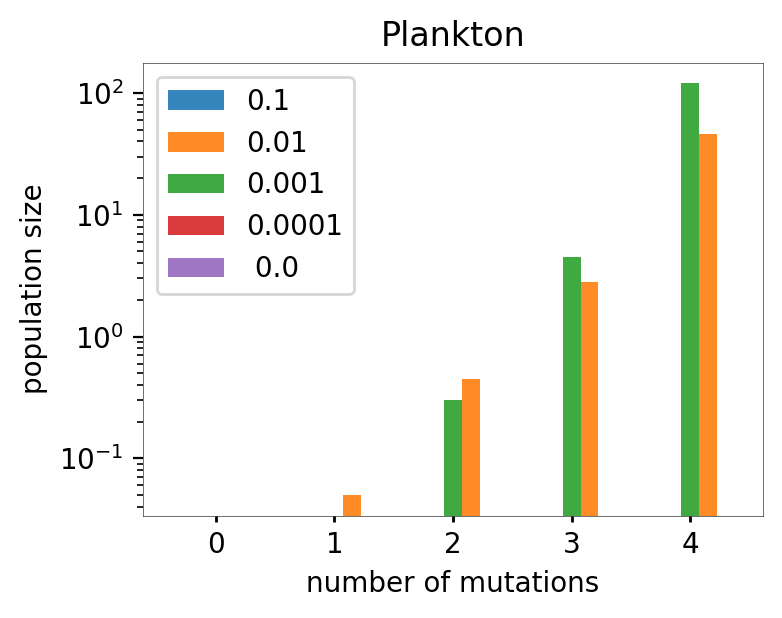

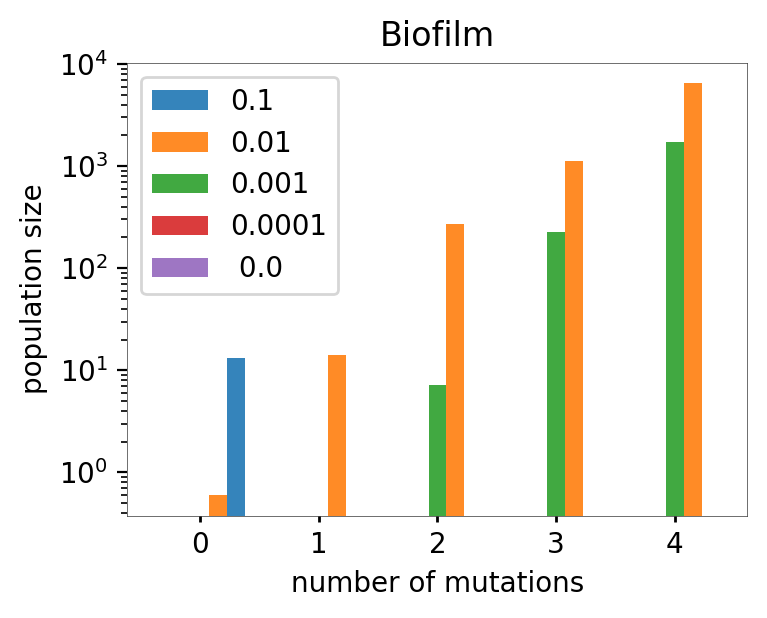

In [234]:
shift=0.15
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
x = np.array([0,1,2,3,4])
plt.bar(x+2*shift, Pfinal_composition0,shift, align='center', log=True, alpha=0.9)
plt.bar(x+1*shift, Pfinal_composition0001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-0*shift, Pfinal_composition001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-shift, Pfinal_composition01,shift, align='center', log=True, alpha=0.9)
plt.bar(x-2*shift, Pfinal_composition1,shift, align='center', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('Plankton')
plt.legend([ '0.1', '0.01', '0.001', '0.0001',' 0.0'])
plt.savefig('00LongPlaFinalComposition.png',  dpi=200,bbox_inches='tight')

shift=0.15
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
x = np.array([0,1,2,3,4])
plt.bar(x+2*shift, Bfinal_composition0,shift, align='center', log=True, alpha=0.9)
plt.bar(x+1*shift, Bfinal_composition0001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-0*shift, Bfinal_composition001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-shift, Bfinal_composition01,shift, align='center', log=True, alpha=0.9)
plt.bar(x-2*shift, Bfinal_composition1,shift, align='center', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('Biofilm')
plt.legend([ '0.1', '0.01', '0.001', '0.0001',' 0.0'])
plt.savefig('00LongBioFinalComposition.png',  dpi=200,bbox_inches='tight')

### Old short Simulations

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

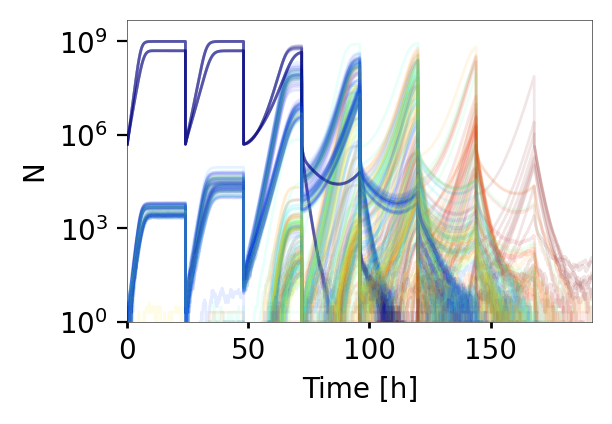

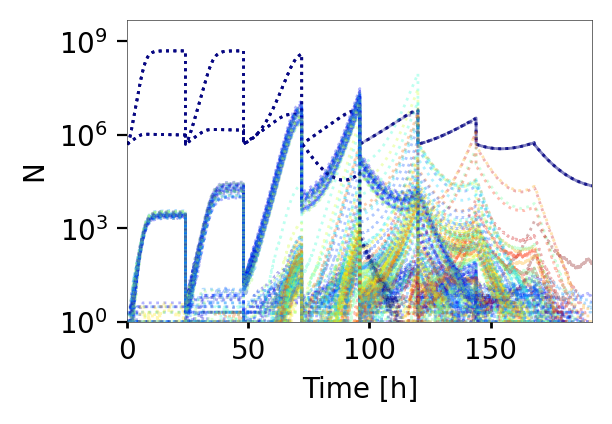

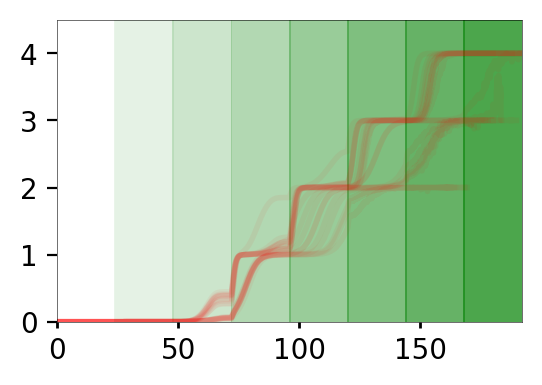

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

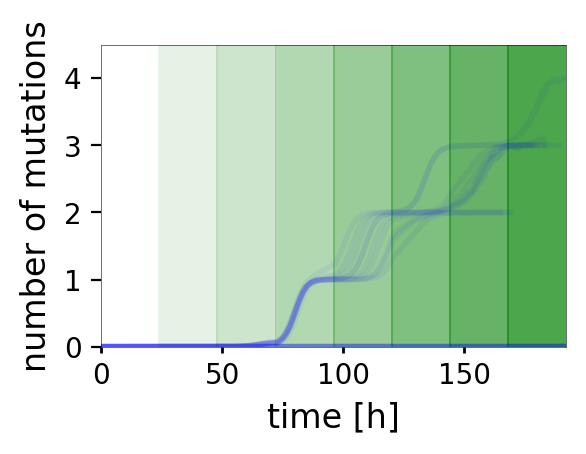

done


{'bodies': [<matplotlib.collections.PolyCollection at 0x7fc365cafe50>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fc365cafca0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fc332836940>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fc332836e20>}

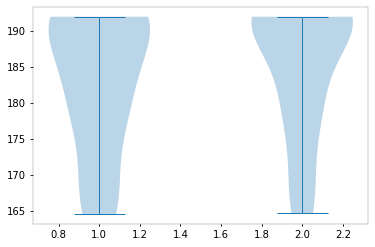

In [172]:
N=20

name='BioAndPlaAdRe0'

plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=20, color='b', k=4)
bio_ext_t_BioAndPlaAdRe0=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
pla_ext_t_BioAndPlaAdRe0=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

plt.violinplot([pla_ext_t_BioAndPlaAdRe0,bio_ext_t_BioAndPlaAdRe0])

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


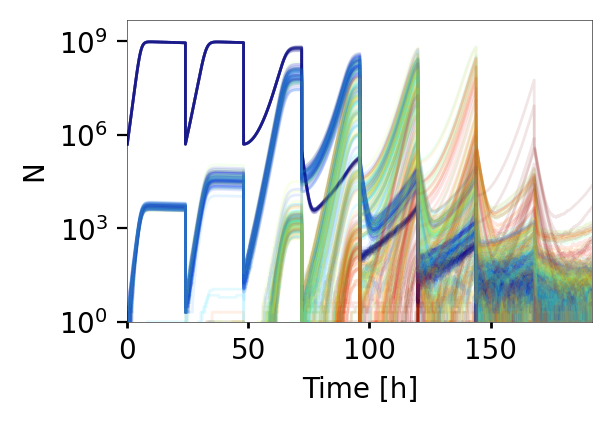

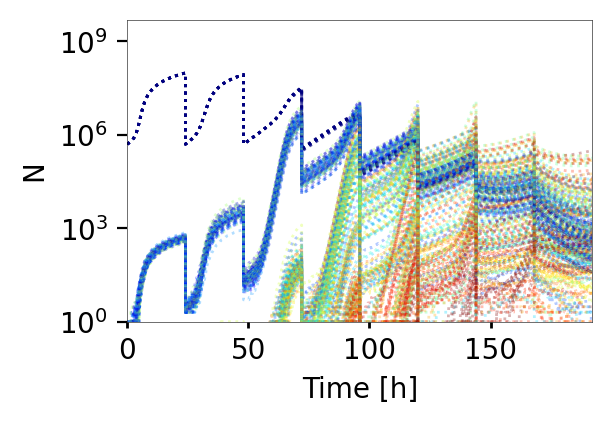

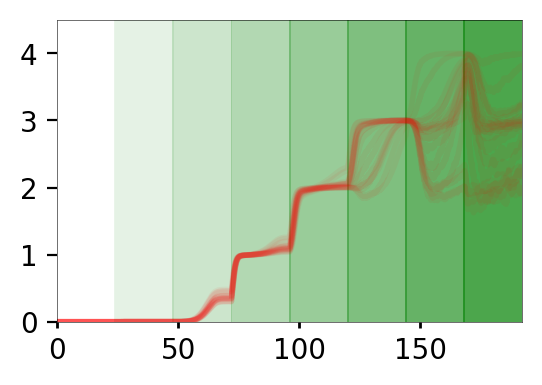

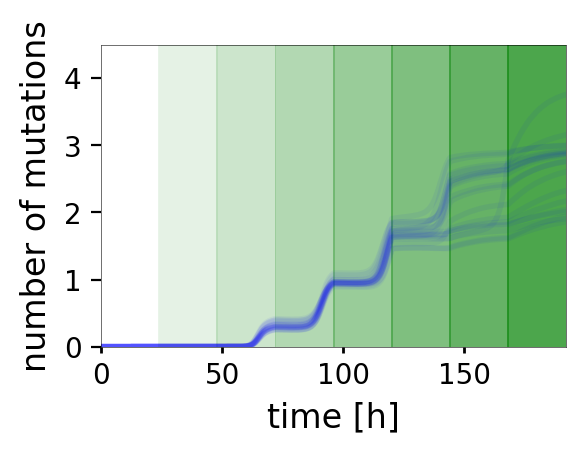

done


{'bodies': [<matplotlib.collections.PolyCollection at 0x7fc2f23f7730>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fc2f23f78b0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fc2f23f7850>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fc2f23f7dc0>}

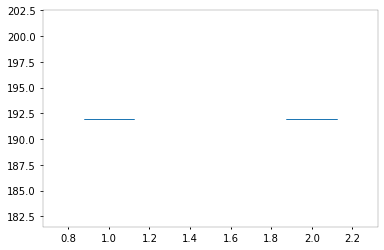

In [173]:
name='BioAndPlaAdRe0001'

plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=20, color='b', k=4)
bio_ext_t_BioAndPlaAdRe0001=get_mutant_timing(name=name, pop_name='_bio_pop', N=20, k=4)
pla_ext_t_BioAndPlaAdRe0001=get_mutant_timing(name=name, pop_name='_pla_pop', N=20, k=4)

plt.violinplot([pla_ext_t_BioAndPlaAdRe0001,bio_ext_t_BioAndPlaAdRe0001])

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()


all done


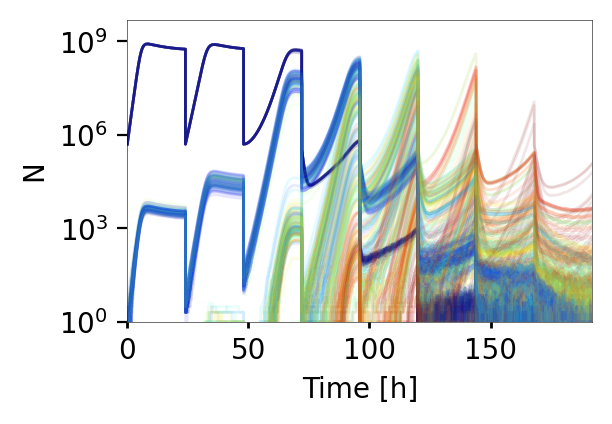

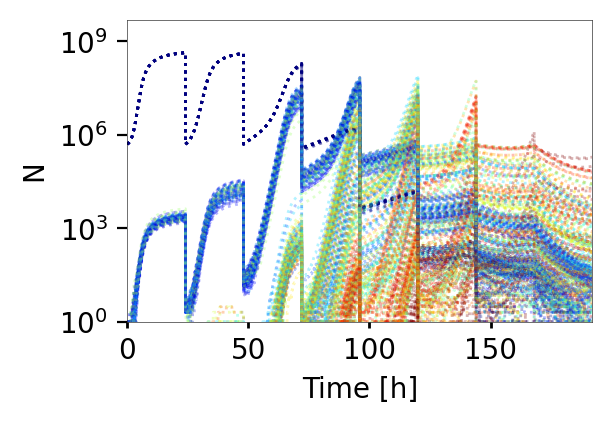

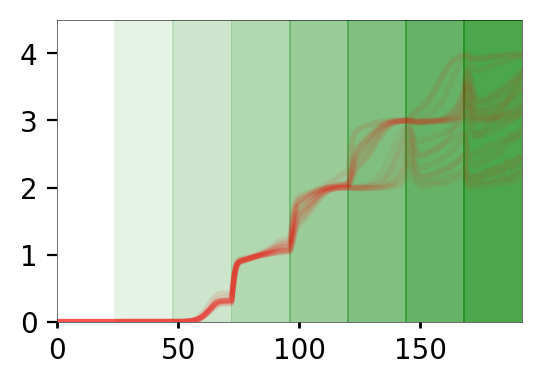

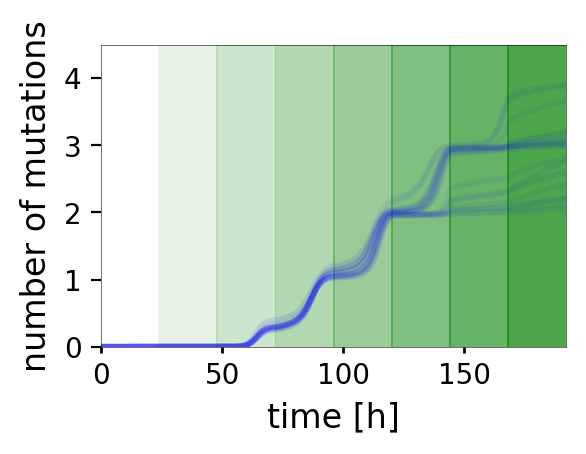

done


{'bodies': [<matplotlib.collections.PolyCollection at 0x7fc36e244160>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fc36e2440a0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fc3946db8b0>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fc3946db850>}

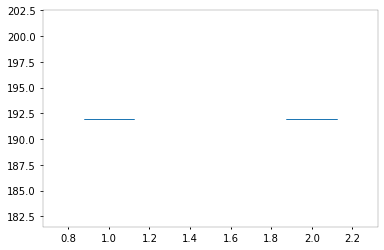

In [174]:
name='BioAndPlaAdRe001'

plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
bio_ext_t_BioAndPlaAdRe001=get_mutant_timing(name=name, pop_name='_bio_pop', N=N, k=4)
pla_ext_t_BioAndPlaAdRe001=get_mutant_timing(name=name, pop_name='_pla_pop', N=N, k=4)

plt.violinplot([pla_ext_t_BioAndPlaAdRe001,bio_ext_t_BioAndPlaAdRe001])

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

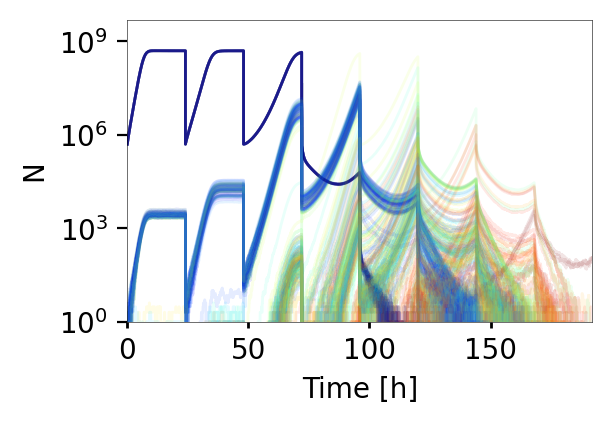

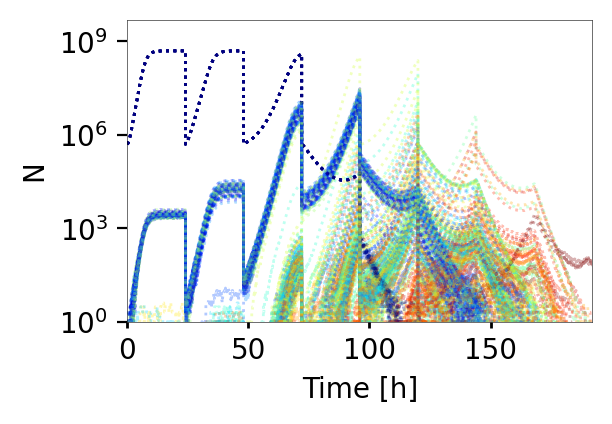

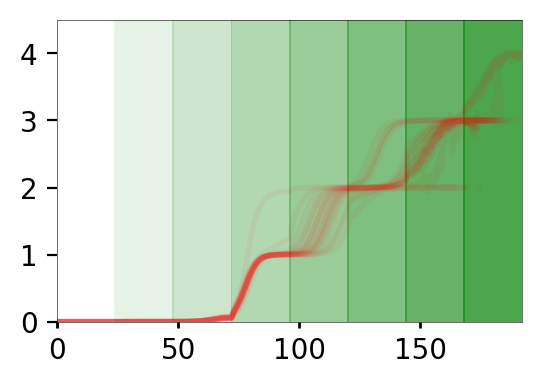

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

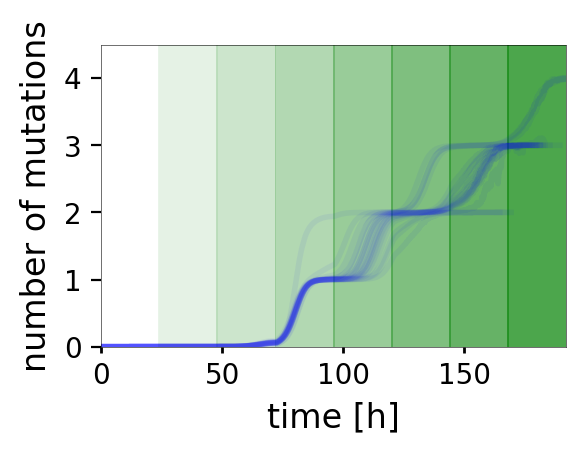

done


{'bodies': [<matplotlib.collections.PolyCollection at 0x7fc36caf4910>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fc36caf4760>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fc2fd5cb700>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fc2fd5cb9d0>}

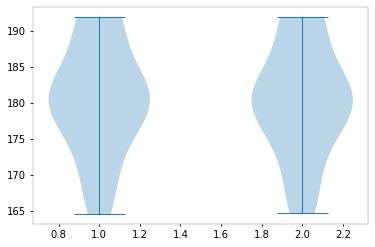

In [175]:
name='BioAndPlaAdRe01'

plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
bio_ext_t_BioAndPlaAdRe01=get_mutant_timing(name=name, pop_name='_bio_pop', N=N, k=4)
pla_ext_t_BioAndPlaAdRe01=get_mutant_timing(name=name, pop_name='_pla_pop', N=N, k=4)

plt.violinplot([pla_ext_t_BioAndPlaAdRe01,bio_ext_t_BioAndPlaAdRe01])

<ipython-input-56-858680d8fcdf>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-56-858680d8fcdf>:39: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig1.show()
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)


all done


<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:30: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:27: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

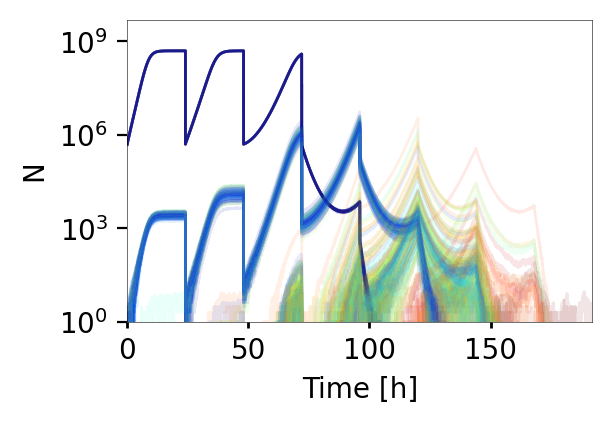

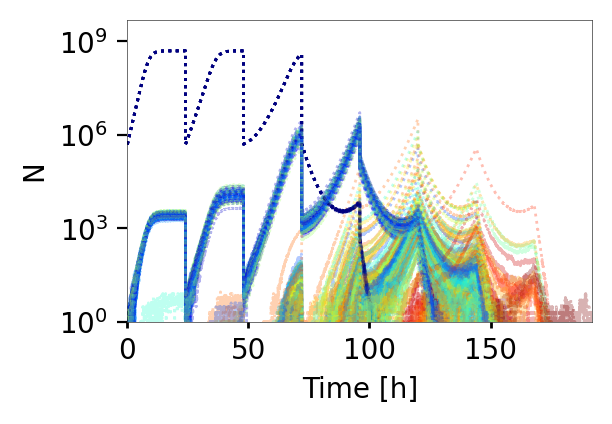

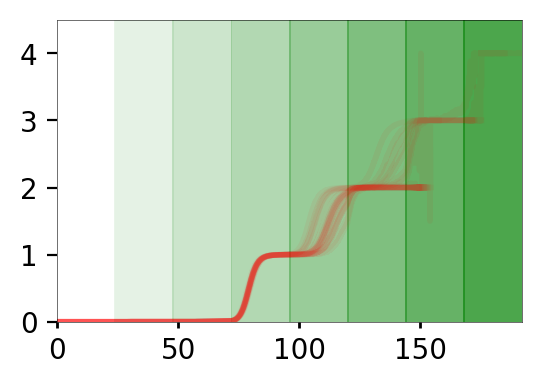

<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1)/np.sum(pop,1)
<ipython-input-69-69de03a2ee88>:55: RuntimeWarning: invalid value encountered in true_divide
  mean_mut=a/b#(a,b, out=np.zeros_like(a), where=b!=0)
<ipython-input-69-69de03a2ee88>:52: RuntimeWarning: invalid value encountered in true_divide
  mean_mut2=np.sum(weighted_pops,1

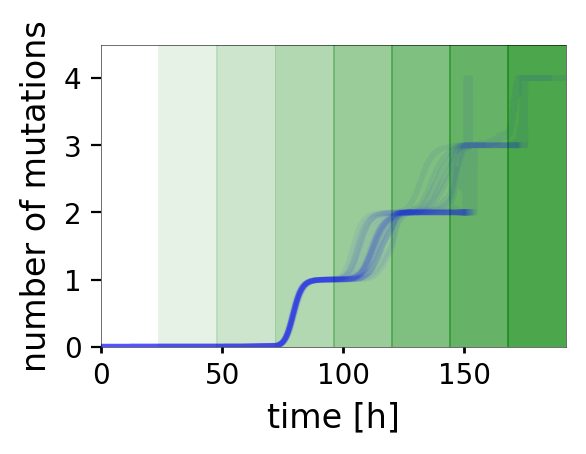

done


{'bodies': [<matplotlib.collections.PolyCollection at 0x7fc36d8d0ca0>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fc36d8d08e0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fc3748db880>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fc33078a2e0>}

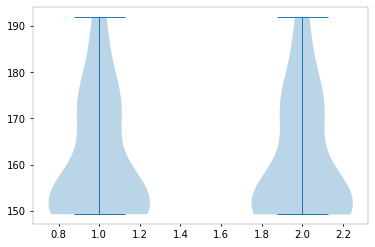

In [176]:
name='BioAndPlaAdRe1'

plot_all_dynamics(name=name, N=N)
get_mean_mut_num(name=name, N=N, color='b', k=4)
bio_ext_t_BioAndPlaAdRe1=get_mutant_timing(name=name, pop_name='_bio_pop', N=N, k=4)
pla_ext_t_BioAndPlaAdRe1=get_mutant_timing(name=name, pop_name='_pla_pop', N=N, k=4)

plt.violinplot([pla_ext_t_BioAndPlaAdRe1,bio_ext_t_BioAndPlaAdRe1])

Text(0.5, 0, 'Attachment and dispersal rate')

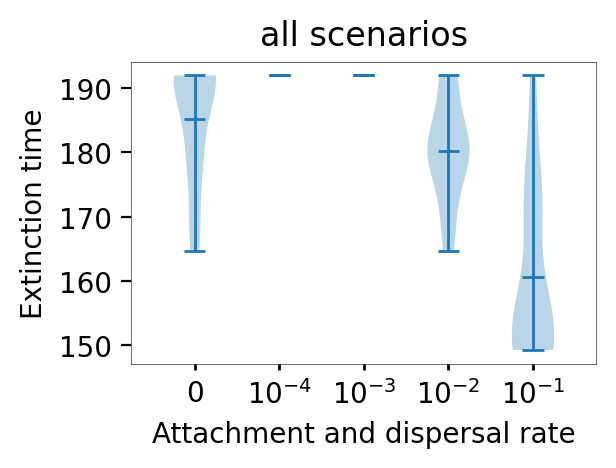

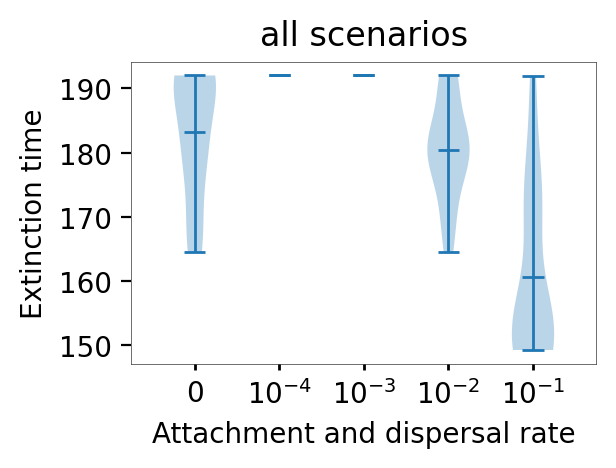

In [428]:
labels=['0',r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$',r'$10^{-1}$']
fig1, ax1 = plt.subplots(dpi=200, figsize=(3,2))
plt.violinplot([  bio_ext_t_BioAndPlaAdRe0,  bio_ext_t_BioAndPlaAdRe0001,bio_ext_t_BioAndPlaAdRe001,bio_ext_t_BioAndPlaAdRe01, bio_ext_t_BioAndPlaAdRe1], showmeans=True)
set_axis_style(ax1, labels)
plt.title('all scenarios')
plt.ylabel('Extinction time')
plt.xlabel('Attachment and dispersal rate')
#plt.savefig('00extinction_ByInteractionBio.png', dpi=200,bbox_inches='tight' )

labels=['0',r'$10^{-4}$', r'$10^{-3}$', r'$10^{-2}$',r'$10^{-1}$']
#labels = [ '0.1', '0.01', '0.001', '0.0001',' 0.0']
fig1, ax1 = plt.subplots(dpi=200, figsize=(3,2))
plt.violinplot([pla_ext_t_BioAndPlaAdRe0, pla_ext_t_BioAndPlaAdRe0001,  pla_ext_t_BioAndPlaAdRe001,  pla_ext_t_BioAndPlaAdRe01, pla_ext_t_BioAndPlaAdRe1], showmeans=True)
set_axis_style(ax1, labels)
plt.title('all scenarios')
plt.ylabel('Extinction time')
plt.xlabel('Attachment and dispersal rate')
#plt.savefig('00extinction_ByInteraction.png', dpi=200,bbox_inches='tight' )

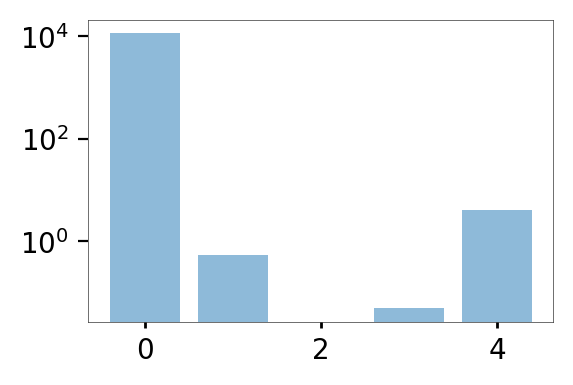

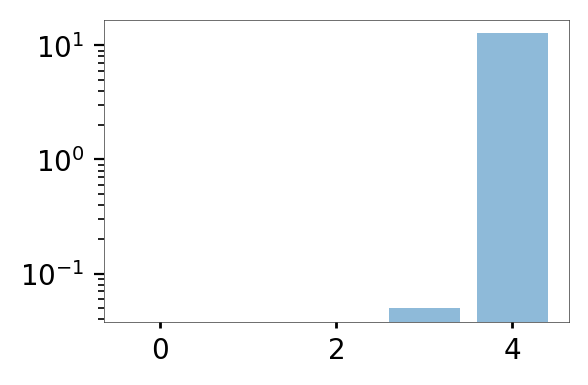

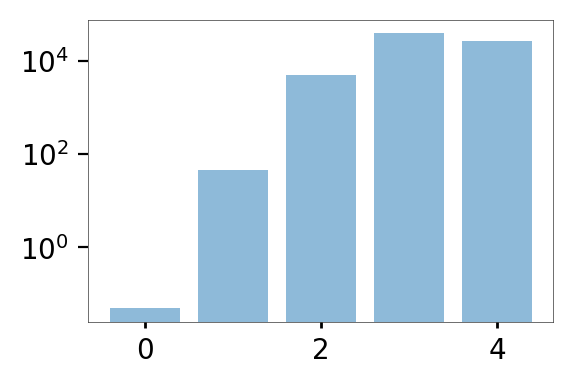

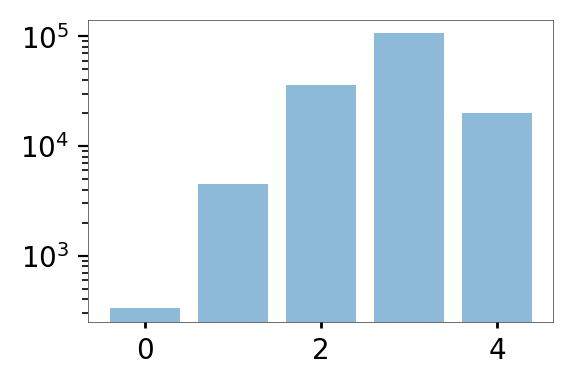

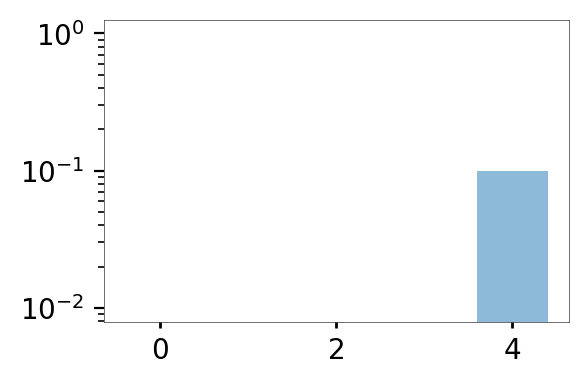

In [199]:
N=20
k=4
name='BioAndPlaAdRe0'
Bfinal_composition0=get_mean_final_pop(name=name, N=N, k=k)
name='BioAndPlaAdRe01'
Bfinal_composition01=get_mean_final_pop(name=name, N=N, k=k)
name='BioAndPlaAdRe001'
Bfinal_composition001=get_mean_final_pop(name=name, N=N, k=k)
name='BioAndPlaAdRe0001'
Bfinal_composition0001=get_mean_final_pop(name=name, N=N, k=k)
name='BioAndPlaAdRe1'
Bfinal_composition1=get_mean_final_pop(name=name, N=N, k=k)

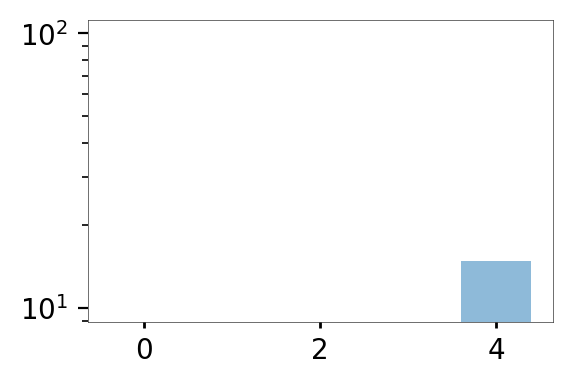

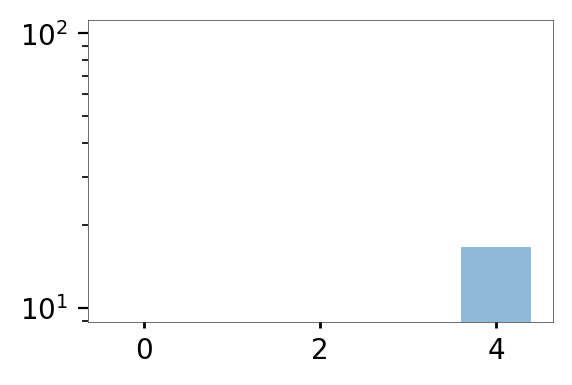

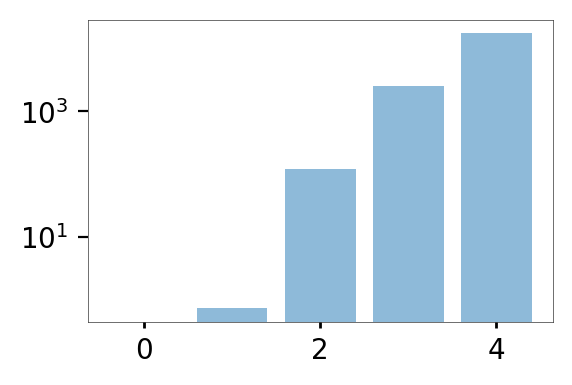

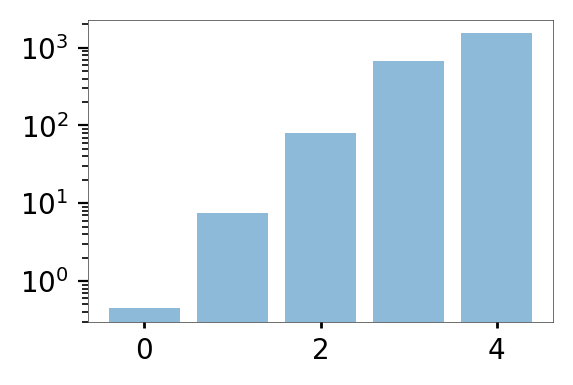

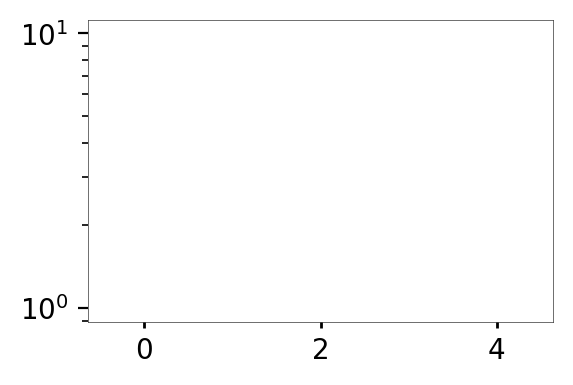

In [200]:
N=20
k=4
addname='_pla_pop.txt'
name='BioAndPlaAdRe0'
Pfinal_composition0=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='BioAndPlaAdRe01'
Pfinal_composition01=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='BioAndPlaAdRe001'
Pfinal_composition001=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='BioAndPlaAdRe0001'
Pfinal_composition0001=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)
name='BioAndPlaAdRe1'
Pfinal_composition1=get_mean_final_pop(name=name,addname=addname,  N=N, k=k)

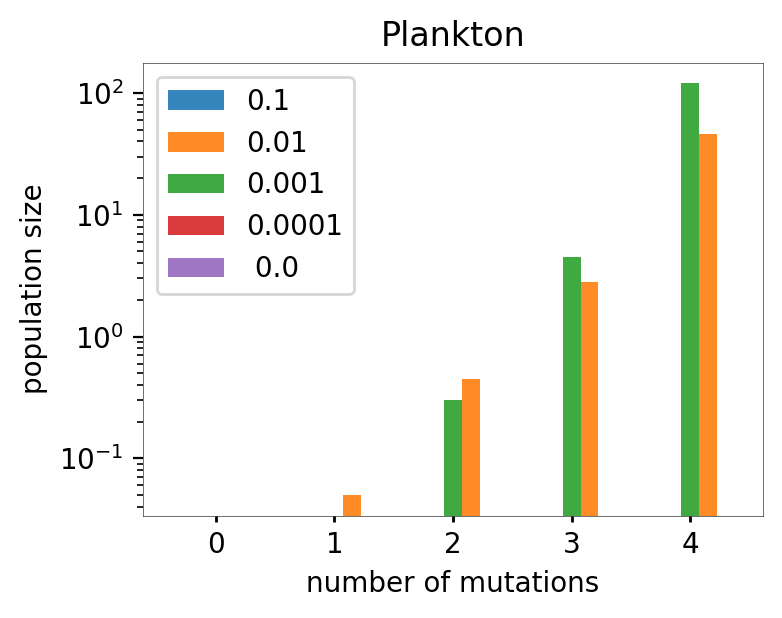

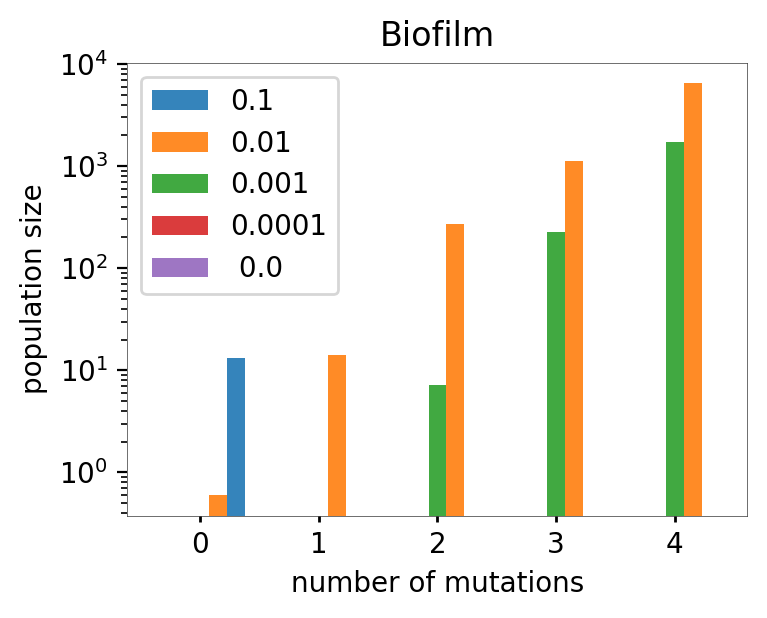

In [351]:
shift=0.15
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
x = np.array([0,1,2,3,4])
plt.bar(x+2*shift, Pfinal_composition0,shift, align='center', log=True, alpha=0.9)
plt.bar(x+1*shift, Pfinal_composition0001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-0*shift, Pfinal_composition001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-shift, Pfinal_composition01,shift, align='center', log=True, alpha=0.9)
plt.bar(x-2*shift, Pfinal_composition1,shift, align='center', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('Plankton')
plt.legend([ '0.1', '0.01', '0.001', '0.0001',' 0.0'])
plt.savefig('00PlaFinalComposition.png',  dpi=200,bbox_inches='tight')

shift=0.15
fig1, ax1 = plt.subplots(dpi=200, figsize=(4,3))
x = np.array([0,1,2,3,4])
plt.bar(x+2*shift, Bfinal_composition0,shift, align='center', log=True, alpha=0.9)
plt.bar(x+1*shift, Bfinal_composition0001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-0*shift, Bfinal_composition001,shift, align='center', log=True, alpha=0.9)
plt.bar(x-shift, Bfinal_composition01,shift, align='center', log=True, alpha=0.9)
plt.bar(x-2*shift, Bfinal_composition1,shift, align='center', log=True, alpha=0.9)
plt.xlabel('number of mutations')
plt.ylabel('population size')
plt.title('Biofilm')
plt.legend([ '0.1', '0.01', '0.001', '0.0001',' 0.0'])
plt.savefig('00BioFinalComposition.png',  dpi=200,bbox_inches='tight')

In [371]:
print(ylocs, ylabels)

[1.e-04 1.e-02 1.e+00 1.e+02 1.e+04 1.e+06] <a list of 6 Text major ticklabel objects>


[1.e-06 1.e-04 1.e-02 1.e+00 1.e+02 1.e+04 1.e+06] <a list of 7 Text major ticklabel objects>


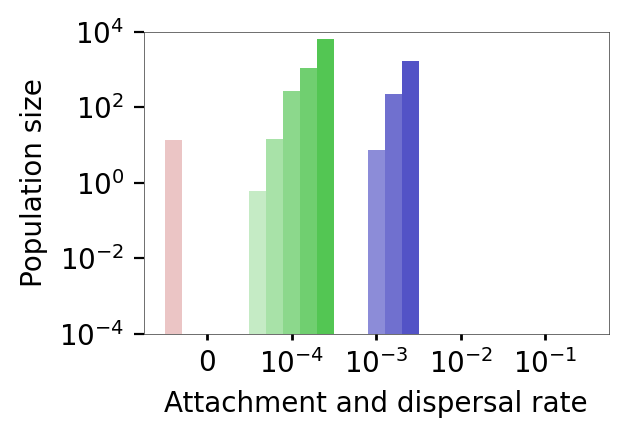

# Get sizes for diamond graph

0.0
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[6. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
1.0
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[6. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
1.9993055555555557
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[6. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
2.9986111111111113
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[7. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
3.997916666666667
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[7. 1. 1. 0. 2. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0.]
4.997222222222223
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[7. 1. 1. 0. 2. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0.]
5.996527777777778
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[7. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
6.995833333333334
[0. 1. 1. 2. 1. 2. 2. 3. 1. 2. 2. 3. 2. 3. 3. 4.]
[6. 2. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


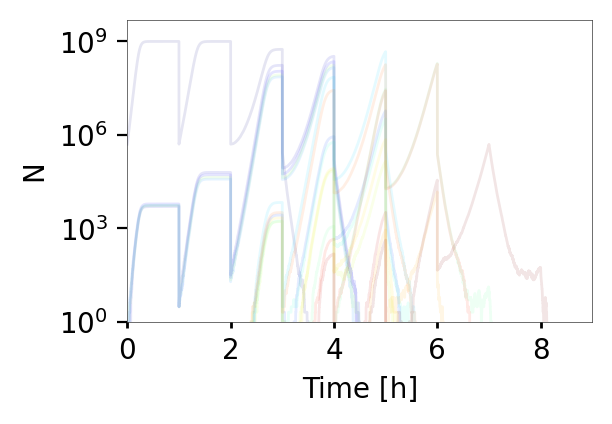

In [420]:
name='LongBioAndPlaAdRe00'
fig1, ax1 = plt.subplots(dpi=200, figsize=(3, 2))
ax1.set_prop_cycle('color', [plt.cm.jet(i) for i in np.linspace(0, 1, 2**4)])
this_time=np.loadtxt(name+'_time.txt')
this_time=this_time/60/24
this_conc=np.loadtxt(name+'_conc.txt')
dynamics_pla=np.loadtxt(name+'_pla_pop.txt')
dynamics_bio=np.loadtxt(name+'_bio_pop.txt')
plt.semilogy(this_time, dynamics_pla, alpha=0.1)
plt.xlabel('Time [h]')
plt.ylabel('N')
plt.ylim(1,5*10**9)
plt.xlim(0,9)
g=generate_genotypes(4)

for i in range (8):
    print (this_time[i*60*24])
    print (np.sum(g,1))
    this= (np.round(np.log10(dynamics_bio[i*60*24]+1)))
    print (this)
    #print (np.round(np.log10(dynamics_bio[i*60*24])))

In [431]:
print (g)

[[0. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 1. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 1.]
 [0. 1. 1. 0.]
 [0. 1. 1. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 1.]
 [1. 0. 1. 0.]
 [1. 0. 1. 1.]
 [1. 1. 0. 0.]
 [1. 1. 0. 1.]
 [1. 1. 1. 0.]
 [1. 1. 1. 1.]]
